In [2]:
# STEP 1: Load & Validate MOEX wide Excel (prints per-ticker + saves to Downloads)
# Requirements: pandas>=1.5, openpyxl (for .xlsx), pyarrow (for parquet, optional but recommended)

import os
import re
import warnings
from datetime import datetime

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# --------------------
# CONFIG (edit paths only if needed)
# --------------------
EXCEL_PATH   = "/Users/lacinustunkal/Desktop/MOEX_FULL_CALENDAR_26_1998_2025.xlsx"
EVENTS_PATH  = "/Users/lacinustunkal/Desktop/events_master.csv"   # not used yet, just sanity check
DOWNLOADS    = "/Users/lacinustunkal/Downloads"

# Ticker -> Sector (excluding SVCB as requested)
TICKER_SECTOR = {
    "SBER":"Banks","VTBR":"Banks","TCSG":"Banks","CBOM":"Banks",
    "LKOH":"OilGas","SNGSP":"OilGas","SIBN":"OilGas","TATN":"OilGas","NVTK":"OilGas","GAZP":"OilGas","ROSN":"OilGas",
    "GMKN":"Metals","CHMF":"Metals","NLMK":"Metals","MAGN":"Metals","PLZL":"Metals","RUAL":"Metals",
    "AKRN":"Chemicals","PHOR":"Chemicals",
    "MGNT":"Consumer","PIKK":"Consumer","AFKS":"Consumer",
    "RTKM":"IT","MTSS":"IT","YNDX":"IT"
}
EXPECTED_FIELDS = ["close", "high", "low", "open", "volume"]

# Output file names
VALIDATION_CSV = os.path.join(DOWNLOADS, "moex_validation_report.csv")
CLEAN_PARQUET  = os.path.join(DOWNLOADS, "moex_wide_clean.parquet")
CLEAN_CSV_FALLBACK = os.path.join(DOWNLOADS, "moex_wide_clean.csv")

def _ensure_downloads_dir(path):
    if not os.path.isdir(path):
        raise FileNotFoundError(f"Downloads folder not found: {path}")
    return path

def load_wide_excel(path: str) -> pd.DataFrame:
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Excel file not found at: {path}")
    # Read, keep raw headers
    df = pd.read_excel(path, engine="openpyxl")
    if df.shape[1] < 2:
        raise ValueError("Expected at least 2 columns (datetime + OHLCV), got fewer.")
    # First column must be datetime-like
    date_col = df.columns[0]
    df.rename(columns={date_col: "date"}, inplace=True)
    df["date"] = pd.to_datetime(df["date"], errors="coerce")
    bad_dates = df["date"].isna().sum()
    if bad_dates > 0:
        warnings.warn(f"{bad_dates} rows have non-parsable dates; they will be dropped.")
        df = df.loc[df["date"].notna()].copy()
    # Sort, drop duplicate dates keeping first
    df.sort_values("date", inplace=True)
    dup = df["date"].duplicated().sum()
    if dup > 0:
        warnings.warn(f"Found {dup} duplicate date rows; keeping first occurrence.")
        df = df[~df["date"].duplicated(keep="first")].copy()
    df.set_index("date", inplace=True)
    # Coerce numeric for all OHLCV columns
    for col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")
    return df

def standardize_and_check_columns(df: pd.DataFrame, tickers: dict) -> pd.DataFrame:
    """
    Keep only columns matching TICKER_field with field in EXPECTED_FIELDS.
    Case-insensitive match; normalize to UpperTicker_lowerfield (e.g., 'AFKS_close').
    """
    pat = re.compile(r"^([A-Za-z0-9]+)_(close|high|low|open|volume)$", flags=re.IGNORECASE)
    keep_cols, extra_cols = {}, []
    for col in df.columns:
        m = pat.match(col.strip())
        if m:
            t_raw, f_raw = m.groups()
            t = t_raw.upper()
            f = f_raw.lower()
            if t in tickers:
                norm = f"{t}_{f}"
                keep_cols[col] = norm
            else:
                extra_cols.append(col)
        else:
            extra_cols.append(col)

    if extra_cols:
        print(f"[INFO] {len(extra_cols)} columns do not match expected 'TICKER_field' pattern "
              f"or are for excluded/unknown tickers. They will be ignored.")

    df2 = df.loc[:, list(keep_cols.keys())].copy()
    df2.rename(columns=keep_cols, inplace=True)

    missing = []
    for t in tickers:
        for f in EXPECTED_FIELDS:
            name = f"{t}_{f}"
            if name not in df2.columns:
                missing.append(name)
    if missing:
        print(f"[WARN] Missing {len(missing)} expected columns. First few:")
        for m in missing[:20]:
            print("   -", m)

    ordered_cols = []
    for t in tickers:
        for f in EXPECTED_FIELDS:
            c = f"{t}_{f}"
            if c in df2.columns:
                ordered_cols.append(c)
    df2 = df2.reindex(columns=ordered_cols)
    return df2

def validate_ticker_block(df: pd.DataFrame, ticker: str) -> dict:
    out = {"ticker": ticker}
    cols = {f: f"{ticker}_{f}" for f in EXPECTED_FIELDS}
    s = {k: df[cols[k]] if cols[k] in df.columns else pd.Series(index=df.index, dtype=float) for k in cols}

    valid_close = s["close"].where(s["close"] > 0).dropna()
    listing_start = valid_close.index.min() if not valid_close.empty else pd.NaT
    out["listing_start"] = listing_start

    last_valid = s["close"].dropna().index.max() if s["close"].notna().any() else pd.NaT
    out["last_valid_close"] = last_valid

    n_total = len(df)
    out["rows_total"] = n_total
    listed_mask = (df.index >= listing_start) if pd.notna(listing_start) else pd.Series(False, index=df.index)
    out["rows_listed"] = int(listed_mask.sum())

    def any_missing_ohlc(idx):
        vals = [s["open"].get(idx, np.nan), s["high"].get(idx, np.nan),
                s["low"].get(idx, np.nan), s["close"].get(idx, np.nan)]
        return any(pd.isna(v) for v in vals)

    if pd.notna(listing_start):
        idx_after = df.index[df.index >= listing_start]
        missing_ohlc = sum(any_missing_ohlc(i) for i in idx_after)
    else:
        missing_ohlc = np.nan
    out["missing_ohlc_after_listing"] = missing_ohlc if not np.isnan(missing_ohlc) else 0

    vol = s["volume"]
    zero_vol_post = int(((vol == 0) & listed_mask).sum()) if not vol.empty else 0
    neg_vol_post  = int(((vol < 0) & listed_mask).sum()) if not vol.empty else 0
    out["zero_volume_post_listing"] = zero_vol_post
    out["negative_volume_post_listing"] = neg_vol_post

    nonpos = 0
    for f in ["open", "high", "low", "close"]:
        series = s[f]
        if not series.empty:
            nonpos += int(((series <= 0) & series.notna()).sum())
    out["nonpositive_price_values"] = nonpos

    ohlc_df = pd.concat([s["open"], s["high"], s["low"], s["close"]], axis=1, keys=["open","high","low","close"])
    ohlc_df = ohlc_df.dropna(how="any")
    inconsistent = int(((ohlc_df["high"] < ohlc_df["low"]) |
                        (ohlc_df["open"] > ohlc_df["high"]) |
                        (ohlc_df["open"] < ohlc_df["low"])  |
                        (ohlc_df["close"] > ohlc_df["high"])|
                        (ohlc_df["close"] < ohlc_df["low"])).sum())
    out["ohlc_inconsistencies"] = inconsistent
    return out

def pretty_print_ticker_report(row: pd.Series, sector: str):
    t = row["ticker"]; ls = row["listing_start"]; le = row["last_valid_close"]
    print(f"\n=== {t} ({sector}) ===")
    print(f"  Listing start:      {ls.date() if pd.notna(ls) else '—'}")
    print(f"  Last valid close:   {le.date() if pd.notna(le) else '—'}")
    print(f"  Rows total/listed:  {int(row['rows_total'])} / {int(row['rows_listed'])}")
    print(f"  Missing OHLC post:  {int(row['missing_ohlc_after_listing'])}")
    print(f"  Zero vol (listed):  {int(row['zero_volume_post_listing'])}")
    print(f"  Neg vol (listed):   {int(row['negative_volume_post_listing'])}")
    print(f"  Non+ price values:  {int(row['nonpositive_price_values'])}")
    print(f"  OHLC inconsist.:    {int(row['ohlc_inconsistencies'])}")

def save_clean_wide(df: pd.DataFrame):
    try:
        df.to_parquet(CLEAN_PARQUET, engine="pyarrow", index=True)
        print(f"\n[OK] Clean wide Parquet saved → {CLEAN_PARQUET}")
    except Exception as e:
        warnings.warn(f"Parquet save failed ({e}); falling back to CSV.")
        df.to_csv(CLEAN_CSV_FALLBACK, index=True)
        print(f"[OK] Clean wide CSV saved → {CLEAN_CSV_FALLBACK}")

def main():
    _ensure_downloads_dir(DOWNLOADS)
    print("Loading Excel…")
    df_raw = load_wide_excel(EXCEL_PATH)
    start_date, end_date = df_raw.index.min(), df_raw.index.max()
    print(f"[Loaded] Rows: {len(df_raw):,} | Date range: {start_date.date()} → {end_date.date()} | Columns: {df_raw.shape[1]}")

    print("\nStandardizing columns & keeping expected tickers/fields…")
    df_wide = standardize_and_check_columns(df_raw, TICKER_SECTOR)
    n_cols_expected = sum(1 for t in TICKER_SECTOR for _ in EXPECTED_FIELDS)
    print(f"[Info] Standardized columns kept: {df_wide.shape[1]} (expected up to {n_cols_expected})")

    # Quick events file sanity (optional now)
    if os.path.isfile(EVENTS_PATH):
        try:
            ev = pd.read_csv(EVENTS_PATH)
            if "date" in ev.columns:
                ev["date"] = pd.to_datetime(ev["date"], errors="coerce")
                ev_ok = ev["date"].notna().sum()
                print(f"[Events] Loaded events CSV with {len(ev):,} rows ({ev_ok:,} parsable dates).")
            else:
                print("[Events] CSV found, but no 'date' column detected.")
        except Exception as e:
            print(f"[Events] Could not read events CSV: {e}")
    else:
        print("[Events] CSV path not found (not needed for Step 1).")

    print("\nValidating tickers (25, excluding SVCB)…")
    reports = []
    for t, sector in TICKER_SECTOR.items():
        rep = validate_ticker_block(df_wide, t)
        reports.append(rep)
        pretty_print_ticker_report(pd.Series(rep), sector)

    val_df = pd.DataFrame(reports).sort_values(["listing_start", "ticker"], na_position="last")
    val_df["sector"] = val_df["ticker"].map(TICKER_SECTOR)
    val_df.to_csv(VALIDATION_CSV, index=False)
    print(f"\n[OK] Validation report saved → {VALIDATION_CSV}")

    save_clean_wide(df_wide)

    neg_prices_total = int(val_df["nonpositive_price_values"].sum())
    neg_vol_total    = int(val_df["negative_volume_post_listing"].sum())
    zero_vol_total   = int(val_df["zero_volume_post_listing"].sum())
    print("\nQC summary (post-listing scopes where relevant):")
    print(f"  Non-positive price entries (across OHLC): {neg_prices_total:,}")
    print(f"  Negative volume entries:                  {neg_vol_total:,}")
    print(f"  Zero-volume (non-trading) days:           {zero_vol_total:,}")
    print("\nStep 1 complete ✅")

if __name__ == "__main__":
    main()

Loading Excel…
[Loaded] Rows: 7,096 | Date range: 1998-07-24 → 2025-07-23 | Columns: 130

Standardizing columns & keeping expected tickers/fields…
[INFO] 5 columns do not match expected 'TICKER_field' pattern or are for excluded/unknown tickers. They will be ignored.
[Info] Standardized columns kept: 125 (expected up to 125)
[Events] Loaded events CSV with 26 rows (26 parsable dates).

Validating tickers (25, excluding SVCB)…

=== SBER (Banks) ===
  Listing start:      1998-07-27
  Last valid close:   2025-07-23
  Rows total/listed:  7096 / 7095
  Missing OHLC post:  364
  Zero vol (listed):  240
  Neg vol (listed):   0
  Non+ price values:  0
  OHLC inconsist.:    3

=== VTBR (Banks) ===
  Listing start:      2007-05-28
  Last valid close:   2025-07-23
  Rows total/listed:  7096 / 4778
  Missing OHLC post:  18
  Zero vol (listed):  0
  Neg vol (listed):   0
  Non+ price values:  0
  OHLC inconsist.:    0

=== TCSG (Banks) ===
  Listing start:      2019-10-28
  Last valid close:   2025

Plotting CLOSE price charts for 25 tickers…


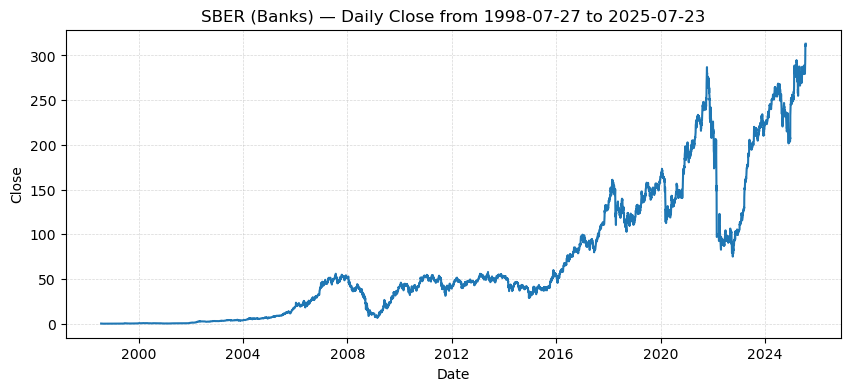

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/SBER_close.png (points: 6731)


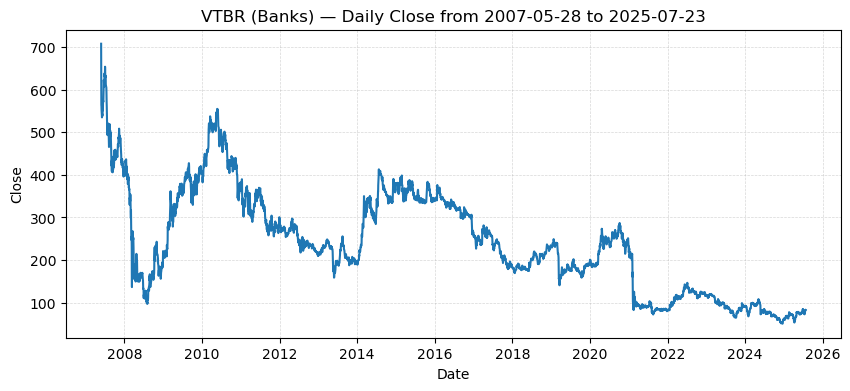

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/VTBR_close.png (points: 4760)


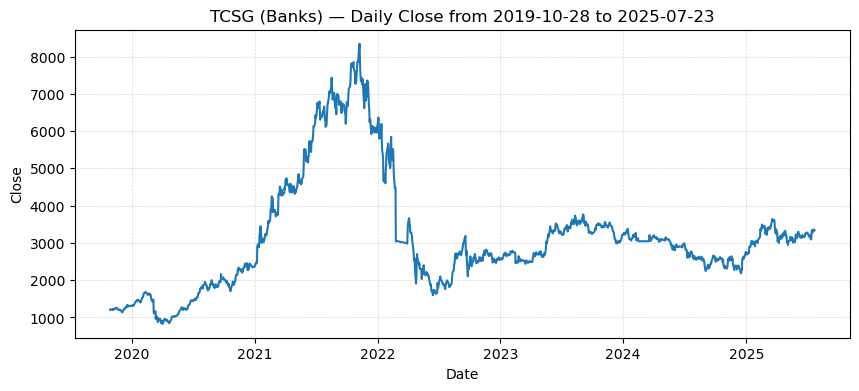

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/TCSG_close.png (points: 1508)


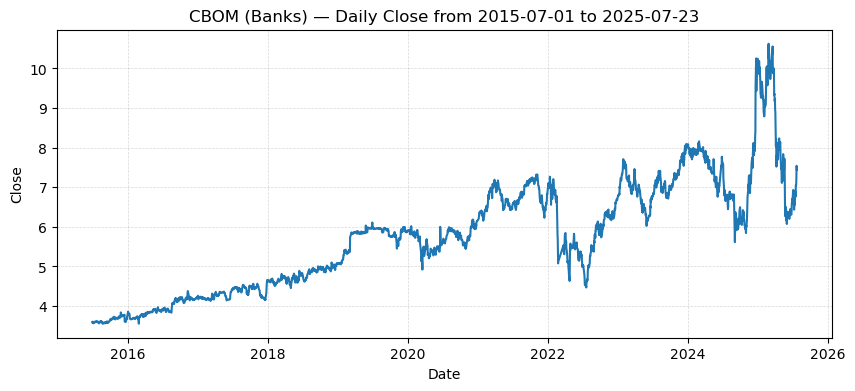

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/CBOM_close.png (points: 2553)


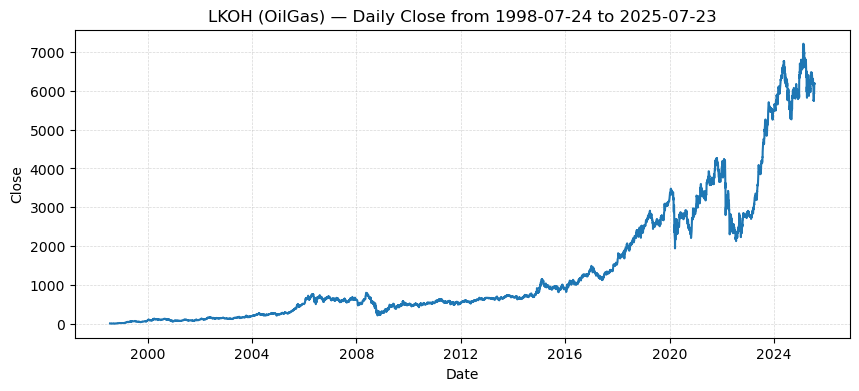

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/LKOH_close.png (points: 6755)


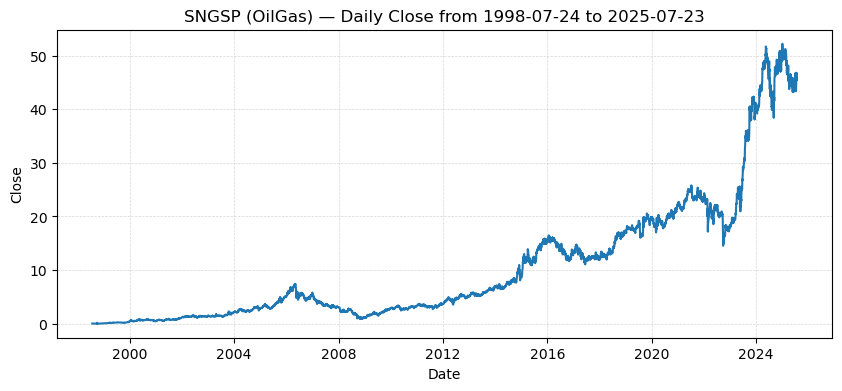

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/SNGSP_close.png (points: 6741)


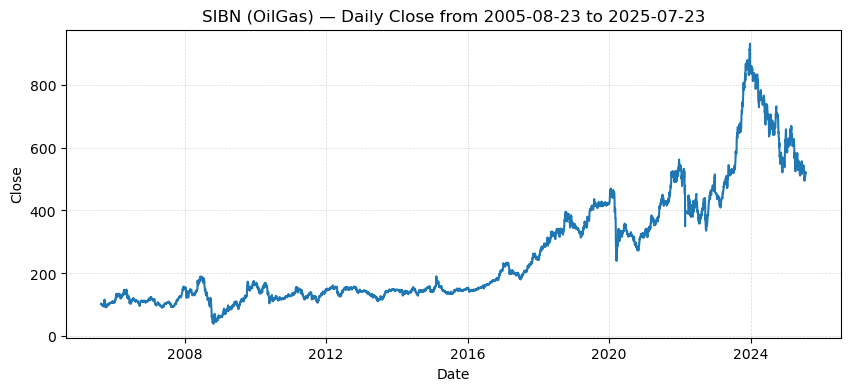

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/SIBN_close.png (points: 5215)


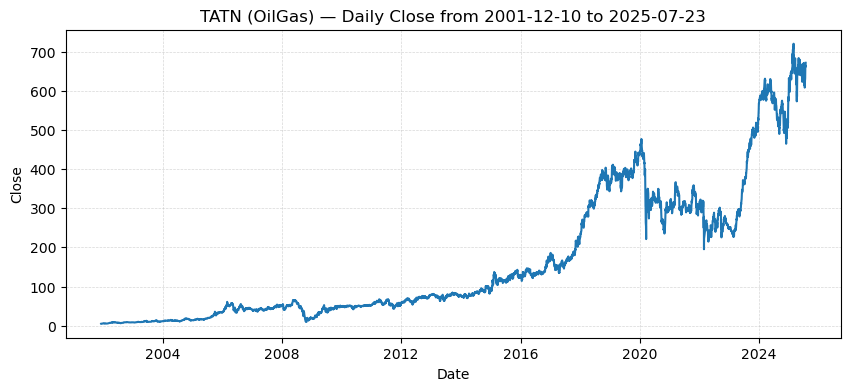

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/TATN_close.png (points: 5910)


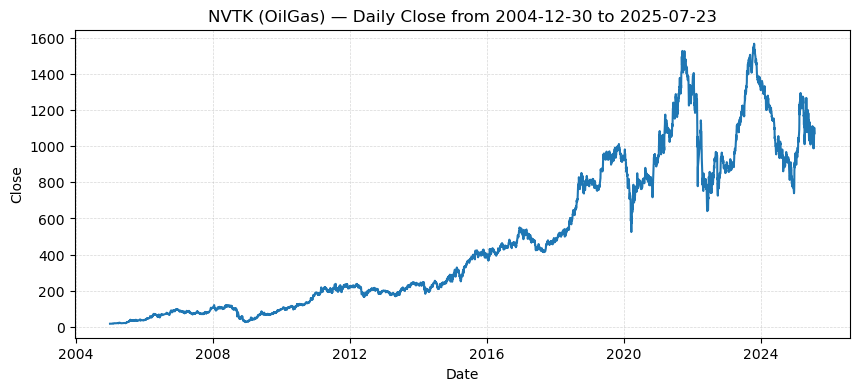

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/NVTK_close.png (points: 5033)


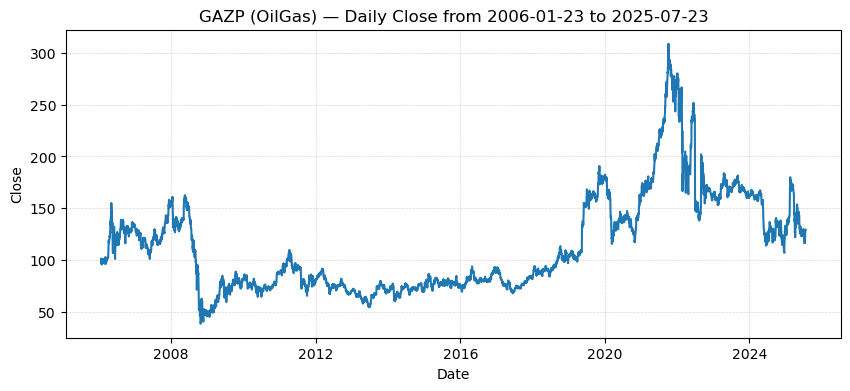

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/GAZP_close.png (points: 4907)


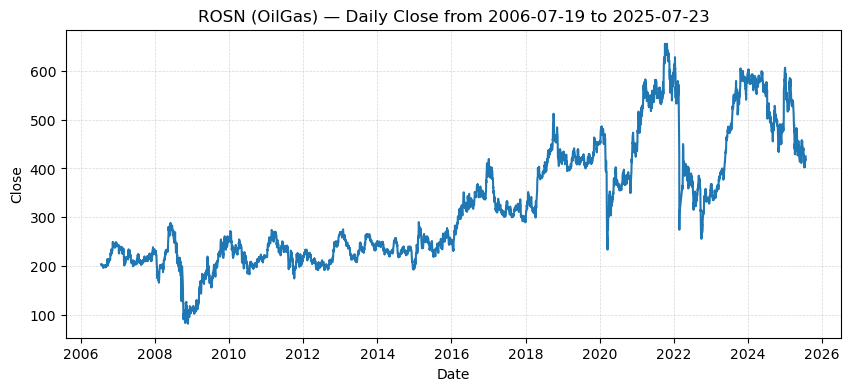

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/ROSN_close.png (points: 4980)


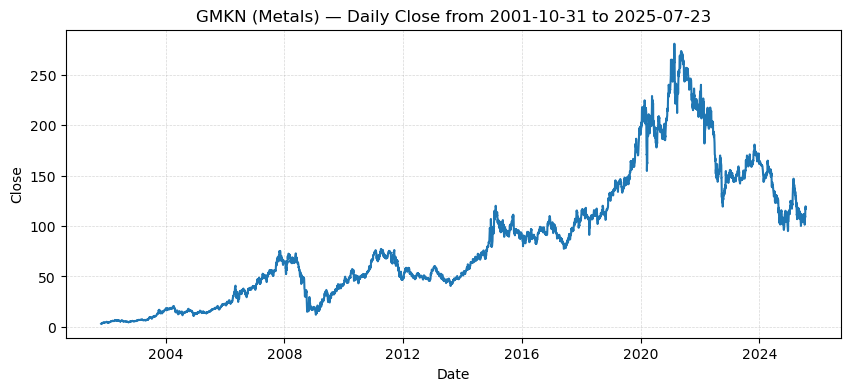

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/GMKN_close.png (points: 5945)


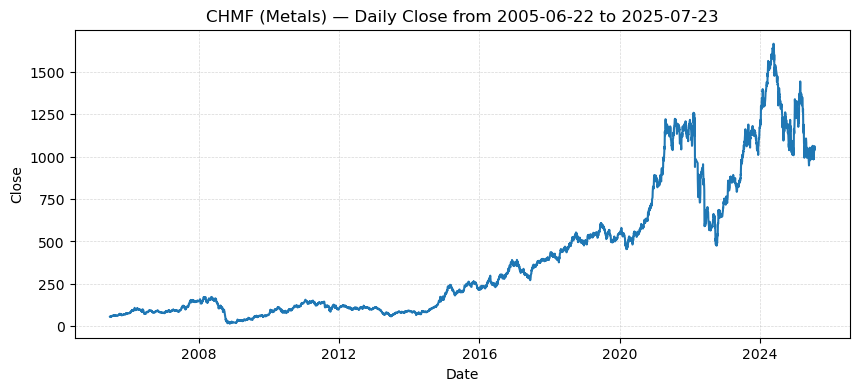

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/CHMF_close.png (points: 5037)


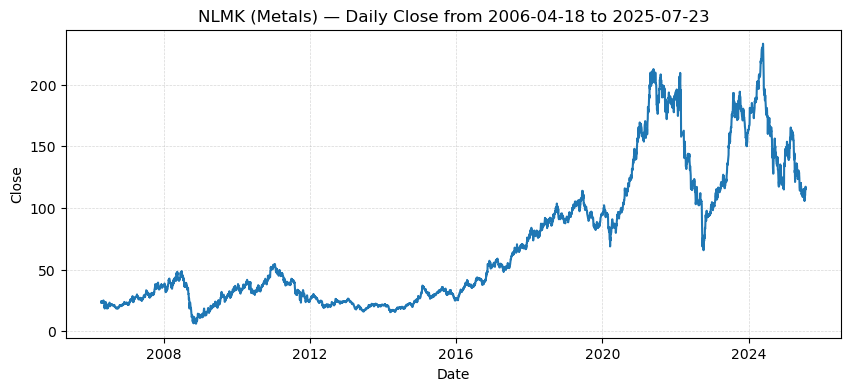

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/NLMK_close.png (points: 4840)


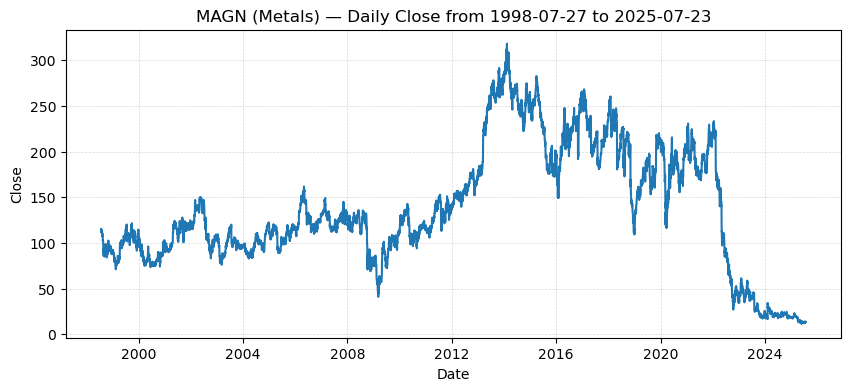

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/MAGN_close.png (points: 6789)


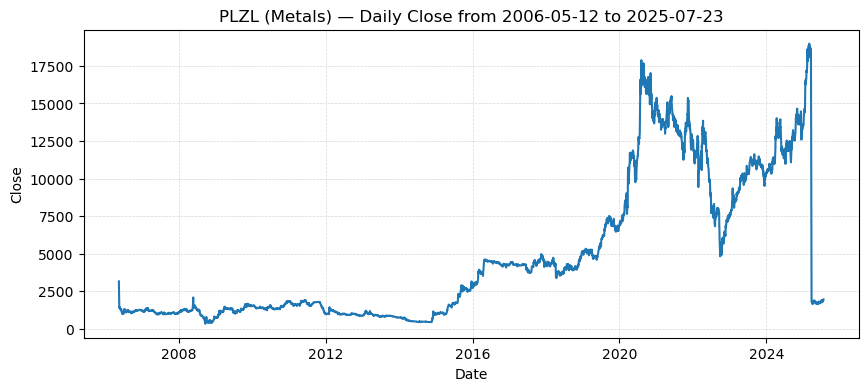

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/PLZL_close.png (points: 4821)


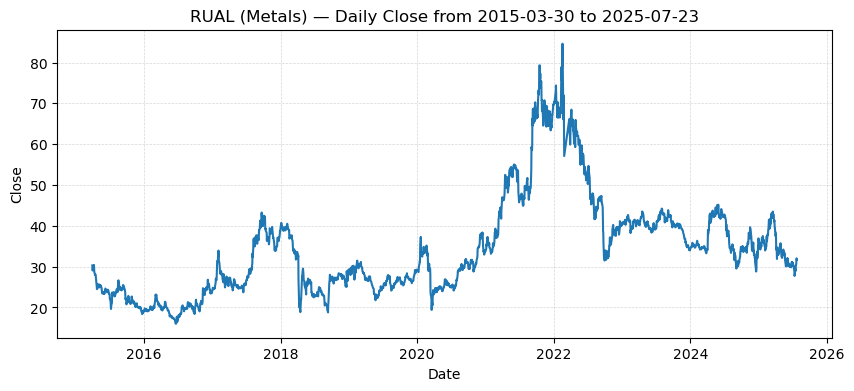

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/RUAL_close.png (points: 2605)


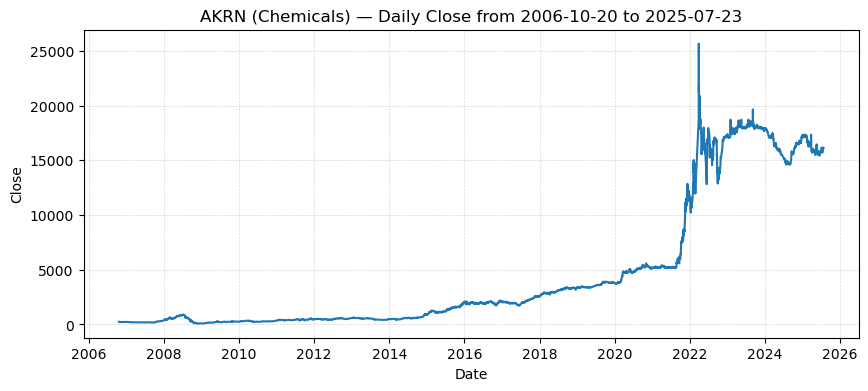

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/AKRN_close.png (points: 4697)


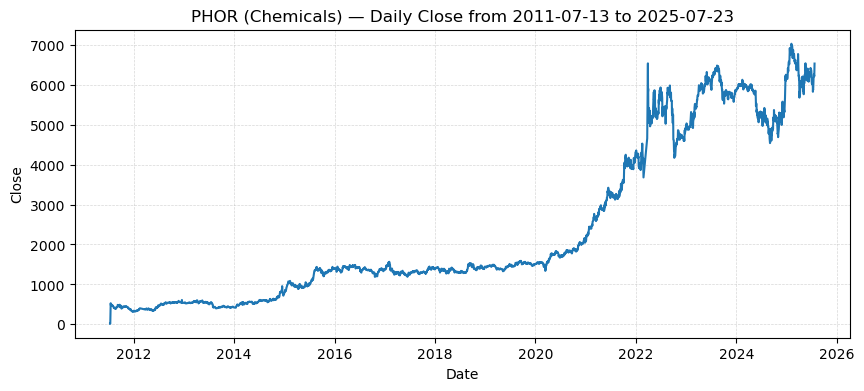

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/PHOR_close.png (points: 3519)


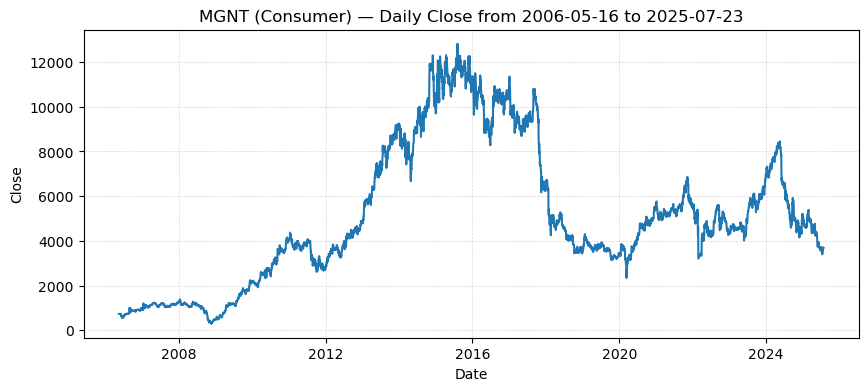

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/MGNT_close.png (points: 5026)


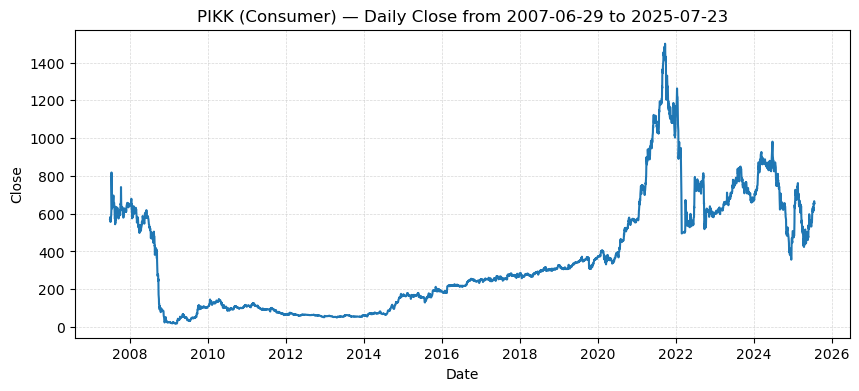

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/PIKK_close.png (points: 4532)


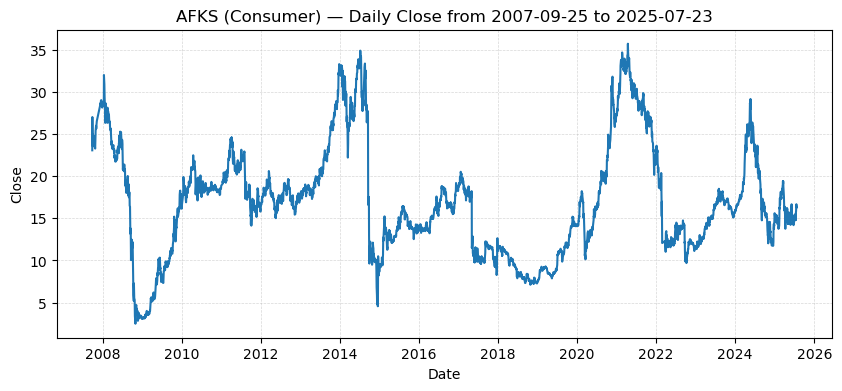

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/AFKS_close.png (points: 4450)


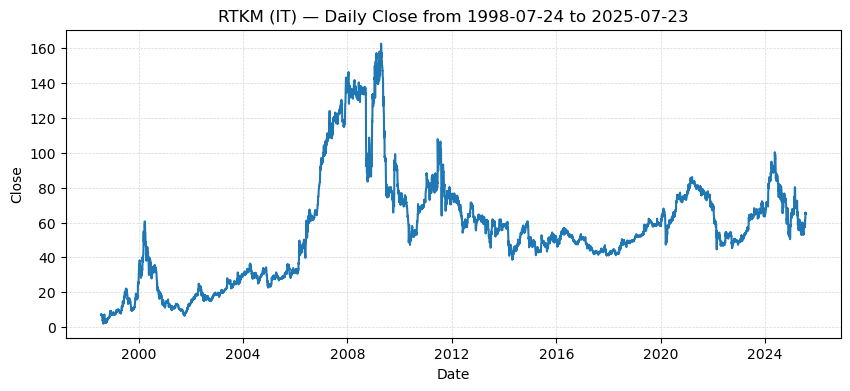

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/RTKM_close.png (points: 6739)


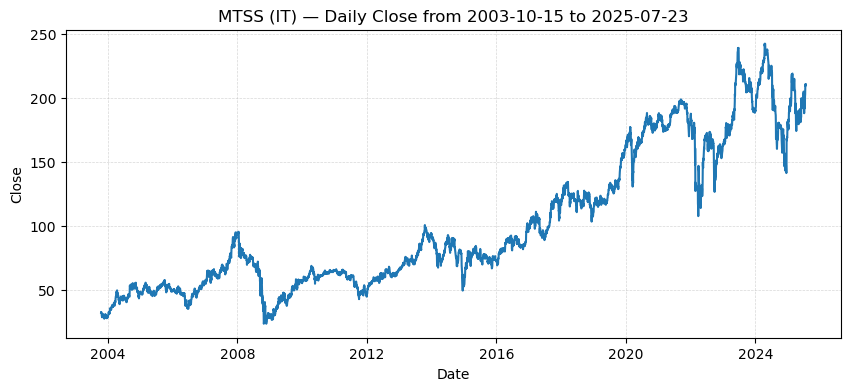

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/MTSS_close.png (points: 5440)


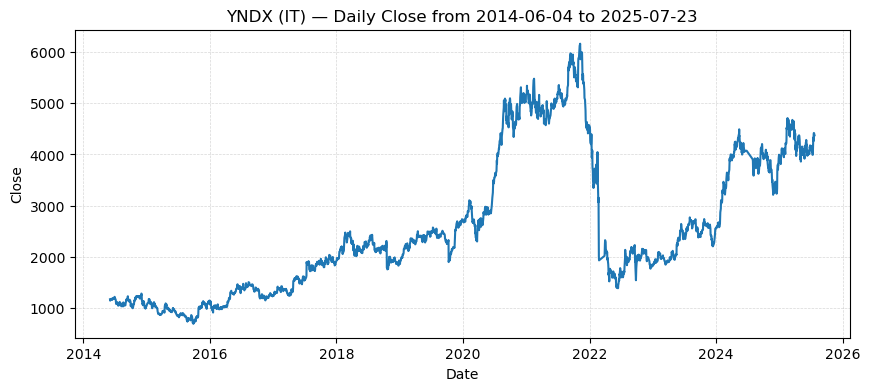

[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots/YNDX_close.png (points: 2785)

Done. Saved 25 charts → /Users/lacinustunkal/Downloads/moex_close_plots


In [3]:
# STEP 1B: Plot daily CLOSE for each stock from first valid date to last valid date (one chart per stock)

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

DOWNLOADS = "/Users/lacinustunkal/Downloads"
CLEAN_PARQUET = os.path.join(DOWNLOADS, "moex_wide_clean.parquet")
PLOTS_DIR = os.path.join(DOWNLOADS, "moex_close_plots")
os.makedirs(PLOTS_DIR, exist_ok=True)

TICKER_SECTOR = {
    "SBER":"Banks","VTBR":"Banks","TCSG":"Banks","CBOM":"Banks",
    "LKOH":"OilGas","SNGSP":"OilGas","SIBN":"OilGas","TATN":"OilGas","NVTK":"OilGas","GAZP":"OilGas","ROSN":"OilGas",
    "GMKN":"Metals","CHMF":"Metals","NLMK":"Metals","MAGN":"Metals","PLZL":"Metals","RUAL":"Metals",
    "AKRN":"Chemicals","PHOR":"Chemicals",
    "MGNT":"Consumer","PIKK":"Consumer","AFKS":"Consumer",
    "RTKM":"IT","MTSS":"IT","YNDX":"IT"
}

if "df_wide" not in globals():
    if not os.path.isfile(CLEAN_PARQUET):
        raise FileNotFoundError(f"Cannot find {CLEAN_PARQUET}. Run Step 1 first, or adjust the path.")
    df_wide = pd.read_parquet(CLEAN_PARQUET)

if not isinstance(df_wide.index, pd.DatetimeIndex):
    raise TypeError("df_wide must have a DatetimeIndex. Re-run Step 1.")
df_wide = df_wide.sort_index()

print(f"Plotting CLOSE price charts for {len(TICKER_SECTOR)} tickers…")
saved_count = 0

for tkr, sector in TICKER_SECTOR.items():
    col_close = f"{tkr}_close"
    if col_close not in df_wide.columns:
        print(f"[WARN] {col_close} not found, skipping {tkr}.")
        continue
    s = df_wide[col_close].astype(float)
    valid = s[(s > 0) & s.notna()]
    if valid.empty:
        print(f"[WARN] No valid close data for {tkr}, skipping.")
        continue

    start_date = valid.index.min()
    end_date   = valid.index.max()
    s_plot = s.loc[start_date:end_date].dropna()

    fig, ax = plt.subplots(figsize=(10, 4))
    locator = mdates.AutoDateLocator()
    formatter = mdates.ConciseDateFormatter(locator)

    ax.plot(s_plot.index, s_plot.values)
    ax.set_title(f"{tkr} ({sector}) — Daily Close from {start_date.date()} to {end_date.date()}")
    ax.set_xlabel("Date"); ax.set_ylabel("Close")
    ax.xaxis.set_major_locator(locator); ax.xaxis.set_major_formatter(formatter)
    ax.grid(True, which="both", linestyle="--", linewidth=0.5, alpha=0.5)

    out_path = os.path.join(PLOTS_DIR, f"{tkr}_close.png")
    fig.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.show(); plt.close(fig)

    saved_count += 1
    print(f"[OK] Saved: {out_path} (points: {len(s_plot)})")

print(f"\nDone. Saved {saved_count} charts → {PLOTS_DIR}")

PLZL split: announced ex-date 2025-03-25
  First trading day ON/AFTER ex-date  : 2025-03-27
  Last trading day BEFORE that         : 2025-03-21
  Raw close ratio pre/post ~ 10.183 (expected ~10.0)
  After adjustment: close[t0-1]_pa=1831.6929, close[t0+]_pa=1798.8482, gap=-1.793%


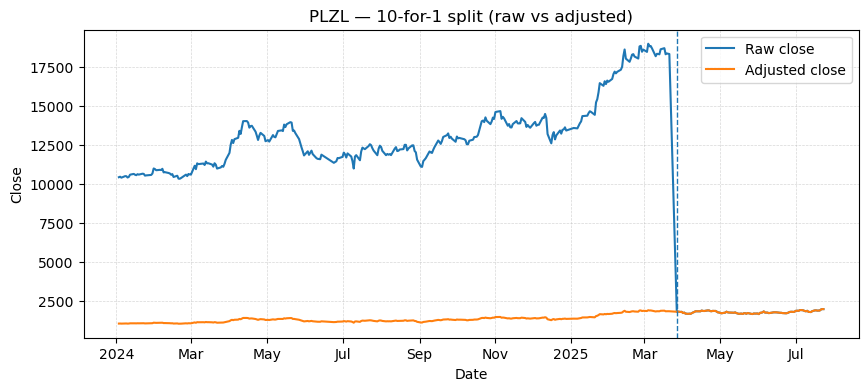

[OK] Saved overlay → /Users/lacinustunkal/Downloads/moex_actions_plots/PLZL_split_20250325_raw_vs_adjusted.png
[OK] Saved adjusted wide file → /Users/lacinustunkal/Downloads/moex_wide_clean_ca.parquet
Cell A complete


In [4]:
# CELL A — Apply PLZL 10-for-1 split on 2025-03-25 (create *_pa columns), verify, save

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

DOWNLOADS = "/Users/lacinustunkal/Downloads"
IN_PARQUET  = os.path.join(DOWNLOADS, "moex_wide_clean.parquet")
OUT_PARQUET = os.path.join(DOWNLOADS, "moex_wide_clean_ca.parquet") # "ca" = corporate actions
LEDGER_CSV  = os.path.join(DOWNLOADS, "moex_actions_ledger.csv")
PLOTS_DIR   = os.path.join(DOWNLOADS, "moex_actions_plots")
os.makedirs(PLOTS_DIR, exist_ok=True)

TICKER = "PLZL"
EX_DATE = pd.Timestamp("2025-03-25")
RATIO = 10.0

# ---- load
dfw = pd.read_parquet(IN_PARQUET).sort_index()
if not isinstance(dfw.index, pd.DatetimeIndex):
    raise TypeError("Expected a DatetimeIndex in the wide file.")

price_fields = ["open","high","low","close"]
src_price_cols = [f"{TICKER}_{f}" for f in price_fields]
src_vol_col    = f"{TICKER}_volume"
missing = [c for c in (src_price_cols + [src_vol_col]) if c not in dfw.columns]
if missing:
    raise KeyError(f"Missing PLZL columns: {missing}")

# ---- trading days around ex-date
valid_close = dfw[src_price_cols[-1]].dropna()
post_first = valid_close.index[valid_close.index >= EX_DATE]
post_first = post_first.min() if len(post_first) else pd.NaT
pre_last   = valid_close.index[valid_close.index < (post_first if pd.notna(post_first) else EX_DATE)]
pre_last   = pre_last.max() if len(pre_last) else pd.NaT

print(f"PLZL split: announced ex-date {EX_DATE.date()}")
print(f"  First trading day ON/AFTER ex-date  : {post_first.date() if pd.notna(post_first) else '—'}")
print(f"  Last trading day BEFORE that         : {pre_last.date() if pd.notna(pre_last) else '—'}")

if pd.isna(post_first):
    raise RuntimeError("Cannot find a trading day on/after the ex-date for PLZL. Check the data range.")

# ---- quick ratio check (guard against already-adjusted vendor data)
skip_adjust = False
approx_ratio = np.nan
if pd.notna(pre_last) and pd.notna(post_first):
    pre_close_raw  = float(dfw.loc[pre_last, f"{TICKER}_close"])
    post_close_raw = float(dfw.loc[post_first, f"{TICKER}_close"])
    approx_ratio   = pre_close_raw / post_close_raw if post_close_raw != 0 else np.nan
    print(f"  Raw close ratio pre/post ~ {approx_ratio:.3f} (expected ~{RATIO:.1f})")
    # If vendor already applied the split, pre/post ratio will be ~1
    if 0.8 <= approx_ratio <= 1.25:
        skip_adjust = True
        print("[INFO] Pre/post ratio ~1 ⇒ prices likely already split-adjusted by vendor. Skipping *_pa creation.")

# ---- ledger helper
def update_ledger(status, note):
    if os.path.isfile(LEDGER_CSV):
        ledger = pd.read_csv(LEDGER_CSV, parse_dates=["ex_date"])
    else:
        ledger = pd.DataFrame(columns=["ticker","action","ex_date","ratio","status","note"])
    rec = {"ticker": TICKER, "action": "split", "ex_date": EX_DATE, "ratio": RATIO,
           "status": status, "note": note}
    # idempotent append only if same record not present
    mask = (
        (ledger["ticker"]==TICKER) & (ledger["action"]=="split") &
        (ledger["ex_date"]==EX_DATE) & (ledger["ratio"]==RATIO) & (ledger["status"]==status)
    )
    if not mask.any():
        ledger = pd.concat([ledger, pd.DataFrame([rec])], ignore_index=True)
        ledger.to_csv(LEDGER_CSV, index=False)
        print(f"[OK] Ledger updated → {LEDGER_CSV} ({status})")

# ---- either skip or adjust
if skip_adjust:
    # Save through to *_ca file unchanged so downstream code finds the file
    try:
        dfw.to_parquet(OUT_PARQUET, engine="pyarrow", index=True)
        print(f"[OK] Saved (unchanged) wide file → {OUT_PARQUET}")
    except Exception as e:
        out_csv = os.path.join(DOWNLOADS, "moex_wide_clean_ca.csv")
        print(f"[WARN] Parquet save failed ({e}). Saving CSV instead: {out_csv}")
        dfw.to_csv(out_csv, index=True)
    update_ledger("skipped_vendor_adjusted", "Vendor prices appear already split-adjusted; no *_pa columns created.")
    print("Cell A complete")
else:
    # Apply split to all four prices pre-split; volume × ratio pre-split
    pre_mask = dfw.index < post_first

    for f in price_fields:
        src = f"{TICKER}_{f}"
        dst = f"{TICKER}_{f}_pa"
        if dst in dfw.columns:
            dfw.drop(columns=[dst], inplace=True)
        dfw[dst] = dfw[src].astype("float64")
        dfw.loc[pre_mask, dst] = dfw.loc[pre_mask, dst] / RATIO

    vol_dst = f"{TICKER}_volume_pa"
    if vol_dst in dfw.columns:
        dfw.drop(columns=[vol_dst], inplace=True)
    dfw[vol_dst] = dfw[src_vol_col].astype("float64")
    dfw.loc[pre_mask, vol_dst] = dfw.loc[pre_mask, vol_dst] * RATIO

    # ---- verify continuity (all OHLC around the cutover)
    if pd.notna(pre_last) and pd.notna(post_first):
        checks = {}
        for f in price_fields:
            pre_adj  = float(dfw.loc[pre_last, f"{TICKER}_{f}_pa"])
            post_adj = float(dfw.loc[post_first, f"{TICKER}_{f}_pa"])
            checks[f] = (pre_adj, post_adj, (post_adj/pre_adj - 1.0) if pre_adj>0 else np.nan)
        gap_pct = (checks["close"][2] * 100.0) if np.isfinite(checks["close"][2]) else np.nan
        print(f"  After adjustment: close[t0-1]_pa={checks['close'][0]:.4f}, "
              f"close[t0+]_pa={checks['close'][1]:.4f}, gap={gap_pct:.3f}%")
        # warn if any price shows >5% jump (beyond overnight noise)
        for f,(pre_adj, post_adj, rel) in checks.items():
            if np.isfinite(rel) and abs(rel) > 0.05:
                print(f"[WARN] {f} shows {rel*100:.2f}% jump across split after adjustment.")

    # ---- overlay plot (raw vs adjusted close)
    start_win = pd.Timestamp("2024-01-01")
    end_win   = pd.Timestamp("2025-07-31")
    sub = dfw.loc[(dfw.index >= start_win) & (dfw.index <= end_win),
                  [f"{TICKER}_close", f"{TICKER}_close_pa"]].dropna(how="all")

    fig, ax = plt.subplots(figsize=(10,4))
    loc = mdates.AutoDateLocator(); fmt = mdates.ConciseDateFormatter(loc)
    ax.plot(sub.index, sub[f"{TICKER}_close"], label="Raw close")
    ax.plot(sub.index, sub[f"{TICKER}_close_pa"], label="Adjusted close")
    ax.axvline(post_first, linestyle="--", linewidth=1)
    ax.set_title(f"{TICKER} — 10-for-1 split (raw vs adjusted)")
    ax.set_xlabel("Date"); ax.set_ylabel("Close")
    ax.xaxis.set_major_locator(loc); ax.xaxis.set_major_formatter(fmt)
    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5); ax.legend()
    plot_path = os.path.join(PLOTS_DIR, f"{TICKER}_split_20250325_raw_vs_adjusted.png")
    fig.savefig(plot_path, dpi=150, bbox_inches="tight")
    plt.show(); plt.close(fig)
    print(f"[OK] Saved overlay → {plot_path}")

    # ---- ledger + save
    update_ledger("applied", "Created *_pa price columns and volume_pa; pre-split prices ÷ ratio, volume × ratio; non-destructive.")
    try:
        dfw.to_parquet(OUT_PARQUET, engine="pyarrow", index=True)
        print(f"[OK] Saved adjusted wide file → {OUT_PARQUET}")
    except Exception as e:
        out_csv = os.path.join(DOWNLOADS, "moex_wide_clean_ca.csv")
        print(f"[WARN] Parquet save failed ({e}). Saving CSV instead: {out_csv}")
        dfw.to_csv(out_csv, index=True)

    print("Cell A complete")


In [5]:
# CELL B — Plot daily CLOSE for all 25 stocks; use *_close_pa if available (PLZL), else *_close

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

DOWNLOADS = "/Users/lacinustunkal/Downloads"
IN_PARQUET = os.path.join(DOWNLOADS, "moex_wide_clean_ca.parquet")
PLOTS_DIR  = os.path.join(DOWNLOADS, "moex_close_plots_adjusted")
MANIFEST_CSV = os.path.join(PLOTS_DIR, "plots_manifest.csv")
os.makedirs(PLOTS_DIR, exist_ok=True)

# Toggle if you want log scale on Y (useful across long spans)
LOG_SCALE = False

TICKER_SECTOR = {
    "SBER":"Banks","VTBR":"Banks","TCSG":"Banks","CBOM":"Banks",
    "LKOH":"OilGas","SNGSP":"OilGas","SIBN":"OilGas","TATN":"OilGas","NVTK":"OilGas","GAZP":"OilGas","ROSN":"OilGas",
    "GMKN":"Metals","CHMF":"Metals","NLMK":"Metals","MAGN":"Metals","PLZL":"Metals","RUAL":"Metals",
    "AKRN":"Chemicals","PHOR":"Chemicals",
    "MGNT":"Consumer","PIKK":"Consumer","AFKS":"Consumer",
    "RTKM":"IT","MTSS":"IT","YNDX":"IT"
}

dfw = pd.read_parquet(IN_PARQUET).sort_index()
if not isinstance(dfw.index, pd.DatetimeIndex):
    raise TypeError("Expected a DatetimeIndex in the wide file.")

print(f"Plotting CLOSE charts (adjusted where available) for {len(TICKER_SECTOR)} tickers…")
saved = 0
manifest_rows = []

for tkr, sector in TICKER_SECTOR.items():
    col_adj = f"{tkr}_close_pa"
    col_raw = f"{tkr}_close"
    if col_adj in dfw.columns and dfw[col_adj].notna().any():
        col_use = col_adj
        is_adj = True
    elif col_raw in dfw.columns:
        col_use = col_raw
        is_adj = False
    else:
        print(f"[WARN] Missing both {col_adj} and {col_raw}; skipping {tkr}.")
        continue

    s = dfw[col_use].astype(float)
    valid = s[(s > 0) & s.notna()]
    if valid.empty:
        print(f"[WARN] No valid close for {tkr}; skipping.")
        continue

    start_date = valid.index.min()
    end_date   = valid.index.max()
    s_plot = s.loc[start_date:end_date].dropna()

    # If series is flat, still plot but flag
    is_flat = (s_plot.nunique() <= 1)

    fig, ax = plt.subplots(figsize=(10,4))
    loc = mdates.AutoDateLocator(); fmt = mdates.ConciseDateFormatter(loc)
    ax.plot(s_plot.index, s_plot.values)
    if LOG_SCALE:
        try:
            ax.set_yscale("log")
        except Exception:
            pass

    adj_tag = " (adjusted)" if is_adj else ""
    ax.set_title(f"{tkr} ({sector}) — Daily Close from {start_date.date()} to {end_date.date()}{adj_tag}")
    ax.set_xlabel("Date"); ax.set_ylabel("Close")
    ax.xaxis.set_major_locator(loc); ax.xaxis.set_major_formatter(fmt)
    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)

    out = os.path.join(PLOTS_DIR, f"{tkr}_close{'_pa' if is_adj else ''}.png")
    try:
        fig.savefig(out, dpi=150, bbox_inches="tight")
    finally:
        plt.close(fig)

    saved += 1
    print(f"[OK] Saved: {out} (points: {len(s_plot)}){' [FLAT]' if is_flat else ''}")

    manifest_rows.append({
        "ticker": tkr,
        "sector": sector,
        "column_used": col_use,
        "adjusted": int(is_adj),
        "start_date": start_date.date(),
        "end_date": end_date.date(),
        "n_points": int(len(s_plot)),
        "flat_series": int(is_flat),
        "file": out
    })

# Save manifest for auditability
if manifest_rows:
    pd.DataFrame(manifest_rows).sort_values(["sector","ticker"]).to_csv(MANIFEST_CSV, index=False)
    print(f"[OK] Plot manifest saved → {MANIFEST_CSV}")

print(f"\nDone. Saved {saved} charts → {PLOTS_DIR}")


Plotting CLOSE charts (adjusted where available) for 25 tickers…
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/SBER_close.png (points: 6731)
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/VTBR_close.png (points: 4760)
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/TCSG_close.png (points: 1508)
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/CBOM_close.png (points: 2553)
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/LKOH_close.png (points: 6755)
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/SNGSP_close.png (points: 6741)
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/SIBN_close.png (points: 5215)
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/TATN_close.png (points: 5910)
[OK] Saved: /Users/lacinustunkal/Downloads/moex_close_plots_adjusted/NVTK_close.png (points: 5033)
[OK] Saved: /Users/lacinustunkal/Downloads/

In [6]:
# FIXED CELL 2B-1 — Reshape to LONG and create trading-status flags (safe boolean logic)

import os
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
WIDE_CA   = os.path.join(DOWNLOADS, "moex_wide_clean_ca.parquet")
WIDE_RAW  = os.path.join(DOWNLOADS, "moex_wide_clean.parquet")
OUT_LONG  = os.path.join(DOWNLOADS, "ohlcv_long.parquet")
OUT_QC    = os.path.join(DOWNLOADS, "qc_long_flags_report.csv")

TICKER_SECTOR = {
    "SBER":"Banks","VTBR":"Banks","TCSG":"Banks","CBOM":"Banks",
    "LKOH":"OilGas","SNGSP":"OilGas","SIBN":"OilGas","TATN":"OilGas","NVTK":"OilGas","GAZP":"OilGas","ROSN":"OilGas",
    "GMKN":"Metals","CHMF":"Metals","NLMK":"Metals","MAGN":"Metals","PLZL":"Metals","RUAL":"Metals",
    "AKRN":"Chemicals","PHOR":"Chemicals",
    "MGNT":"Consumer","PIKK":"Consumer","AFKS":"Consumer",
    "RTKM":"IT","MTSS":"IT","YNDX":"IT"
}

# --- load wide
if os.path.isfile(WIDE_CA):
    dfw = pd.read_parquet(WIDE_CA).sort_index()
    print(f"[Loaded] {WIDE_CA}")
elif os.path.isfile(WIDE_RAW):
    dfw = pd.read_parquet(WIDE_RAW).sort_index()
    print(f"[Loaded] {WIDE_RAW} (no *_pa columns; that's OK)")
else:
    raise FileNotFoundError("Wide input not found. Run Step 1 (and 2A for PLZL) first.")

if not isinstance(dfw.index, pd.DatetimeIndex):
    raise TypeError("Wide file must have a DatetimeIndex")

def pick_cols(tkr: str):
    # prefer split-adjusted prices if present (PLZL)
    open_col  = f"{tkr}_open_pa"   if f"{tkr}_open_pa"   in dfw.columns else f"{tkr}_open"
    high_col  = f"{tkr}_high_pa"   if f"{tkr}_high_pa"   in dfw.columns else f"{tkr}_high"
    low_col   = f"{tkr}_low_pa"    if f"{tkr}_low_pa"    in dfw.columns else f"{tkr}_low"
    close_col = f"{tkr}_close_pa"  if f"{tkr}_close_pa"  in dfw.columns else f"{tkr}_close"
    vol_col   = f"{tkr}_volume_pa" if f"{tkr}_volume_pa" in dfw.columns else f"{tkr}_volume"
    return open_col, high_col, low_col, close_col, vol_col

long_frames, qc_rows = [], []

for tkr, sector in TICKER_SECTOR.items():
    o,h,l,c,v = pick_cols(tkr)
    missing = [col for col in [o,h,l,c,v] if col not in dfw.columns]
    if missing:
        print(f"[WARN] {tkr}: missing columns {missing}, skipping.")
        continue

    sub = dfw[[o,h,l,c,v]].copy()
    sub.columns = ["open","high","low","close","volume"]
    # ensure numeric (coerce errors to NaN)
    sub[["open","high","low","close","volume"]] = sub[["open","high","low","close","volume"]].apply(pd.to_numeric, errors="coerce")

    sub["ticker"] = tkr
    sub["sector"] = sector

    # Listing start = first valid close > 0
    first_valid = sub.loc[sub["close"]>0, "close"].dropna().index.min()
    sub["is_listed"] = False
    if pd.notna(first_valid):
        sub.loc[sub.index >= first_valid, "is_listed"] = True

    # Safe boolean components
    any_nan = sub[["open","high","low","close"]].isna().any(axis=1)
    non_pos = (sub[["open","high","low","close"]] <= 0).any(axis=1)

    # Logical OHLC inconsistencies (all booleans)
    cond1 = sub["high"] < sub["low"]
    cond2 = sub["open"] > sub["high"]
    cond3 = sub["open"] < sub["low"]
    cond4 = sub["close"] > sub["high"]
    cond5 = sub["close"] < sub["low"]
    logic_viol = (cond1 | cond2 | cond3 | cond4 | cond5).fillna(False)
    # Only treat as logical violation when we actually have all OHLC values
    logic_viol = (~any_nan) & logic_viol

    # Negative volumes (data error)
    bad_vol_neg = sub["volume"].lt(0).fillna(False)

    # gap_ohlc: listed & (any OHLC missing OR non-positive OR logical violation OR negative volume)
    sub["gap_ohlc"] = sub["is_listed"] & (any_nan | non_pos | logic_viol | bad_vol_neg)

    # no_trade: listed & volume == 0 (volume NaN is not "no_trade")
    sub["no_trade"] = sub["is_listed"] & (sub["volume"].fillna(-1) == 0)

    # Convenience flag used later frequently
    sub["traded"] = sub["is_listed"] & (~sub["gap_ohlc"]) & (~sub["no_trade"])

    # summarize QC
    listed_days = int(sub["is_listed"].sum())
    gaps  = int(sub["gap_ohlc"].sum())
    zeros = int(sub["no_trade"].sum())
    negv  = int(bad_vol_neg.sum())
    qc_rows.append({
        "ticker": tkr,
        "sector": sector,
        "listing_start": first_valid.date() if pd.notna(first_valid) else None,
        "listed_days": listed_days,
        "gap_ohlc_days": gaps,
        "no_trade_days": zeros,
        "neg_volume_days": negv,
        "gap_rate_%": round(100*gaps/listed_days, 3) if listed_days else np.nan,
        "no_trade_rate_%": round(100*zeros/listed_days, 3) if listed_days else np.nan
    })

    long_frames.append(sub.reset_index().rename(columns={"index":"date"}))

if not long_frames:
    raise RuntimeError("No tickers produced a long frame. Check input columns.")

df_long = pd.concat(long_frames, axis=0, ignore_index=True)
df_long["date"] = pd.to_datetime(df_long["date"])
df_long.sort_values(["ticker","date"], inplace=True)

# Persist
df_long.to_parquet(OUT_LONG, engine="pyarrow", index=False)
pd.DataFrame(qc_rows).to_csv(OUT_QC, index=False)

print(f"\n[OK] Long panel saved → {OUT_LONG}  (rows: {len(df_long):,})")
print(f"[OK] QC flags report saved → {OUT_QC}\n")

# compact per-ticker summary
qc_df = pd.DataFrame(qc_rows).sort_values(["sector","ticker"])
for _, r in qc_df.iterrows():
    print(f"{r['ticker']:>4s} ({r['sector']})  | listed: {int(r['listed_days']):5d}  "
          f"| gaps: {int(r['gap_ohlc_days']):4d} ({r['gap_rate_%']}%)  "
          f"| no-trade: {int(r['no_trade_days']):4d} ({r['no_trade_rate_%']}%)  "
          f"| neg-vol: {int(r.get('neg_volume_days',0)):4d}")


[Loaded] /Users/lacinustunkal/Downloads/moex_wide_clean_ca.parquet

[OK] Long panel saved → /Users/lacinustunkal/Downloads/ohlcv_long.parquet  (rows: 177,400)
[OK] QC flags report saved → /Users/lacinustunkal/Downloads/qc_long_flags_report.csv

CBOM (Banks)  | listed:  2660  | gaps:  107 (4.023%)  | no-trade:  239 (8.985%)  | neg-vol:    0
SBER (Banks)  | listed:  7095  | gaps:  367 (5.173%)  | no-trade:  240 (3.383%)  | neg-vol:    0
TCSG (Banks)  | listed:  1531  | gaps:   23 (1.502%)  | no-trade:  245 (16.003%)  | neg-vol:    0
VTBR (Banks)  | listed:  4778  | gaps:   18 (0.377%)  | no-trade:    0 (0.0%)  | neg-vol:    0
AKRN (Chemicals)  | listed:  4933  | gaps:  237 (4.804%)  | no-trade:  238 (4.825%)  | neg-vol:    0
PHOR (Chemicals)  | listed:  3696  | gaps:  177 (4.789%)  | no-trade:  238 (6.439%)  | neg-vol:    0
AFKS (Consumer)  | listed:  4691  | gaps:  241 (5.137%)  | no-trade:  238 (5.074%)  | neg-vol:    0
MGNT (Consumer)  | listed:  5046  | gaps:   20 (0.396%)  | no-trad

In [7]:
# CELL 2B-2 — Compute returns & features; build sector/market indices (EW + VW-proxy); QC & save
# NEW: Adds "VW proxy" (dollar-volume weights) sector returns + market proxy.

import os
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
IN_LONG   = os.path.join(DOWNLOADS, "ohlcv_long.parquet")
OUT_FEAT  = os.path.join(DOWNLOADS, "features_basic.parquet")
OUT_SECR  = os.path.join(DOWNLOADS, "sector_returns.parquet")
OUT_SECR_VW = os.path.join(DOWNLOADS, "sector_returns_vw_proxy.parquet")   # NEW
OUT_MKT   = os.path.join(DOWNLOADS, "market_proxy.parquet")
OUT_MKT_VW= os.path.join(DOWNLOADS, "market_proxy_vw_proxy.parquet")       # NEW
OUT_QC_RET= os.path.join(DOWNLOADS, "qc_returns_summary.csv")
OUT_EXTREME = os.path.join(DOWNLOADS, "qc_extreme_returns.csv")

df = pd.read_parquet(IN_LONG).sort_values(["ticker","date"])
df["date"] = pd.to_datetime(df["date"])

def compute_returns_block(g):
    g = g.sort_values("date").copy()
    g["listed_prev"] = g["is_listed"].shift(1)
    g["gap_prev"]    = g["gap_ohlc"].shift(1)
    g["no_trade_prev"] = g["no_trade"].shift(1)
    g["close_prev"]  = g["close"].shift(1)

    cond = (
        g["is_listed"] & g["listed_prev"].fillna(False) &
        (~g["gap_ohlc"]) & (~g["gap_prev"].fillna(True)) &
        g["close"].notna() & g["close_prev"].notna() &
        (~(g["no_trade"] & g["no_trade_prev"].fillna(True)))
    )
    g["valid_ret"] = cond
    g["ret"] = np.where(g["valid_ret"], g["close"] / g["close_prev"] - 1.0, np.nan)
    g["logret"] = np.where(g["valid_ret"], np.log(g["close"] / g["close_prev"]), np.nan)
    g["dollar_vol"] = np.where(g["is_listed"], g["close"] * g["volume"], np.nan)

    g["amihud_raw"] = np.where(g["valid_ret"] & (g["dollar_vol"]>0),
                               np.abs(g["ret"]) / g["dollar_vol"], np.nan)
    am = g["amihud_raw"].copy()
    lo, hi = am.quantile(0.01), am.quantile(0.99)
    g["amihud_w"] = am.clip(lower=lo, upper=hi)
    g["amihud_20d_med"] = g["amihud_w"].rolling(20, min_periods=10).median()

    g.drop(columns=["listed_prev","gap_prev","no_trade_prev","close_prev"], inplace=True)
    return g

print("Computing returns & features per ticker…")
df_feat = df.groupby("ticker", group_keys=False).apply(compute_returns_block)
df_feat.sort_values(["ticker","date"], inplace=True)

print("Building sector & market indices (EW + VW-proxy)…")
# Equal-weight sector return
sector_ret_EW = (
    df_feat.loc[df_feat["valid_ret"], ["date","sector","ret"]]
          .groupby(["date","sector"])["ret"].mean()
          .unstack("sector")
          .sort_index()
)

# VW proxy by dollar volume weights (proxy for cap-weight)
tmp = df_feat.loc[df_feat["valid_ret"], ["date","sector","ret","dollar_vol"]].dropna()
def wavg(x):
    w = x["dollar_vol"].values
    r = x["ret"].values
    s = np.nansum(w)
    return np.nan if s<=0 else np.nansum(w*r)/s

sector_ret_VW = tmp.groupby(["date","sector"]).apply(wavg).unstack("sector").sort_index()

# Market proxies
mkt_proxy_EW = sector_ret_EW.mean(axis=1).to_frame(name="mkt_eq")
mkt_proxy_VW = sector_ret_VW.mean(axis=1).to_frame(name="mkt_vw_proxy")

# QC & extremes
rows = []; extreme_rows = []
for tkr, g in df_feat.groupby("ticker"):
    g = g.sort_values("date")
    listed_days = int(g["is_listed"].sum())
    valid_days  = int(g["valid_ret"].sum())
    gaps        = int(g["gap_ohlc"].sum())
    zeros       = int(g["no_trade"].sum())
    first_ret   = g.loc[g["valid_ret"], "date"].min()
    last_ret    = g.loc[g["valid_ret"], "date"].max()
    rows.append({
        "ticker": tkr, "sector": g["sector"].iat[0],
        "listed_days": listed_days, "valid_ret_days": valid_days,
        "valid_share_%": round(100*valid_days/listed_days, 2) if listed_days else np.nan,
        "gap_days": gaps, "no_trade_days": zeros,
        "first_ret": first_ret.date() if pd.notna(first_ret) else None,
        "last_ret": last_ret.date() if pd.notna(last_ret) else None
    })
    gg = g.loc[g["valid_ret"] & g["ret"].notna(), ["date","ret"]].copy()
    if not gg.empty:
        top = gg.nlargest(3, "ret"); bot = gg.nsmallest(3, "ret")
        for _, r in pd.concat([top, bot]).iterrows():
            extreme_rows.append({"ticker": tkr, "date": r["date"].date(), "ret": r["ret"]})

qc_ret = pd.DataFrame(rows).sort_values(["sector","ticker"])
extremes = pd.DataFrame(extreme_rows).sort_values(["ticker","ret"])

# Saves
df_feat.to_parquet(OUT_FEAT, engine="pyarrow", index=False)
sector_ret_EW.to_parquet(OUT_SECR, engine="pyarrow")
sector_ret_VW.to_parquet(OUT_SECR_VW, engine="pyarrow")             # NEW
mkt_proxy_EW.to_parquet(OUT_MKT, engine="pyarrow")
mkt_proxy_VW.to_parquet(OUT_MKT_VW, engine="pyarrow")                # NEW
qc_ret.to_csv(OUT_QC_RET, index=False)
extremes.to_csv(OUT_EXTREME, index=False)

print(f"[OK] Features saved            → {OUT_FEAT}")
print(f"[OK] Sector returns (EW)       → {OUT_SECR}")
print(f"[OK] Sector returns (VW proxy) → {OUT_SECR_VW}")
print(f"[OK] Market proxy (EW)         → {OUT_MKT}")
print(f"[OK] Market proxy (VW proxy)   → {OUT_MKT_VW}")
print(f"[OK] QC returns summary        → {OUT_QC_RET}")
print(f"[OK] Extreme returns           → {OUT_EXTREME}\n")

for _, r in qc_ret.iterrows():
    print(f"{r['ticker']:>4s} ({r['sector']}) | valid: {int(r['valid_ret_days']):5d} / {int(r['listed_days']):5d} "
          f"({r['valid_share_%']:>5}%) | gaps: {int(r['gap_days']):4d} | no-trade: {int(r['no_trade_days']):4d} "
          f"| first_ret: {r['first_ret']} → last_ret: {r['last_ret']}")
print("\nStep 2B complete ✅  (long panel, returns, liquidity features, sector & market indices)")

Computing returns & features per ticker…
Building sector & market indices (EW + VW-proxy)…


/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/25713549.py:29: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  g["is_listed"] & g["listed_prev"].fillna(False) &
/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/25713549.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  (~g["gap_ohlc"]) & (~g["gap_prev"].fillna(True)) &
/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/25713549.py:32: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version.

[OK] Features saved            → /Users/lacinustunkal/Downloads/features_basic.parquet
[OK] Sector returns (EW)       → /Users/lacinustunkal/Downloads/sector_returns.parquet
[OK] Sector returns (VW proxy) → /Users/lacinustunkal/Downloads/sector_returns_vw_proxy.parquet
[OK] Market proxy (EW)         → /Users/lacinustunkal/Downloads/market_proxy.parquet
[OK] Market proxy (VW proxy)   → /Users/lacinustunkal/Downloads/market_proxy_vw_proxy.parquet
[OK] QC returns summary        → /Users/lacinustunkal/Downloads/qc_returns_summary.csv
[OK] Extreme returns           → /Users/lacinustunkal/Downloads/qc_extreme_returns.csv

CBOM (Banks) | valid:  2245 /  2660 ( 84.4%) | gaps:  107 | no-trade:  239 | first_ret: 2015-07-02 → last_ret: 2025-07-23
SBER (Banks) | valid:  6266 /  7095 (88.32%) | gaps:  367 | no-trade:  240 | first_ret: 1998-07-28 → last_ret: 2025-07-23
TCSG (Banks) | valid:  1262 /  1531 (82.43%) | gaps:   23 | no-trade:  245 | first_ret: 2019-10-29 → last_ret: 2025-07-23
VTBR (Bank

/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/25713549.py:70: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sector_ret_VW = tmp.groupby(["date","sector"]).apply(wavg).unstack("sector").sort_index()


In [8]:
# CELL 3A — Load events, align to trading days, and save aligned list

import os
import pandas as pd
import numpy as np

DOWNLOADS   = "/Users/lacinustunkal/Downloads"
EVENTS_SRC  = "/Users/lacinustunkal/Desktop/events_master.csv"
WIDE_CA     = os.path.join(DOWNLOADS, "moex_wide_clean_ca.parquet")
ALIGNED_CSV = os.path.join(DOWNLOADS, "events_clean_aligned.csv")
SHIFT_LOG   = os.path.join(DOWNLOADS, "events_shift_log.csv")

# Trading calendar from the wide file (index are trading days)
dfw = pd.read_parquet(WIDE_CA).sort_index()
calendar = dfw.index.unique().sort_values()
cal_min, cal_max = calendar[0], calendar[-1]

# Load events
ev = pd.read_csv(EVENTS_SRC)
if "date" not in ev.columns:
    raise ValueError("events_master.csv must have a 'date' column (YYYY-MM-DD).")
ev["date"] = pd.to_datetime(ev["date"], errors="coerce")
if ev["date"].isna().any():
    bad = ev.loc[ev["date"].isna()]
    raise ValueError(f"Unparseable event dates:\n{bad}")

# Align to first trading day ON/AFTER the given date
def next_trading_day(d):
    pos = calendar.searchsorted(d, side="left")
    return calendar[pos] if pos < len(calendar) else pd.NaT

ev["effective_date"] = ev["date"].apply(next_trading_day)
ev["shift_days"] = (ev["effective_date"] - ev["date"]).dt.days

# In-range flag (guard against NaT)
in_range = ev["effective_date"].notna() & ev["effective_date"].between(cal_min, cal_max, inclusive="both")
ev["in_range"] = in_range

# Clean aligned set
ev_clean = (ev.loc[in_range]
              .sort_values(["effective_date", "date"])
              .drop_duplicates()
              .reset_index(drop=True))
ev_clean.to_csv(ALIGNED_CSV, index=False)

# Shift log (for transparency, keep everything)
shift_log = ev.copy()
shift_log["calendar_start"] = cal_min.date()
shift_log["calendar_end"]   = cal_max.date()
shift_log.to_csv(SHIFT_LOG, index=False)

# Console summary
print(f"[OK] Trading calendar range: {cal_min.date()} → {cal_max.date()}  (N={len(calendar):,} trading days)")
print(f"[OK] Events loaded: {len(ev):,} | In calendar range: {ev_clean.shape[0]:,}")

if (ev["shift_days"] != 0).any():
    cols = ["date","effective_date","shift_days"]
    if "label" in ev.columns: cols.append("label")
    print("\nEvents shifted to next trading day (date → effective_date, +days):")
    for _, r in ev.loc[ev["shift_days"] != 0, cols].sort_values("date").iterrows():
        lbl = f"  {r.get('label', '(no label)')}: " if "label" in r else "  "
        print(f"{lbl}{pd.to_datetime(r['date']).date()} → {pd.to_datetime(r['effective_date']).date()} (+{int(r['shift_days'])}d)")

print(f"\n[OK] Aligned events saved → {ALIGNED_CSV}")
print(f"[OK] Shift log saved      → {SHIFT_LOG}")


[OK] Trading calendar range: 1998-07-24 → 2025-07-23  (N=7,096 trading days)
[OK] Events loaded: 26 | In calendar range: 26

Events shifted to next trading day (date → effective_date, +days):
  chechen_start: 1999-08-07 → 1999-08-09 (+2d)
  chechen_grozny: 2000-02-06 → 2000-02-07 (+1d)
  turkey_embargo: 2015-11-28 → 2015-11-30 (+2d)
  swift_cutoff: 2022-02-26 → 2022-02-28 (+2d)
  visa_mc_exit: 2022-03-06 → 2022-03-07 (+1d)
  g7_products_cap: 2023-02-05 → 2023-02-06 (+1d)

[OK] Aligned events saved → /Users/lacinustunkal/Downloads/events_clean_aligned.csv
[OK] Shift log saved      → /Users/lacinustunkal/Downloads/events_shift_log.csv


In [9]:
# CELL 3B — Build estimation/event/post windows, construct coverage matrix, and save reports (fixed + expanded)

import os
import pandas as pd
import numpy as np

DOWNLOADS     = "/Users/lacinustunkal/Downloads"
ALIGNED_CSV   = os.path.join(DOWNLOADS, "events_clean_aligned.csv")
FEATURES_PARQ = os.path.join(DOWNLOADS, "features_basic.parquet")
OUT_WINDOWS   = os.path.join(DOWNLOADS, "event_windows_spec.csv")
OUT_COVER     = os.path.join(DOWNLOADS, "coverage_matrix.csv")
OUT_SUMMARY   = os.path.join(DOWNLOADS, "coverage_summary_by_event.csv")

# Load
ev   = pd.read_csv(ALIGNED_CSV, parse_dates=["date","effective_date"])
feat = pd.read_parquet(FEATURES_PARQ).sort_values(["ticker","date"])
feat["date"] = pd.to_datetime(feat["date"])

# Trading calendar
calendar = sorted(feat["date"].drop_duplicates().tolist())

# ==== Window spec ====
EST_PRIMARY = (-250, -20)
EST_FALLBK  = (-120, -20)
EVENT_WINS  = {"ev_-5_+5":(-5,5), "ev_0_+3":(0,3), "ev_0_+10":(0,10)}
POST_WINS   = {"post_+11_+60":(11,60), "post_+61_+250":(61,250)}
MIN_EST_PRIMARY, MIN_EST_FALLBK = 150, 60
STRICT_EVENT_DAY_TRADE = True

spec_rows = [
    {"family":"estimation","name":"primary","start":EST_PRIMARY[0],"end":EST_PRIMARY[1],"min_obs":MIN_EST_PRIMARY},
    {"family":"estimation","name":"fallback","start":EST_FALLBK[0],"end":EST_FALLBK[1],"min_obs":MIN_EST_FALLBK},
]
for k,(a,b) in EVENT_WINS.items():
    spec_rows.append({"family":"event","name":k,"start":a,"end":b,"min_obs":None})
for k,(a,b) in POST_WINS.items():
    spec_rows.append({"family":"post","name":k,"start":a,"end":b,"min_obs":None})
pd.DataFrame(spec_rows).to_csv(OUT_WINDOWS, index=False)

# ==== Helpers ====
def offset_dates(center: pd.Timestamp, start_off: int, end_off: int, cal):
    pos = np.searchsorted(cal, center)
    i0, i1 = max(0, pos + start_off), min(len(cal)-1, pos + end_off)
    return cal[i0:i1+1] if i0 <= i1 else []

def count_valid_in_window(df_tkr: pd.DataFrame, dates):
    if not dates:
        return 0
    sub = df_tkr.loc[df_tkr["date"].isin(dates)]
    return int(sub["valid_ret"].fillna(False).sum())

def event_day_ok(row: pd.Series):
    return (bool(row.get("is_listed", False)) and
            (not bool(row.get("gap_ohlc", True))) and
            (not bool(row.get("no_trade", True))) and
            bool(row.get("valid_ret", False)))

# Pre-index by ticker
feat_by_tkr = {t: g.copy().sort_values("date") for t, g in feat.groupby("ticker")}

# ==== Coverage loop ====
rows = []
for _, e in ev.iterrows():
    t0 = pd.to_datetime(e.get("effective_date"), errors="coerce")
    if pd.isna(t0):
        continue  # skip malformed/NaT events quietly

    e_label = e.get("label", "")
    e_type  = e.get("type", "")
    e_jur   = e.get("jurisdiction", "")

    for tkr, g in feat_by_tkr.items():
        # Event-day trading validity
        g0 = g.loc[g["date"] == t0]
        traded_ok = False
        if not g0.empty:
            traded_ok = event_day_ok(g0.iloc[0]) if STRICT_EVENT_DAY_TRADE else bool(g0.iloc[0].get("is_listed", False))

        # Estimation windows
        est_primary_dates  = offset_dates(t0, *EST_PRIMARY, calendar)
        est_fallback_dates = offset_dates(t0, *EST_FALLBK,  calendar)
        n_est_primary  = count_valid_in_window(g, est_primary_dates)
        n_est_fallback = count_valid_in_window(g, est_fallback_dates)

        if not traded_ok:
            use, reason, est_used, n_est = False, "event_day_not_traded_or_invalid", "none", 0
        elif n_est_primary >= MIN_EST_PRIMARY:
            use, reason, est_used, n_est = True, "ok_primary", "primary", n_est_primary
        elif n_est_fallback >= MIN_EST_FALLBK:
            use, reason, est_used, n_est = True, "ok_fallback", "fallback", n_est_fallback
        else:
            use, reason, est_used, n_est = False, "insufficient_pre_obs", "none", max(n_est_primary, n_est_fallback)

        # Coverage counts for each event window
        ev_counts = {}
        for win_name, (a, b) in EVENT_WINS.items():
            dates_w = offset_dates(t0, a, b, calendar)
            ev_counts[f"{win_name}_valid_rets"] = int(count_valid_in_window(g, dates_w))

        rows.append({
            "event_label": e_label,
            "event_type":  e_type,
            "jurisdiction": e_jur,
            "effective_date": t0.date(),
            "ticker": tkr,
            "sector": g["sector"].iloc[0],
            "traded_ok_day0": bool(traded_ok),
            "estimation_used": est_used,
            "est_obs": int(n_est),
            "use_for_eventstudy": bool(use),
            "exclusion_reason": None if use else reason,
            **ev_counts
        })

cover = pd.DataFrame(rows)
cover.to_csv(OUT_COVER, index=False)

# ==== Summaries ====
summary = (cover.groupby(["event_label","effective_date","event_type","jurisdiction"])
                .agg(n_use=("use_for_eventstudy", "sum"),
                     n_total=("ticker", "count"))
                .reset_index()
                .sort_values(["effective_date","event_label"]))
summary["use_share_%"] = (summary["n_use"] / summary["n_total"] * 100).round(1)
summary.to_csv(OUT_SUMMARY, index=False)

# Console print
print(f"[OK] Windows spec saved → {OUT_WINDOWS}")
print(f"[OK] Coverage matrix    → {OUT_COVER}")
print(f"[OK] Event summaries    → {OUT_SUMMARY}\n")
for _, r in summary.iterrows():
    print(f"{str(r['effective_date'])}  {r['event_label']:<22s} "
          f"| type={r['event_type']:<9s} jur={r['jurisdiction']:<5s} "
          f"| usable: {int(r['n_use']):2d}/{int(r['n_total']):2d} "
          f"({r['use_share_%']:>4}%)")


[OK] Windows spec saved → /Users/lacinustunkal/Downloads/event_windows_spec.csv
[OK] Coverage matrix    → /Users/lacinustunkal/Downloads/coverage_matrix.csv
[OK] Event summaries    → /Users/lacinustunkal/Downloads/coverage_summary_by_event.csv

1998-08-17  ruble_default          | type=Geoecon   jur=RU    | usable:  0/25 ( 0.0%)
1999-08-09  chechen_start          | type=War       jur=RU    | usable:  5/25 (20.0%)
2000-02-07  chechen_grozny         | type=War       jur=RU    | usable:  5/25 (20.0%)
2002-10-23  chechen_theatre        | type=War       jur=RU    | usable:  7/25 (28.0%)
2004-09-01  chechen_beslan         | type=War       jur=RU    | usable:  8/25 (32.0%)
2008-08-08  georgia_war_start      | type=War       jur=RU    | usable: 20/25 (80.0%)
2009-04-16  chechen_end            | type=War       jur=RU    | usable: 20/25 (80.0%)
2012-12-14  magnitsky_act          | type=Sanction  jur=US    | usable: 21/25 (84.0%)
2014-02-27  crimea_annex_start     | type=War       jur=RU    | usa

In [10]:
# CELL 3C-1 — Detect MOEX halt (data-driven), map each ticker's reopen day0, and compute halt jump

import os
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEATURES  = os.path.join(DOWNLOADS, "features_basic.parquet")

OUT_MAP   = os.path.join(DOWNLOADS, "reopen_map.csv")
OUT_SECT  = os.path.join(DOWNLOADS, "halt_jump_summary_by_sector.csv")
OUT_DAILY = os.path.join(DOWNLOADS, "market_trading_counts_2022.csv")

df = pd.read_parquet(FEATURES)
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker","date"])
df["traded"] = df["is_listed"] & (~df["gap_ohlc"]) & (~df["no_trade"])

mask_2022 = (df["date"] >= "2022-02-01") & (df["date"] <= "2022-04-30")
daily = (df.loc[mask_2022].groupby("date")["traded"].sum().rename("n_traded").reset_index())
daily.to_csv(OUT_DAILY, index=False)

daily["closed_like"] = daily["n_traded"] <= 2
runs = []; run_start = None
for d, closed in zip(daily["date"], daily["closed_like"]):
    if closed and run_start is None: run_start = d
    elif not closed and run_start is not None:
        runs.append((run_start, d - pd.Timedelta(days=1))); run_start = None
if run_start is not None: runs.append((run_start, daily["date"].iloc[-1]))

assert len(runs) > 0, "No closure-like run detected—check data/threshold."
halt_start, halt_end = max(runs, key=lambda r: (r[1]-r[0]).days)
print(f"[Halt detection] Using n_traded<=2 rule in 2022-02..04:")
print(f"  Longest closure-like run: {halt_start.date()} → {halt_end.date()} "
      f"({(halt_end - halt_start).days+1} days)")

rows = []
for tkr, g in df.groupby("ticker"):
    g = g.sort_values("date")
    pre = g.loc[(g["date"] < halt_start) & g["traded"]]
    pre_last = pre["date"].max() if not pre.empty else pd.NaT
    post = g.loc[(g["date"] > halt_end) & g["traded"]]
    post_first = post["date"].min() if not post.empty else pd.NaT

    pre_close = float(g.loc[g["date"]==pre_last, "close"].iloc[0]) if pd.notna(pre_last) else np.nan
    post_close= float(g.loc[g["date"]==post_first, "close"].iloc[0]) if pd.notna(post_first) else np.nan

    halt_jump = np.nan
    if np.isfinite(pre_close) and np.isfinite(post_close) and pre_close > 0 and post_close > 0:
        halt_jump = np.log(post_close / pre_close)

    rows.append({
        "ticker": tkr, "sector": g["sector"].iloc[0],
        "prehalt_last_trade": pre_last.date() if pd.notna(pre_last) else None,
        "reopen_day0":        post_first.date() if pd.notna(post_first) else None,
        "prehalt_close":      pre_close, "reopen_close": post_close,
        "halt_jump_log":      halt_jump
    })

reopen_map = pd.DataFrame(rows).sort_values(["sector","ticker"])
reopen_map.to_csv(OUT_MAP, index=False)
print(f"[OK] Reopen map saved → {OUT_MAP}")

summ = (reopen_map.groupby("sector")["halt_jump_log"]
          .agg(N="count", mean="mean", median="median", min="min", max="max")
          .reset_index())
summ.to_csv(OUT_SECT, index=False)
print(f"[OK] Sector halt-jump summary → {OUT_SECT}\n")
for _, r in summ.iterrows():
    print(f"  {r['sector']:<10s} | N={int(r['N']):2d}  mean={r['mean']:.4f}  "
          f"median={r['median']:.4f}  min={r['min']:.4f}  max={r['max']:.4f}")

[Halt detection] Using n_traded<=2 rule in 2022-02..04:
  Longest closure-like run: 2022-02-28 → 2022-03-23 (24 days)
[OK] Reopen map saved → /Users/lacinustunkal/Downloads/reopen_map.csv
[OK] Sector halt-jump summary → /Users/lacinustunkal/Downloads/halt_jump_summary_by_sector.csv

  Banks      | N= 4  mean=0.0631  median=0.0532  min=-0.0213  max=0.1676
  Chemicals  | N= 2  mean=0.2973  median=0.2973  min=0.2360  max=0.3586
  Consumer   | N= 3  mean=0.0390  median=0.0204  min=0.0200  max=0.0768
  IT         | N= 3  mean=0.0131  median=0.0450  min=-0.0563  max=0.0506
  Metals     | N= 6  mean=0.0591  median=0.0637  min=-0.0383  max=0.1468
  OilGas     | N= 7  mean=0.1266  median=0.1567  min=-0.0290  max=0.1833


In [11]:
# FIXED CELL 3C-2 — Reopen-anchored event-time panel (k = −5…+10) with robust date indexing

import os
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEATURES  = os.path.join(DOWNLOADS, "features_basic.parquet")
REOPEN_MAP= os.path.join(DOWNLOADS, "reopen_map.csv")

OUT_PANEL = os.path.join(DOWNLOADS, "reopen_event_panel.parquet")
OUT_COV   = os.path.join(DOWNLOADS, "reopen_panel_coverage.csv")
K_LO, K_HI = -5, 10

feat = pd.read_parquet(FEATURES).sort_values(["ticker","date"])
feat["date"] = pd.to_datetime(feat["date"])
feat["traded"] = feat["is_listed"] & (~feat["gap_ohlc"]) & (~feat["no_trade"])

rmap = pd.read_csv(REOPEN_MAP, parse_dates=["prehalt_last_trade","reopen_day0"])
rmap["halt_jump_log"] = pd.to_numeric(rmap["halt_jump_log"], errors="coerce")

by_tkr = {t: g.copy().sort_values("date").reset_index(drop=True) for t, g in feat.groupby("ticker")}

def kth_trading_date(traded_idx: pd.DatetimeIndex, day0: pd.Timestamp, k: int):
    if pd.isna(day0) or traded_idx.empty: return pd.NaT
    pos = traded_idx.get_indexer([day0])
    if pos.size == 0 or pos[0] == -1: return pd.NaT
    j = pos[0] + k
    if j < 0 or j >= len(traded_idx): return pd.NaT
    return traded_idx[j]

rows, cov_rows = [], []

for _, m in rmap.iterrows():
    tkr   = m["ticker"]; sect  = m["sector"]; day0  = m["reopen_day0"]; jump  = m["halt_jump_log"]
    g = by_tkr.get(tkr)
    if g is None or pd.isna(day0):
        cov_rows.append({"ticker": tkr, "sector": sect, "have_day0": False, "usable_days": 0})
        continue

    traded_idx = pd.DatetimeIndex(g.loc[g["traded"], "date"]).unique().sort_values()
    usable = 0
    for k in range(K_LO, K_HI+1):
        if k == 0:
            date_k = pd.to_datetime(day0); ret_k  = float(jump) if pd.notna(jump) else np.nan
            valid  = np.isfinite(ret_k)
        else:
            date_k = kth_trading_date(traded_idx, pd.to_datetime(day0), k)
            if pd.isna(date_k):
                ret_k = np.nan; valid = False
            else:
                row = g.loc[g["date"] == date_k]
                lr = row["logret"].iloc[0] if not row.empty else np.nan
                ret_k = float(lr) if pd.notna(lr) else np.nan
                valid = np.isfinite(ret_k)

        rows.append({
            "ticker": tkr, "sector": sect, "day0": pd.to_datetime(day0).date(),
            "k": k, "date": pd.to_datetime(date_k).date() if pd.notna(date_k) else None,
            "logret_event": ret_k, "is_valid": bool(valid)
        })
        if valid: usable += 1
    cov_rows.append({"ticker": tkr, "sector": sect, "have_day0": True, "usable_days": usable})

panel = pd.DataFrame(rows).sort_values(["ticker","k"])
coverage = pd.DataFrame(cov_rows).sort_values(["sector","ticker"])
panel.to_parquet(OUT_PANEL, engine="pyarrow", index=False)
coverage.to_csv(OUT_COV, index=False)

print(f"[OK] Reopen event-time panel saved → {OUT_PANEL}  (rows: {len(panel):,})")
print(f"[OK] Coverage summary saved       → {OUT_COV}")
cov_sum = (coverage.groupby("sector")
                    .agg(N=("ticker","count"),
                         have_day0=("have_day0","sum"),
                         mean_usable_days=("usable_days","mean"))
                    .reset_index())
print("\nReopen event-time coverage by sector:")
for _, r in cov_sum.iterrows():
    print(f"  {r['sector']:<10s} | tickers: {int(r['N']):2d}  "
          f"day0 found: {int(r['have_day0'])}/{int(r['N'])}  "
          f"avg valid k-days: {r['mean_usable_days']:.1f} (of {K_HI-K_LO+1})")


[OK] Reopen event-time panel saved → /Users/lacinustunkal/Downloads/reopen_event_panel.parquet  (rows: 400)
[OK] Coverage summary saved       → /Users/lacinustunkal/Downloads/reopen_panel_coverage.csv

Reopen event-time coverage by sector:
  Banks      | tickers:  4  day0 found: 4/4  avg valid k-days: 15.5 (of 16)
  Chemicals  | tickers:  2  day0 found: 2/2  avg valid k-days: 15.0 (of 16)
  Consumer   | tickers:  3  day0 found: 3/3  avg valid k-days: 15.3 (of 16)
  IT         | tickers:  3  day0 found: 3/3  avg valid k-days: 15.0 (of 16)
  Metals     | tickers:  6  day0 found: 6/6  avg valid k-days: 15.2 (of 16)
  OilGas     | tickers:  7  day0 found: 7/7  avg valid k-days: 15.3 (of 16)


In [12]:
# CELL 4A — Announcement-day event study with Market Model + Patell & BMP-like cross-sectional stats
# (window saved as plain strings to avoid parquet tuple issues)

import os, math
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEAT_PARQ   = os.path.join(DOWNLOADS, "features_basic.parquet")
MKT_PARQ    = os.path.join(DOWNLOADS, "market_proxy.parquet")     # EW
SECR_PARQ   = os.path.join(DOWNLOADS, "sector_returns.parquet")
EVENTS_CSV  = os.path.join(DOWNLOADS, "events_clean_aligned.csv")
COVER_CSV   = os.path.join(DOWNLOADS, "coverage_matrix.csv")
SPEC_CSV    = os.path.join(DOWNLOADS, "event_windows_spec.csv")

# Outputs
AR_PANEL_PARQ   = os.path.join(DOWNLOADS, "event_AR_timeseries.parquet")
CAR_TICKER_CSV  = os.path.join(DOWNLOADS, "event_CAR_by_ticker.csv")
CAAR_SECTOR_CSV = os.path.join(DOWNLOADS, "event_CAAR_by_sector.csv")
CAAR_SECTOR_BMP = os.path.join(DOWNLOADS, "event_CAAR_by_sector_BMP_like.csv")
EVENT_SUMMARY_CSV = os.path.join(DOWNLOADS, "event_summary_tests.csv")

# ---- load
feat = pd.read_parquet(FEAT_PARQ).sort_values(["ticker","date"])
feat["date"] = pd.to_datetime(feat["date"])
feat = feat[feat["valid_ret"]]

mkt = pd.read_parquet(MKT_PARQ).reset_index()
mkt.columns = ["date","mkt_eq"]; mkt["date"] = pd.to_datetime(mkt["date"])

secr = pd.read_parquet(SECR_PARQ).reset_index()
secr["date"] = pd.to_datetime(secr["date"])

events = pd.read_csv(EVENTS_CSV, parse_dates=["date","effective_date"])
cover  = pd.read_csv(COVER_CSV, parse_dates=["effective_date"])
spec   = pd.read_csv(SPEC_CSV)

# ---- helpers
spec_map = { (row["family"], row["name"]) : (int(row["start"]), int(row["end"])) for _,row in spec.iterrows() }
calendar = sorted(feat["date"].drop_duplicates().tolist())
date_pos = {d:i for i,d in enumerate(calendar)}  # faster k lookup

def to_win_name(key):
    # ('event','ev_-5_+5') -> 'ev_-5_+5' ; 'ev_-5_+5' -> 'ev_-5_+5'
    if isinstance(key, (tuple, list)) and len(key)>=2:
        return str(key[1])
    return str(key)

def window_dates(cal, t0, offs):
    a,b = offs
    pos = np.searchsorted(cal, t0)
    i0,i1 = max(0, pos+a), min(len(cal)-1, pos+b)
    return cal[i0:i1+1] if i0<=i1 else []

def prep_ticker_block(g):
    g = g.merge(mkt, on="date", how="left")
    sect_name = g["sector"].iloc[0]
    if sect_name in secr.columns:
        g = g.merge(secr[["date", sect_name]].rename(columns={sect_name:"sector_eq"}), on="date", how="left")
    else:
        g["sector_eq"] = np.nan
    return g

by_tkr = {t: prep_ticker_block(g.copy().sort_values("date")) for t,g in feat.groupby("ticker")}

def fit_market_model(df_est):
    y = df_est["ret"].values.reshape(-1,1)
    X = np.column_stack([np.ones(len(df_est)), df_est["mkt_eq"].values])
    XtX = X.T @ X
    XtX_inv = np.linalg.pinv(XtX)
    beta = XtX_inv @ (X.T @ y)
    resid = y - X @ beta
    n, p = X.shape
    s2 = float((resid.T @ resid) / max(1, n - p))
    return beta.flatten(), XtX_inv, s2

def predict_AR(df_ev, beta, XtX_inv, s2):
    X = np.column_stack([np.ones(len(df_ev)), df_ev["mkt_eq"].values])
    mu = (X @ beta.reshape(-1,1)).flatten()
    ar = df_ev["ret"].values - mu
    var_ar = []
    for x in X:
        x = x.reshape(-1,1)
        var_ar.append(float(s2 * (1.0 + (x.T @ XtX_inv @ x))))
    var_ar = np.array(var_ar)
    sar = ar / np.sqrt(var_ar)
    return ar, sar

# which event windows
ev_windows = {}
for k,(a,b) in spec_map.items():
    if k[0] == "event":
        ev_windows[to_win_name(k)] = (int(a), int(b))

# ---- build pairs
use_pairs = cover[cover["use_for_eventstudy"]].copy()
use_pairs = use_pairs.merge(
    events[["label","effective_date","type","jurisdiction"]],
    left_on=["event_label","effective_date"],
    right_on=["label","effective_date"],
    how="left"
)
use_pairs["effective_date"] = pd.to_datetime(use_pairs["effective_date"])

print(f"Running announcement-day event study on {use_pairs[['event_label','effective_date']].drop_duplicates().shape[0]} events…")

rows_ar, rows_car = [], []

for _, rec in use_pairs.iterrows():
    tkr   = rec["ticker"]
    sect  = rec["sector"]
    e_lbl = rec["event_label"]
    e_typ = rec.get("type", "")
    e_jur = rec.get("jurisdiction", "")
    t0    = pd.to_datetime(rec["effective_date"])
    est_used = rec["estimation_used"]

    g = by_tkr.get(tkr)
    if g is None:
        continue

    # estimation window
    if ("estimation", est_used) not in spec_map:
        # very defensive; should not happen given use_for_eventstudy==True
        continue
    offs = spec_map[("estimation", est_used)]
    dates_est = window_dates(calendar, t0, offs)
    est = g[g["date"].isin(dates_est)].dropna(subset=["ret","mkt_eq"])
    if est.shape[0] < 20:
        continue

    beta, XtX_inv, s2 = fit_market_model(est)

    # event windows
    for win_str,(a,b) in ev_windows.items():
        win_dates = window_dates(calendar, t0, (a,b))
        if not win_dates:
            continue
        ev_df = g[g["date"].isin(win_dates)].dropna(subset=["ret","mkt_eq"]).copy()
        if ev_df.empty:
            continue

        pos0 = date_pos.get(t0, np.searchsorted(calendar, t0))
        # compute k using precomputed map
        ev_df["k"] = ev_df["date"].apply(lambda d: date_pos[d] - pos0 if d in date_pos else np.nan)
        ev_df = ev_df.sort_values("k")

        ar, sar = predict_AR(ev_df, beta, XtX_inv, s2)
        ev_df["AR"] = ar
        ev_df["SAR"] = sar

        # record per-k AR
        for _, r in ev_df.iterrows():
            rows_ar.append({
                "event_label": e_lbl, "event_type": e_typ, "jurisdiction": e_jur,
                "ticker": tkr, "sector": sect, "t0": t0.date(), "k": int(r["k"]),
                "date": pd.to_datetime(r["date"]).date(), "AR": float(r["AR"]), "SAR": float(r["SAR"]),
                "window": win_str   # <-- plain string stored
            })

        # CAR per ticker for this window
        rows_car.append({
            "event_label": e_lbl, "event_type": e_typ, "jurisdiction": e_jur,
            "ticker": tkr, "sector": sect, "t0": t0.date(),
            "window": win_str, "CAR": float(ev_df["AR"].sum()),
            "sum_SAR": float(ev_df["SAR"].sum()), "n_days": int(ev_df.shape[0])
        })

# ---- outputs
ar_panel = pd.DataFrame(rows_ar)
car_by_tkr = pd.DataFrame(rows_car)

if not ar_panel.empty:
    ar_panel.to_parquet(AR_PANEL_PARQ, engine="pyarrow", index=False)
    print(f"[OK] AR time series saved → {AR_PANEL_PARQ} (rows: {len(ar_panel):,})")
else:
    print("[WARN] AR panel is empty (no usable pairs).")

car_by_tkr.to_csv(CAR_TICKER_CSV, index=False)
print(f"[OK] CAR by ticker saved → {CAR_TICKER_CSV}")

# Sector CAAR (Patell-like)
if car_by_tkr.empty:
    print("[WARN] No CARs to summarize.")
    pd.DataFrame(columns=["event_label","t0","window","sector","N","CAAR","z_patell_like"]).to_csv(CAAR_SECTOR_CSV, index=False)
else:
    summ_rows = []
    for (e_lbl, t0, win, sect), g in car_by_tkr.groupby(["event_label","t0","window","sector"]):
        N = g.shape[0]
        caar = g["CAR"].mean()
        z_pat = g["sum_SAR"].sum() / np.sqrt(N) if N>0 else np.nan
        summ_rows.append({"event_label": e_lbl, "t0": t0, "window": win,
                          "sector": sect, "N": N, "CAAR": caar, "z_patell_like": z_pat})
    caar_sector = pd.DataFrame(summ_rows).sort_values(["t0","event_label","window","sector"])
    caar_sector.to_csv(CAAR_SECTOR_CSV, index=False)
    print(f"[OK] Sector CAAR (Patell-like) saved → {CAAR_SECTOR_CSV}")

# BMP-like per-k cross-sectional test (main window only)
if not ar_panel.empty:
    ap = ar_panel[ar_panel["window"] == "ev_-5_+5"].copy()
    rows = []
    for (e_lbl, t0, sect, k), g in ap.groupby(["event_label","t0","sector","k"]):
        x = g["SAR"].dropna().values
        N = len(x)
        mean_sar = float(np.mean(x)) if N>0 else np.nan
        sd_sar   = float(np.std(x, ddof=1)) if N>1 else np.nan
        z_bmp_like = mean_sar / (sd_sar/np.sqrt(N)) if (N>1 and sd_sar>0) else np.nan
        rows.append({"event_label":e_lbl,"t0":t0,"sector":sect,"k":int(k),"N":N,
                     "mean_SAR":mean_sar,"z_BMP_like":z_bmp_like})
    bmp = pd.DataFrame(rows).sort_values(["t0","event_label","sector","k"])

    grp = (ap.groupby(["event_label","t0","sector","k"])["AR"]
             .mean().rename("ARbar").reset_index()
             .sort_values(["event_label","t0","sector","k"]))
    grp["CAAR"] = grp.groupby(["event_label","t0","sector"])["ARbar"].cumsum()

    out = grp.merge(bmp, on=["event_label","t0","sector","k"], how="left")
    out.to_csv(CAAR_SECTOR_BMP, index=False)
    print(f"[OK] Sector CAAR + BMP-like per-k stats → {CAAR_SECTOR_BMP}")

# Event summary
if not car_by_tkr.empty:
    ev_sum = (caar_sector.groupby(["event_label","t0","window"])
                .agg(N_total=("N","sum"), N_sectors=("sector","nunique"))
                .reset_index()
                .sort_values(["t0","event_label","window"]))
    ev_sum.to_csv(EVENT_SUMMARY_CSV, index=False)
    print(f"[OK] Event summary saved → {EVENT_SUMMARY_CSV}")

print("\nStep 4A complete (market-model AR/CAR/CAAR + BMP-like).")


Running announcement-day event study on 25 events…


/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/1512064251.py:74: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  s2 = float((resid.T @ resid) / max(1, n - p))
/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/1512064251.py:84: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  var_ar.append(float(s2 * (1.0 + (x.T @ XtX_inv @ x))))
/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/1512064251.py:84: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Depreca

[OK] AR time series saved → /Users/lacinustunkal/Downloads/event_AR_timeseries.parquet (rows: 10,170)
[OK] CAR by ticker saved → /Users/lacinustunkal/Downloads/event_CAR_by_ticker.csv
[OK] Sector CAAR (Patell-like) saved → /Users/lacinustunkal/Downloads/event_CAAR_by_sector.csv
[OK] Sector CAAR + BMP-like per-k stats → /Users/lacinustunkal/Downloads/event_CAAR_by_sector_BMP_like.csv
[OK] Event summary saved → /Users/lacinustunkal/Downloads/event_summary_tests.csv

Step 4A complete (market-model AR/CAR/CAAR + BMP-like).


/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/1512064251.py:84: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  var_ar.append(float(s2 * (1.0 + (x.T @ XtX_inv @ x))))
/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/1512064251.py:74: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  s2 = float((resid.T @ resid) / max(1, n - p))
/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/1512064251.py:84: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Depreca

In [13]:
# CELL 4B — Reopen-day CAAR using the event-time panel from 3C-2 (k = -5..+10)

import os
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
PANEL_PARQ = os.path.join(DOWNLOADS, "reopen_event_panel.parquet")

OUT_CAAR_OVERALL = os.path.join(DOWNLOADS, "reopen_CAAR_overall.csv")
OUT_CAAR_SECTOR  = os.path.join(DOWNLOADS, "reopen_CAAR_by_sector.csv")
OUT_K_ENDPOINTS  = os.path.join(DOWNLOADS, "reopen_endpoints_tests.csv")

if not os.path.isfile(PANEL_PARQ):
    raise FileNotFoundError(f"{PANEL_PARQ} not found. Run 3C-2 first.")

panel = pd.read_parquet(PANEL_PARQ)
panel["k"] = panel["k"].astype(int)

# keep valid returns only
p = panel[panel["is_valid"]].copy()

# overall mean AR by k, then CAAR (sorted by k)
ar_by_k = (p.groupby("k")["logret_event"]
             .mean()
             .rename("ARbar")
             .reset_index()
             .sort_values("k"))
ar_by_k["CAAR"] = ar_by_k["ARbar"].cumsum()
ar_by_k.to_csv(OUT_CAAR_OVERALL, index=False)
print(f"[OK] Reopen overall AR/CAAR saved → {OUT_CAAR_OVERALL}")

# by sector (sorted by k within sector before cumsum)
ars = (p.groupby(["sector","k"])["logret_event"]
         .mean()
         .rename("ARbar")
         .reset_index()
         .sort_values(["sector","k"]))
ars["CAAR"] = ars.groupby("sector", sort=False)["ARbar"].cumsum()
ars.to_csv(OUT_CAAR_SECTOR, index=False)
print(f"[OK] Reopen sector AR/CAAR saved → {OUT_CAAR_SECTOR}")

# simple cross-sectional t-tests at key endpoints (0, +3, +10)
end_ks = [0, 3, 10]
rows = []
for k in end_ks:
    gg = p[p["k"] == k]
    # per-sector
    for sect, g in gg.groupby("sector"):
        x = g["logret_event"].dropna().values
        N = len(x)
        mean = float(np.mean(x)) if N > 0 else np.nan
        sd = float(np.std(x, ddof=1)) if N > 1 else np.nan
        t = mean / (sd / np.sqrt(N)) if (N > 1 and sd and sd > 0) else np.nan
        rows.append({"k": k, "sector": sect, "N": N, "mean": mean, "t": t})
    # overall
    x = gg["logret_event"].dropna().values
    N = len(x)
    mean = float(np.mean(x)) if N > 0 else np.nan
    sd = float(np.std(x, ddof=1)) if N > 1 else np.nan
    t = mean / (sd / np.sqrt(N)) if (N > 1 and sd and sd > 0) else np.nan
    rows.append({"k": k, "sector": "ALL", "N": N, "mean": mean, "t": t})

pd.DataFrame(rows).to_csv(OUT_K_ENDPOINTS, index=False)
print(f"[OK] Reopen endpoint tests saved → {OUT_K_ENDPOINTS}")

print("\nStep 4B complete (reopen-day CAAR).")


[OK] Reopen overall AR/CAAR saved → /Users/lacinustunkal/Downloads/reopen_CAAR_overall.csv
[OK] Reopen sector AR/CAAR saved → /Users/lacinustunkal/Downloads/reopen_CAAR_by_sector.csv
[OK] Reopen endpoint tests saved → /Users/lacinustunkal/Downloads/reopen_endpoints_tests.csv

Step 4B complete (reopen-day CAAR).


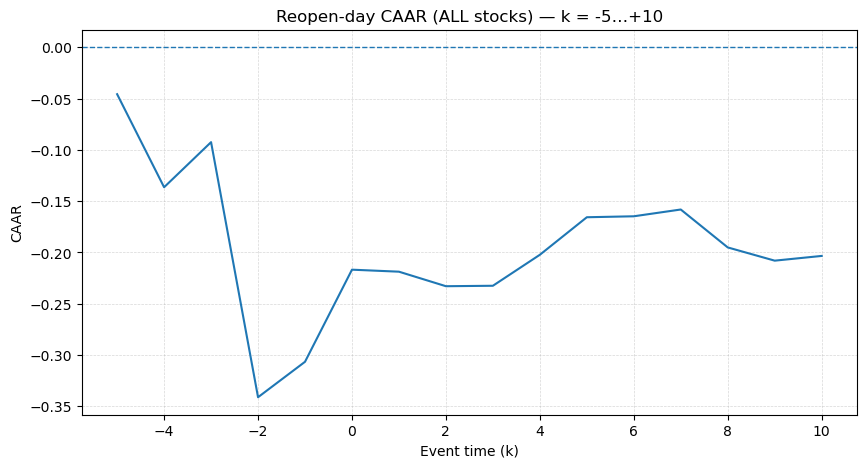

[OK] Saved /Users/lacinustunkal/Downloads/plots_reopen_CAAR/reopen_CAAR_ALL.png


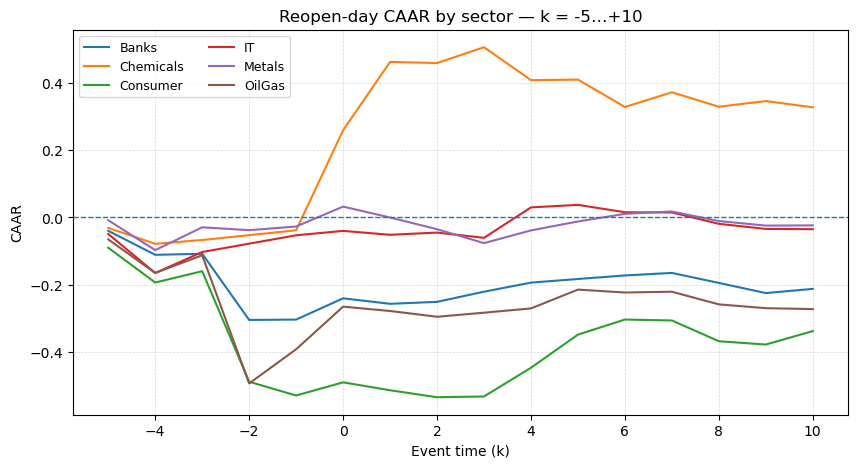

[OK] Saved /Users/lacinustunkal/Downloads/plots_reopen_CAAR/reopen_CAAR_by_sector.png

Done. Files in /Users/lacinustunkal/Downloads/plots_reopen_CAAR


In [14]:
# P4B — Plot reopen-day CAAR (overall + all sectors on one chart)

import os
import pandas as pd
import matplotlib.pyplot as plt

DOWNLOADS = "/Users/lacinustunkal/Downloads"
CAAR_OVERALL = os.path.join(DOWNLOADS, "reopen_CAAR_overall.csv")
CAAR_SECTOR  = os.path.join(DOWNLOADS, "reopen_CAAR_by_sector.csv")
OUT_DIR      = os.path.join(DOWNLOADS, "plots_reopen_CAAR")
os.makedirs(OUT_DIR, exist_ok=True)

# --- Overall ---
if not os.path.isfile(CAAR_OVERALL):
    raise FileNotFoundError(f"{CAAR_OVERALL} not found. Run 4B first.")

ov = pd.read_csv(CAAR_OVERALL)
if ov.empty or not {"k","CAAR"}.issubset(ov.columns):
    raise ValueError("Overall CAAR file has no data or missing columns 'k'/'CAAR'.")

ov = ov.sort_values("k")
fig, ax = plt.subplots(figsize=(10,5))
ax.plot(ov["k"].values, ov["CAAR"].values)
ax.axhline(0, linestyle="--", linewidth=1)
ax.set_title("Reopen-day CAAR (ALL stocks) — k = -5…+10")
ax.set_xlabel("Event time (k)")
ax.set_ylabel("CAAR")
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
out1 = os.path.join(OUT_DIR, "reopen_CAAR_ALL.png")
fig.savefig(out1, dpi=150, bbox_inches="tight")
plt.show(); plt.close(fig)
print(f"[OK] Saved {out1}")

# --- By sector (all sectors on one figure) ---
if not os.path.isfile(CAAR_SECTOR):
    raise FileNotFoundError(f"{CAAR_SECTOR} not found. Run 4B first.")

sec = pd.read_csv(CAAR_SECTOR)
if sec.empty or not {"sector","k","CAAR"}.issubset(sec.columns):
    raise ValueError("Sector CAAR file has no data or missing columns 'sector','k','CAAR'.")

fig, ax = plt.subplots(figsize=(10,5))
for s in sec["sector"].drop_duplicates():
    ss = sec[sec["sector"]==s].sort_values("k")
    if ss.empty:
        continue
    ax.plot(ss["k"].values, ss["CAAR"].values, label=s)

ax.axhline(0, linestyle="--", linewidth=1)
ax.set_title("Reopen-day CAAR by sector — k = -5…+10")
ax.set_xlabel("Event time (k)")
ax.set_ylabel("CAAR")
ax.legend(ncol=2, fontsize=9)
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
out2 = os.path.join(OUT_DIR, "reopen_CAAR_by_sector.png")
fig.savefig(out2, dpi=150, bbox_inches="tight")
plt.show(); plt.close(fig)
print(f"[OK] Saved {out2}")

print(f"\nDone. Files in {OUT_DIR}")


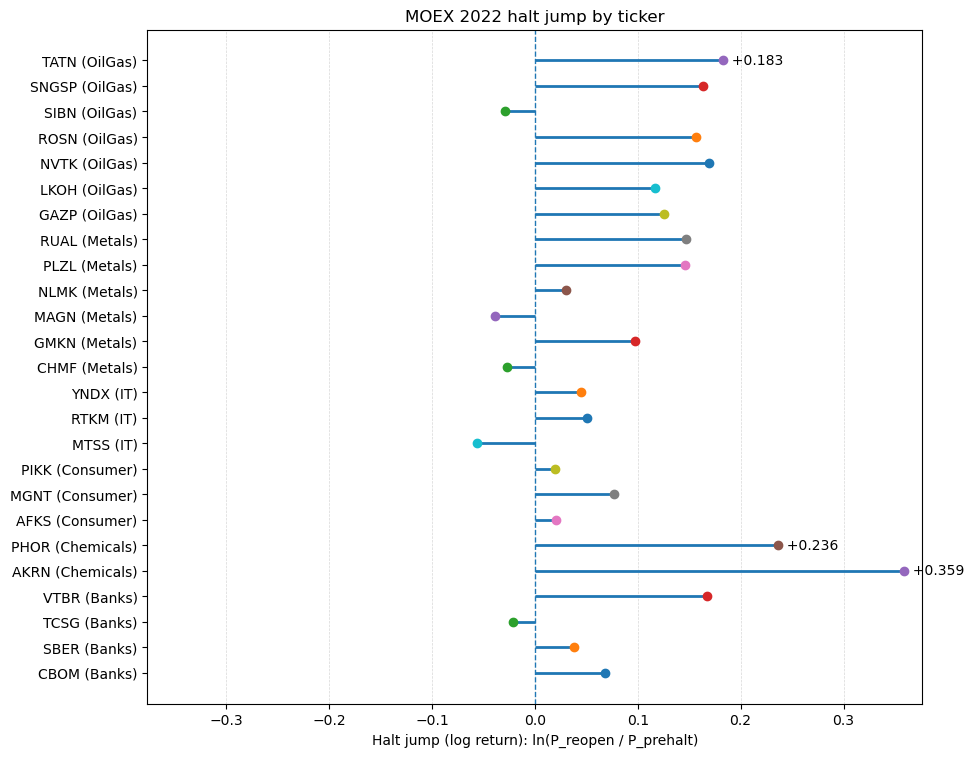

[OK] Saved plot → /Users/lacinustunkal/Downloads/plots_halt_jump/halt_jump_lollipop.png
[OK] Saved sorted table → /Users/lacinustunkal/Downloads/plots_halt_jump/halt_jump_sorted.csv
Done. Files in /Users/lacinustunkal/Downloads/plots_halt_jump


In [15]:
# P4C — Lollipop chart of halt jump (log) per ticker

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

DOWNLOADS = "/Users/lacinustunkal/Downloads"
REOPEN_MAP = os.path.join(DOWNLOADS, "reopen_map.csv")
OUT_DIR    = os.path.join(DOWNLOADS, "plots_halt_jump")
os.makedirs(OUT_DIR, exist_ok=True)

if not os.path.isfile(REOPEN_MAP):
    raise FileNotFoundError(f"{REOPEN_MAP} not found. Run 3C-1 first.")

rm = pd.read_csv(REOPEN_MAP)
if "halt_jump_log" not in rm.columns:
    raise KeyError("Column 'halt_jump_log' not found in reopen_map.csv")

rm = rm.dropna(subset=["halt_jump_log"]).copy()
if rm.empty:
    raise ValueError("No rows with non-missing halt_jump_log to plot.")

# Sort by sector then ticker for readability
rm = rm.sort_values(["sector","ticker"]).reset_index(drop=True)
rm["label"] = rm["ticker"] + " (" + rm["sector"] + ")"

# Export a tidy, sorted table as a companion to the plot
out_tbl = os.path.join(OUT_DIR, "halt_jump_sorted.csv")
rm[["ticker","sector","prehalt_last_trade","reopen_day0","halt_jump_log"]].to_csv(out_tbl, index=False)

# Lollipop positions
y = np.arange(len(rm))
x = rm["halt_jump_log"].astype(float).values

# Symmetric axis around zero for visual comparability
max_abs = float(np.nanmax(np.abs(x)))
xpad = 1.05 * max_abs if np.isfinite(max_abs) else 1.0

fig, ax = plt.subplots(figsize=(10, max(6, 0.35*len(rm))))

# draw stems + markers
for yi, xi in zip(y, x):
    ax.hlines(y=yi, xmin=0, xmax=xi, linewidth=2)
    ax.plot(xi, yi, "o")

ax.set_xlim(-xpad, xpad)
ax.axvline(0, linestyle="--", linewidth=1)
ax.set_yticks(y)
ax.set_yticklabels(rm["label"].tolist())
ax.set_xlabel("Halt jump (log return): ln(P_reopen / P_prehalt)")
ax.set_title("MOEX 2022 halt jump by ticker")
ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.5)

# Optional: annotate top/bottom 3 by magnitude for quick read
idx_mag = np.argsort(np.abs(x))[::-1][:3]
for i in idx_mag:
    ax.text(x[i], y[i], f"  {x[i]:+.3f}", va="center")

out = os.path.join(OUT_DIR, "halt_jump_lollipop.png")
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show(); plt.close(fig)

print(f"[OK] Saved plot → {out}")
print(f"[OK] Saved sorted table → {out_tbl}")
print(f"Done. Files in {OUT_DIR}")


In [16]:
# T4A — Announcement-day endpoint tables with BH-FDR at k ∈ {+1, +3, +5}

import os, math
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
AR_PANEL  = os.path.join(DOWNLOADS, "event_AR_timeseries.parquet")
OUT_ENDPT = os.path.join(DOWNLOADS, "event_endpoints_announcement_FDR.csv")

if not os.path.isfile(AR_PANEL):
    raise FileNotFoundError(f"{AR_PANEL} not found. Run 4A first.")

ar = pd.read_parquet(AR_PANEL)

# normalize window → 'ev_-5_+5'
def to_win_name(x):
    if isinstance(x, (tuple, list)) and len(x) >= 2:
        return str(x[1])
    try:
        import numpy as _np
        if isinstance(x, _np.ndarray) and x.size >= 1:
            return str(x.tolist()[-1])
    except Exception:
        pass
    s = str(x)
    # tolerate legacy "('event', 'ev_-5_+5')" stringified tuples
    if "ev_-5_+5" in s:
        return "ev_-5_+5"
    return s

ar["window_name"] = ar["window"].apply(to_win_name)
ar = ar[ar["window_name"]=="ev_-5_+5"].copy()

# keep only needed cols
keep = ["event_label","event_type","jurisdiction","t0","sector","ticker","k","AR","SAR","date"]
missing_cols = [c for c in keep if c not in ar.columns]
if missing_cols:
    raise KeyError(f"AR panel missing expected columns: {missing_cols}")
ar = ar[keep].copy()
ar["k"] = ar["k"].astype(int)

# per-ticker cumulative AR/SAR
ar_sorted = ar.sort_values(["event_label","t0","sector","ticker","k"])
ar_sorted["CAR_ticker"]  = ar_sorted.groupby(["event_label","t0","sector","ticker"])["AR"].cumsum()
ar_sorted["cSAR_ticker"] = ar_sorted.groupby(["event_label","t0","sector","ticker"])["SAR"].cumsum()

# endpoints
end_ks = [1, 3, 5]
rows = []
for (e, t0, sect, tkr), g in ar_sorted.groupby(["event_label","t0","sector","ticker"]):
    gg = g.set_index("k")
    for k in end_ks:
        if k in gg.index:
            rows.append({
                "event_label": e, "t0": t0, "sector": sect, "ticker": tkr, "k": int(k),
                "CAR_k":  float(gg.loc[k, "CAR_ticker"]),
                "cSAR_k": float(gg.loc[k, "cSAR_ticker"])
            })
dfk = pd.DataFrame(rows)

if dfk.empty:
    print("[WARN] No endpoint data found. Did Cell 4A run?")
    pd.DataFrame().to_csv(OUT_ENDPT, index=False)
else:
    # sector-level aggregation at each endpoint
    agg = (dfk.groupby(["event_label","t0","sector","k"])
             .agg(N=("ticker","nunique"),
                  CAAR_k=("CAR_k","mean"),
                  sum_cSAR=("cSAR_k","sum"),
                  N_terms=("cSAR_k","count"))
             .reset_index())

    # Patell-like z using cumulated standardized terms
    agg["z_patell_like"] = agg.apply(
        lambda r: r["sum_cSAR"]/math.sqrt(r["N_terms"]) if r["N_terms"]>0 else np.nan, axis=1
    )

    # two-sided normal p-value
    def pnorm_two_sided(z):
        if not np.isfinite(z): return np.nan
        phi = 0.5*(1.0 + math.erf(z/math.sqrt(2.0)))
        return 2.0 * (1.0 - phi) if z>=0 else 2.0 * phi

    agg["p_norm"] = agg["z_patell_like"].apply(pnorm_two_sided)

    # robust Benjamini–Hochberg (within each k)
    def bh_fdr(pvals):
        p = np.asarray(pvals, float)
        finite = np.isfinite(p)
        q = np.full_like(p, np.nan, dtype=float)
        if finite.sum() == 0:
            return q
        p_f = p[finite]
        m = p_f.size
        order = np.argsort(p_f)
        ranks = np.empty_like(order); ranks[order] = np.arange(1, m+1)
        q_f = p_f * m / ranks
        # enforce monotonicity from largest to smallest p
        q_f_sorted = np.minimum.accumulate(q_f[order[::-1]])[::-1]
        # map back
        q_f_mapped = np.empty_like(q_f); q_f_mapped[order] = q_f_sorted
        q[finite] = np.minimum(q_f_mapped, 1.0)
        return q

    out_blocks = []
    for k, g in agg.groupby("k", sort=True):
        g = g.copy()
        g["q_BH"] = bh_fdr(g["p_norm"].values)
        g["sig_10pct"] = (g["q_BH"] <= 0.10).astype(int)
        g["sig_5pct"]  = (g["q_BH"] <= 0.05).astype(int)
        out_blocks.append(g)

    out = (pd.concat(out_blocks, ignore_index=True)
             .sort_values(["t0","event_label","k","sector"])
             .reset_index(drop=True))

    out.to_csv(OUT_ENDPT, index=False)
    print(f"[OK] Announcement-day endpoints with FDR saved → {OUT_ENDPT}")


[OK] Announcement-day endpoints with FDR saved → /Users/lacinustunkal/Downloads/event_endpoints_announcement_FDR.csv


In [17]:
# T4B — Reopen-day endpoint tables with BH-FDR at k ∈ {0, +3, +10}

import os, math
import numpy as np
import pandas as pd

DOWNLOADS   = "/Users/lacinustunkal/Downloads"
PANEL_PARQ  = os.path.join(DOWNLOADS, "reopen_event_panel.parquet")
OUT_RE_FDR  = os.path.join(DOWNLOADS, "reopen_endpoints_FDR.csv")

# ---- load & validate ----
if not os.path.isfile(PANEL_PARQ):
    raise FileNotFoundError(f"{PANEL_PARQ} not found. Run 3C-2 first.")

panel = pd.read_parquet(PANEL_PARQ)
need = {"k","is_valid","sector","logret_event"}
miss = need - set(panel.columns)
if miss:
    raise KeyError(f"Panel missing columns: {sorted(miss)}")

panel["k"] = panel["k"].astype(int)
p = panel[panel["is_valid"]].copy()

# ---- per-k, per-sector cross-sectional t and p ----
end_ks = [0, 3, 10]
rows = []
for k in end_ks:
    gg = p[p["k"] == k]
    if gg.empty:
        continue
    for sect, g in gg.groupby("sector"):
        x = g["logret_event"].dropna().values
        N  = len(x)
        mu = float(np.mean(x)) if N > 0 else np.nan
        sd = float(np.std(x, ddof=1)) if N > 1 else np.nan
        tstat = float(mu / (sd / np.sqrt(N))) if (N > 1 and sd > 0) else np.nan
        # two-sided p: Student-t if SciPy available; else normal approx
        try:
            from scipy import stats
            pval = 2 * stats.t.sf(abs(tstat), df=N-1) if np.isfinite(tstat) else np.nan
        except Exception:
            pval = 2 * (1 - 0.5*(1 + math.erf(abs(tstat)/math.sqrt(2)))) if np.isfinite(tstat) else np.nan
        rows.append({"k": k, "sector": sect, "N": N, "mean": mu, "t": tstat, "p": pval})

re = pd.DataFrame(rows)

# ---- robust BH–FDR within each k across sectors ----
def bh_fdr(pvals):
    p = np.asarray(pvals, float)
    finite = np.isfinite(p)
    q = np.full_like(p, np.nan, dtype=float)
    if finite.sum() == 0:
        return q
    p_f = p[finite]
    m = p_f.size
    order = np.argsort(p_f)
    ranks = np.empty_like(order); ranks[order] = np.arange(1, m+1)
    q_f = p_f * m / ranks
    # enforce monotonicity (from largest p downward)
    q_sorted_desc = np.minimum.accumulate(q_f[order[::-1]])[::-1]
    q_f_mapped = np.empty_like(q_f); q_f_mapped[order] = q_sorted_desc
    q[finite] = np.minimum(q_f_mapped, 1.0)
    return q

out_blocks = []
for k, g in re.groupby("k", sort=True):
    gg = g.copy()
    gg["q_BH"] = bh_fdr(gg["p"].values)
    gg["sig_10pct"] = (gg["q_BH"] <= 0.10).astype(int)
    gg["sig_5pct"]  = (gg["q_BH"] <= 0.05).astype(int)
    out_blocks.append(gg.sort_values("sector"))

out = (pd.concat(out_blocks, ignore_index=True) if out_blocks else pd.DataFrame(columns=["k","sector","N","mean","t","p","q_BH","sig_10pct","sig_5pct"]))
out = out.sort_values(["k","sector"]).reset_index(drop=True)
out.to_csv(OUT_RE_FDR, index=False)
print(f"[OK] Reopen-day endpoints with FDR saved → {OUT_RE_FDR}")


[OK] Reopen-day endpoints with FDR saved → /Users/lacinustunkal/Downloads/reopen_endpoints_FDR.csv


In [18]:
# 4A′ — Recompute announcement-day AR/CAR using a two-factor model:
# r_i = a + b_m * mkt + b_s * sector_eq

import os, math
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"

FEAT_PARQ   = os.path.join(DOWNLOADS, "features_basic.parquet")
MKT_PARQ    = os.path.join(DOWNLOADS, "market_proxy.parquet")
SECR_PARQ   = os.path.join(DOWNLOADS, "sector_returns.parquet")
EVENTS_CSV  = os.path.join(DOWNLOADS, "events_clean_aligned.csv")
COVER_CSV   = os.path.join(DOWNLOADS, "coverage_matrix.csv")
SPEC_CSV    = os.path.join(DOWNLOADS, "event_windows_spec.csv")

AR2_PARQ    = os.path.join(DOWNLOADS, "event_AR_timeseries_2factor.parquet")
CAAR2_CSV   = os.path.join(DOWNLOADS, "event_CAAR_by_sector_2factor.csv")

# ---- preflight ----
for pth in [FEAT_PARQ, MKT_PARQ, SECR_PARQ, EVENTS_CSV, COVER_CSV, SPEC_CSV]:
    if not os.path.exists(pth):
        raise FileNotFoundError(f"Required input missing: {pth}")

# ---- load ----
feat = pd.read_parquet(FEAT_PARQ).sort_values(["ticker","date"])
feat["date"] = pd.to_datetime(feat["date"])
feat = feat[feat["valid_ret"]].copy()

mkt = pd.read_parquet(MKT_PARQ).reset_index()
mkt.columns = ["date","mkt_eq"]
mkt["date"] = pd.to_datetime(mkt["date"])

secr = pd.read_parquet(SECR_PARQ).reset_index()
secr["date"] = pd.to_datetime(secr["date"])
sector_columns = [c for c in secr.columns if c not in ["date"]]

events = pd.read_csv(EVENTS_CSV, parse_dates=["date","effective_date"])
cover  = pd.read_csv(COVER_CSV, parse_dates=["effective_date"])
spec   = pd.read_csv(SPEC_CSV)

calendar = sorted(feat["date"].drop_duplicates().tolist())

# ---- helpers ----
def prep_ticker_block(g: pd.DataFrame) -> pd.DataFrame:
    g = g.merge(mkt, on="date", how="left")
    sect_name = str(g["sector"].iloc[0])
    if sect_name in sector_columns:
        g = g.merge(
            secr[["date", sect_name]].rename(columns={sect_name: "sector_eq"}),
            on="date", how="left"
        )
    else:
        # Sector column not present in sector_returns (should be rare)
        g["sector_eq"] = np.nan
    return g

by_tkr = {t: prep_ticker_block(g.copy().sort_values("date"))
          for t, g in feat.groupby("ticker")}

spec_map = { (row["family"], row["name"]) : (int(row["start"]), int(row["end"])) for _,row in spec.iterrows() }

def window_dates(cal, t0, offs):
    a, b = offs
    pos = np.searchsorted(cal, t0)
    i0, i1 = max(0, pos + a), min(len(cal)-1, pos + b)
    return cal[i0:i1+1] if i0 <= i1 else []

def fit_2factor(df_est):
    # X = [1, mkt, sector]
    y = df_est["ret"].values.reshape(-1,1)
    X = np.column_stack([np.ones(len(df_est)), df_est["mkt_eq"].values, df_est["sector_eq"].values])
    XtX = X.T @ X
    XtX_inv = np.linalg.pinv(XtX)
    beta = XtX_inv @ (X.T @ y)
    resid = y - X @ beta
    n, p = X.shape
    dof = max(1, n - p)
    s2 = float((resid.T @ resid) / dof)
    return beta.flatten(), XtX_inv, s2

def predict_ar(df_ev, beta, XtX_inv, s2):
    X = np.column_stack([np.ones(len(df_ev)), df_ev["mkt_eq"].values, df_ev["sector_eq"].values])
    mu = (X @ beta.reshape(-1,1)).flatten()
    ar = df_ev["ret"].values - mu
    # Patell-style prediction variance: s^2 * (1 + x'(X'X)^(-1)x)
    var_ar = []
    for x in X:
        x = x.reshape(-1,1)
        vv = float(s2 * (1.0 + (x.T @ XtX_inv @ x)))
        # numeric guard
        vv = np.nan if not np.isfinite(vv) or vv <= 0 else vv
        var_ar.append(vv)
    var_ar = np.array(var_ar, dtype=float)
    sar = ar / np.sqrt(var_ar)
    return ar, sar

# ---- build list of usable pairs ----
use_pairs = cover[cover["use_for_eventstudy"]].copy()
use_pairs = use_pairs.merge(
    events[["label","effective_date","type","jurisdiction"]],
    left_on=["event_label","effective_date"],
    right_on=["label","effective_date"],
    how="left"
)
use_pairs["effective_date"] = pd.to_datetime(use_pairs["effective_date"])

# target event window (string for simpler downstream)
WIN_NAME = "ev_-5_+5"
rows_ar = []

print(f"Running two-factor announcement study on {use_pairs[['event_label','effective_date']].drop_duplicates().shape[0]} events…")

for _, rec in use_pairs.iterrows():
    tkr  = rec["ticker"]
    sect = rec["sector"]
    e_lbl = rec["event_label"]
    e_typ = rec.get("type", "")
    e_jur = rec.get("jurisdiction", "")
    t0    = pd.to_datetime(rec["effective_date"])
    est_used = rec.get("estimation_used", "primary")

    g = by_tkr.get(tkr)
    if g is None:
        continue

    # estimation window
    if ("estimation", est_used) not in spec_map:
        # fallback to primary if mapping is missing
        est_used = "primary" if ("estimation","primary") in spec_map else est_used
    offs = spec_map.get(("estimation", est_used))
    if offs is None:
        continue

    dates_est = window_dates(calendar, t0, offs)
    est = g[g["date"].isin(dates_est)].dropna(subset=["ret","mkt_eq","sector_eq"])
    if est.shape[0] < 25:
        continue

    beta, XtX_inv, s2 = fit_2factor(est)

    # event window [-5,+5]
    a, b = -5, 5
    win_dates = window_dates(calendar, t0, (a, b))
    if not win_dates:
        continue

    ev_df = g[g["date"].isin(win_dates)].dropna(subset=["ret","mkt_eq","sector_eq"]).copy()
    if ev_df.empty:
        continue

    # compute k using global calendar
    try:
        pos0 = calendar.index(t0)
    except ValueError:
        # should not happen because events were aligned, but guard anyway
        continue
    ev_df["k"] = ev_df["date"].apply(lambda d: calendar.index(d) - pos0 if d in calendar else np.nan)
    ev_df = ev_df.sort_values("k")

    ar_vals, sar_vals = predict_ar(ev_df, beta, XtX_inv, s2)
    ev_df["AR"]  = ar_vals
    ev_df["SAR"] = sar_vals

    for _, r in ev_df.iterrows():
        rows_ar.append({
            "event_label": e_lbl, "event_type": e_typ, "jurisdiction": e_jur,
            "ticker": tkr, "sector": sect, "t0": t0.date(), "k": int(r["k"]),
            "date": pd.to_datetime(r["date"]).date(),
            "AR": float(r["AR"]), "SAR": float(r["SAR"]),
            "window": WIN_NAME
        })

# ---- save AR panel & sector CAAR ----
ar2 = pd.DataFrame(rows_ar)

if ar2.empty:
    print("[WARN] No pairs produced (check coverage/sectors).")
else:
    ar2.to_parquet(AR2_PARQ, engine="pyarrow", index=False)
    print(f"[OK] 2-factor AR panel saved → {AR2_PARQ} (rows: {len(ar2):,})")

    grp = (ar2.groupby(["event_label","t0","sector","k"])["AR"]
             .mean().rename("ARbar").reset_index()
             .sort_values(["event_label","t0","sector","k"]))
    grp["CAAR"] = grp.groupby(["event_label","t0","sector"])["ARbar"].cumsum()
    grp.to_csv(CAAR2_CSV, index=False)
    print(f"[OK] 2-factor sector CAAR saved → {CAAR2_CSV}")

print("\n4A′ complete (two-factor robustness).")


Running two-factor announcement study on 25 events…


/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/309091517.py:79: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  s2 = float((resid.T @ resid) / dof)
/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/309091517.py:90: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  vv = float(s2 * (1.0 + (x.T @ XtX_inv @ x)))
/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/309091517.py:79: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  s2 =

[OK] 2-factor AR panel saved → /Users/lacinustunkal/Downloads/event_AR_timeseries_2factor.parquet (rows: 4,372)
[OK] 2-factor sector CAAR saved → /Users/lacinustunkal/Downloads/event_CAAR_by_sector_2factor.csv

4A′ complete (two-factor robustness).


Plotting with coverage badges for 25 events…


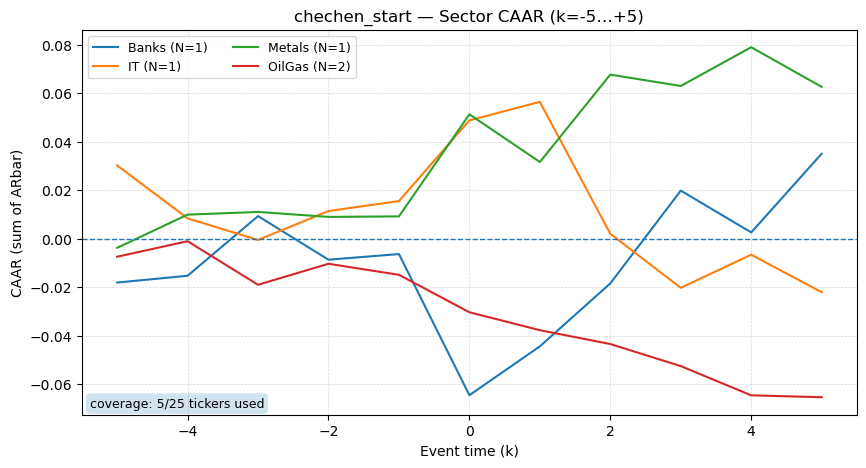

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/1999-08-09_chechen_start_sector_CAAR_badges.png


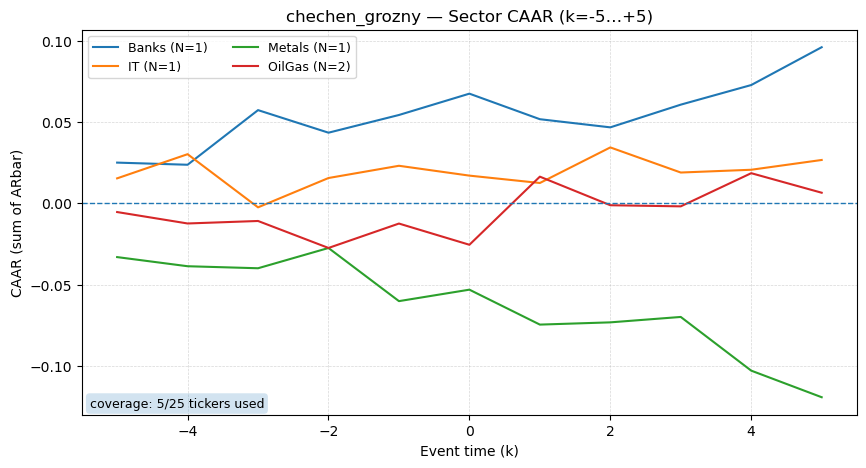

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2000-02-07_chechen_grozny_sector_CAAR_badges.png


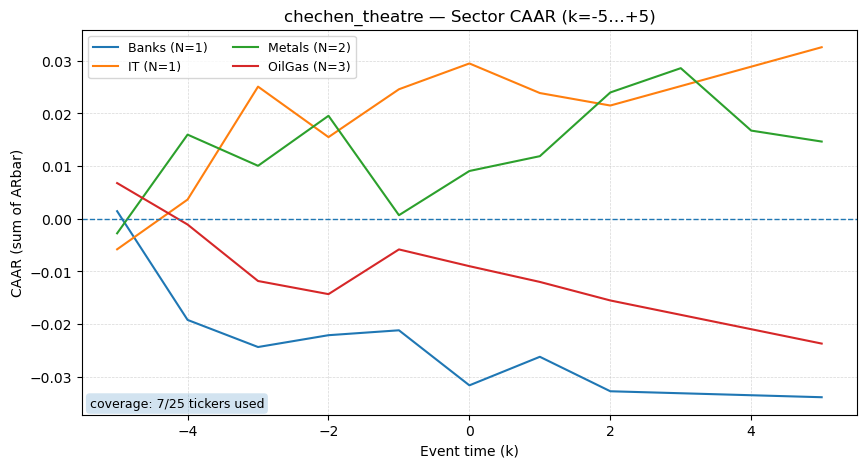

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2002-10-23_chechen_theatre_sector_CAAR_badges.png


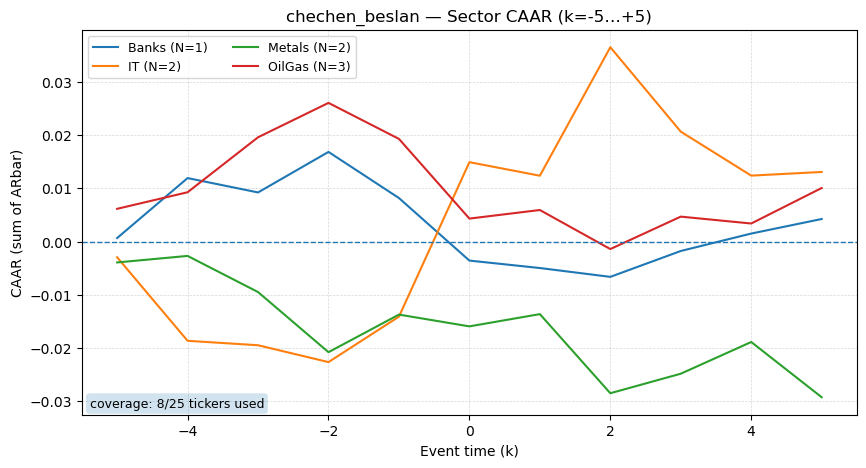

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2004-09-01_chechen_beslan_sector_CAAR_badges.png


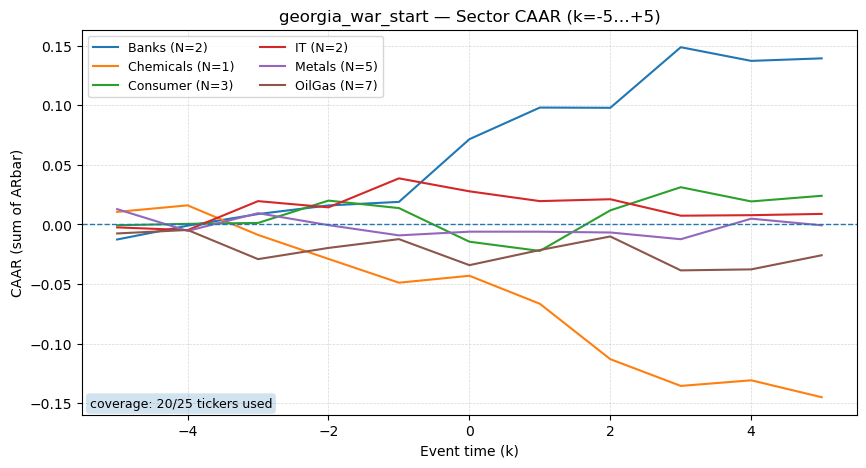

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2008-08-08_georgia_war_start_sector_CAAR_badges.png


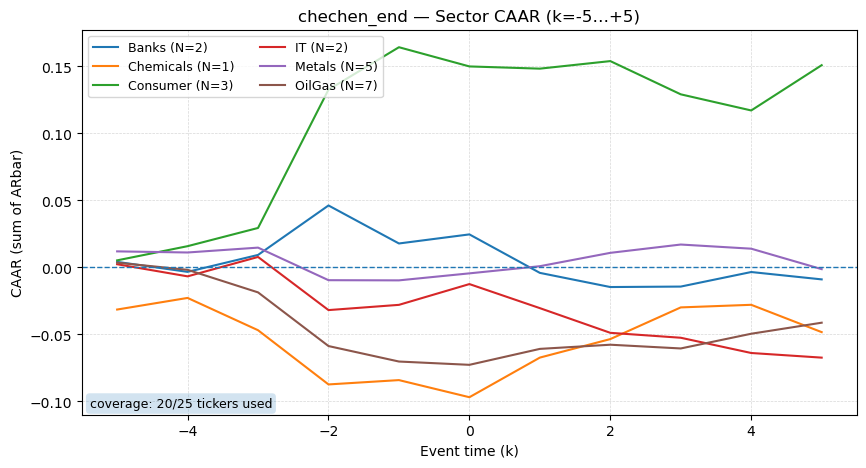

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2009-04-16_chechen_end_sector_CAAR_badges.png


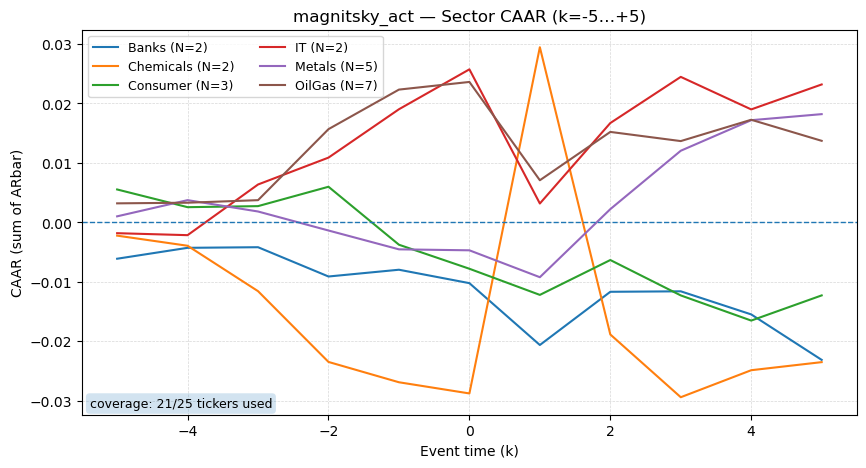

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2012-12-14_magnitsky_act_sector_CAAR_badges.png


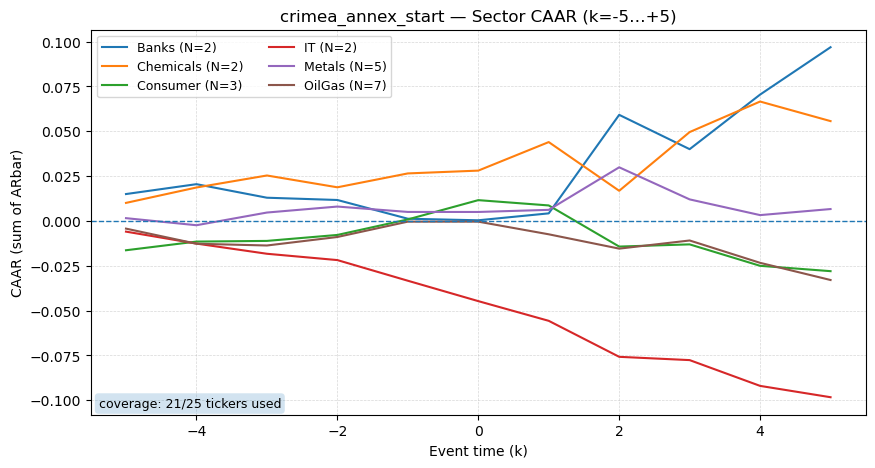

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2014-02-27_crimea_annex_start_sector_CAAR_badges.png


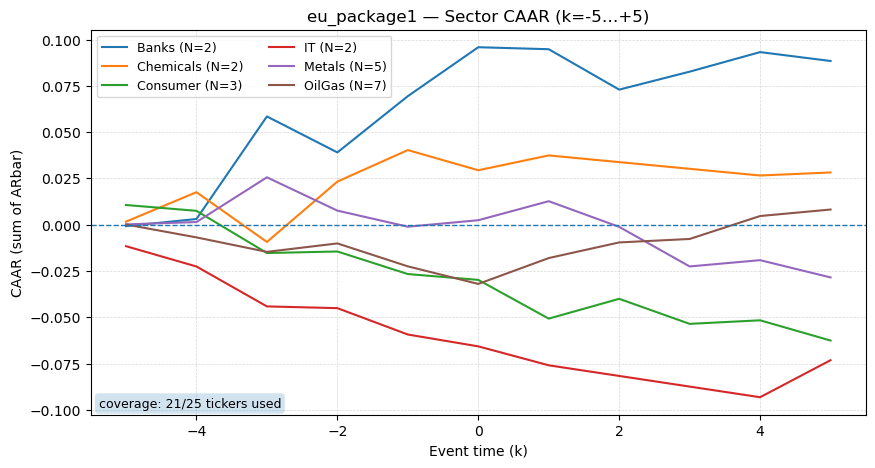

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2014-03-06_eu_package1_sector_CAAR_badges.png


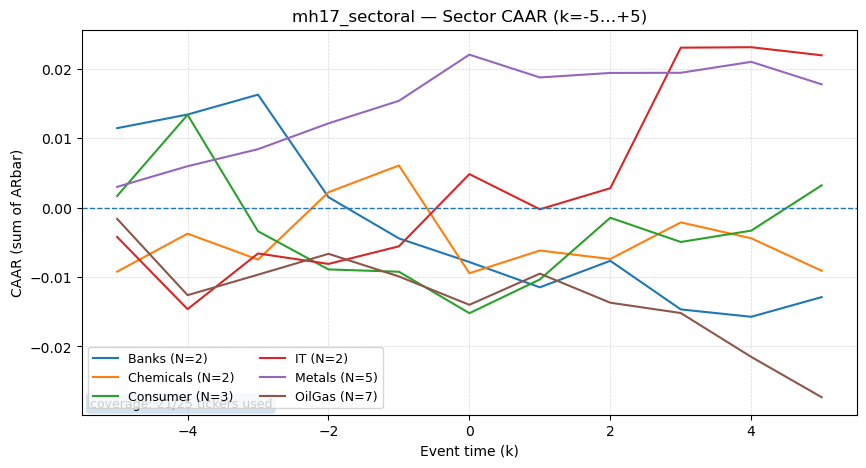

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2014-07-29_mh17_sectoral_sector_CAAR_badges.png


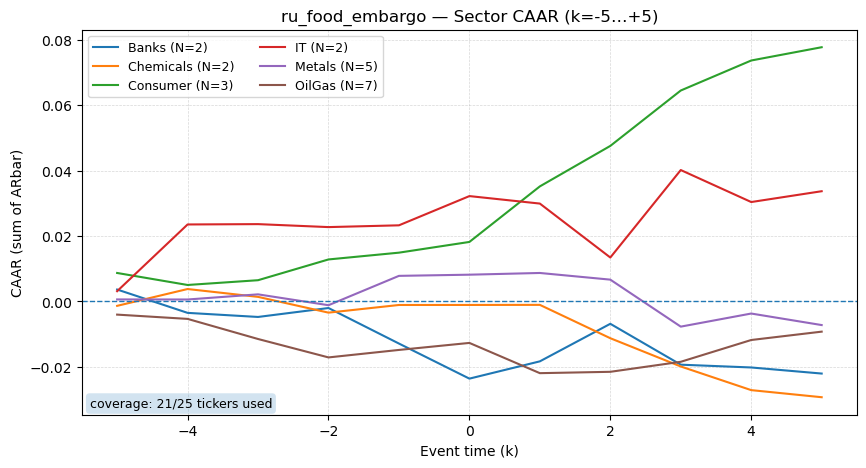

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2014-08-07_ru_food_embargo_sector_CAAR_badges.png


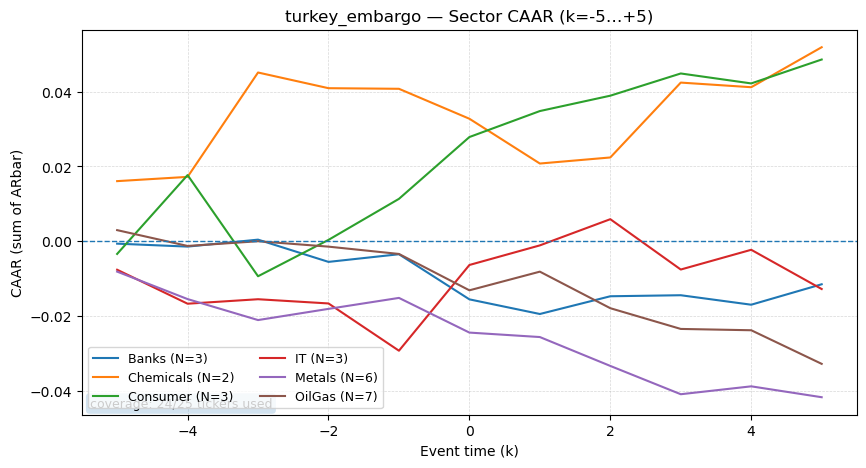

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2015-11-30_turkey_embargo_sector_CAAR_badges.png


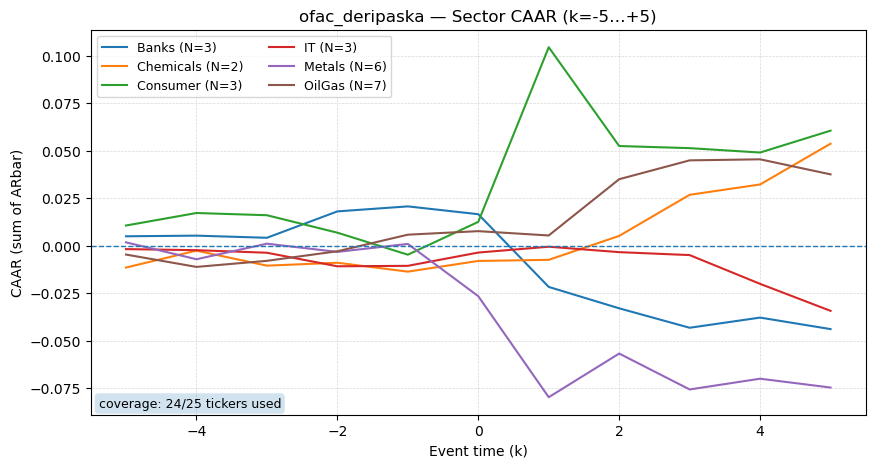

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2018-04-06_ofac_deripaska_sector_CAAR_badges.png


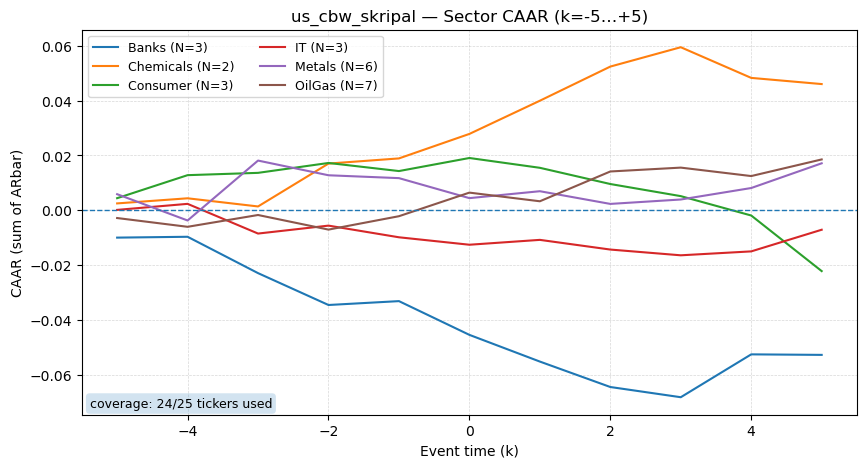

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2018-08-27_us_cbw_skripal_sector_CAAR_badges.png


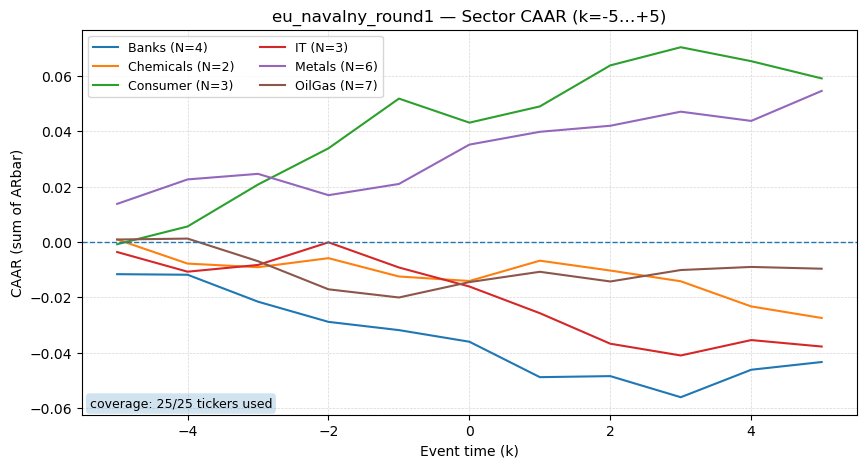

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2020-10-15_eu_navalny_round1_sector_CAAR_badges.png


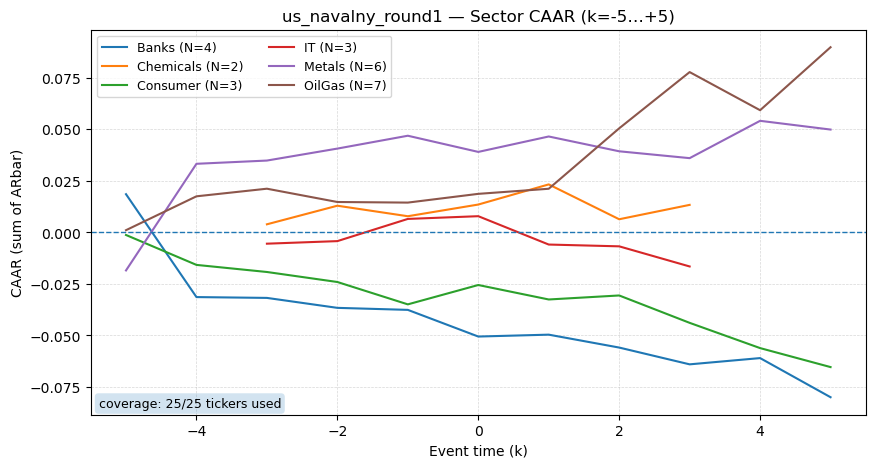

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2021-03-02_us_navalny_round1_sector_CAAR_badges.png


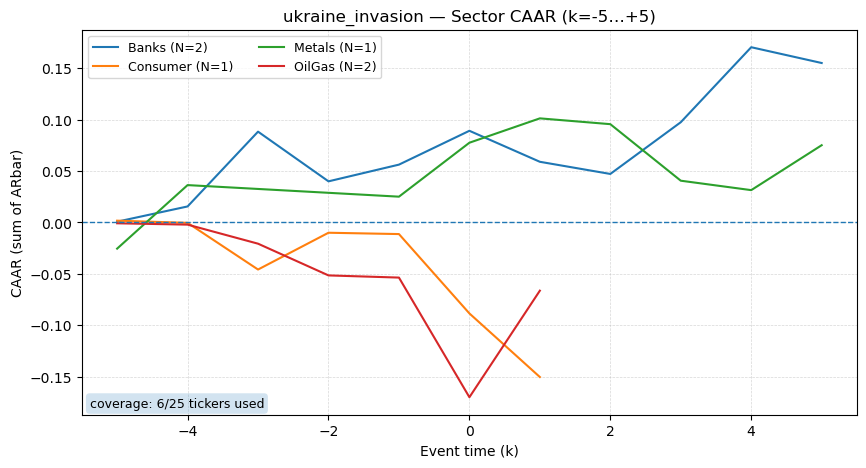

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2022-02-24_ukraine_invasion_sector_CAAR_badges.png


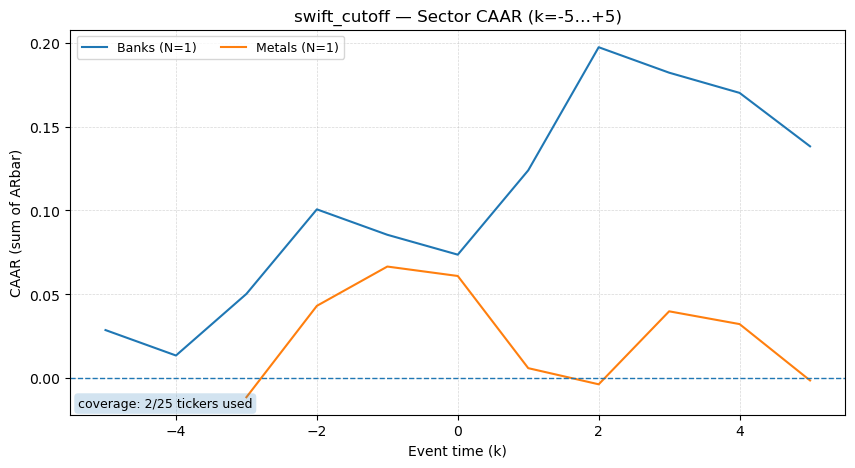

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2022-02-28_swift_cutoff_sector_CAAR_badges.png


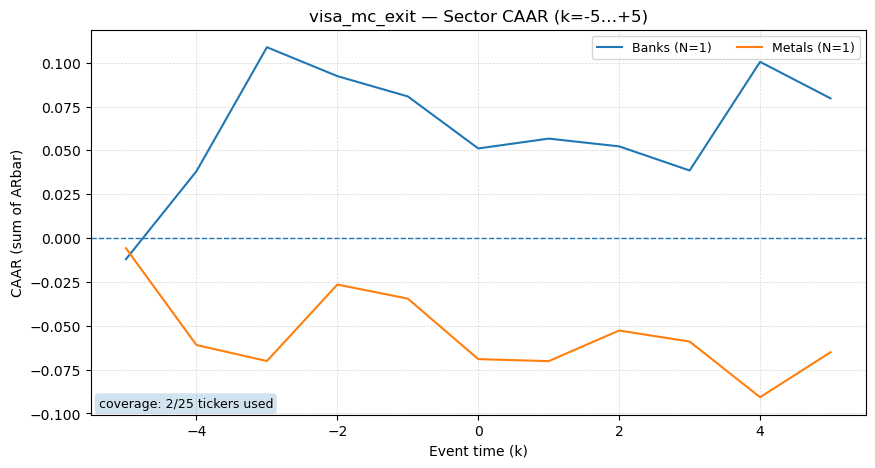

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2022-03-07_visa_mc_exit_sector_CAAR_badges.png


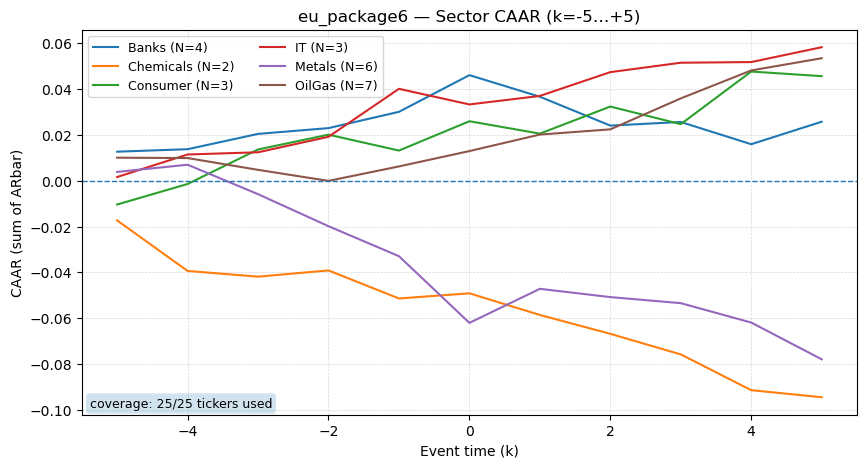

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2022-06-03_eu_package6_sector_CAAR_badges.png


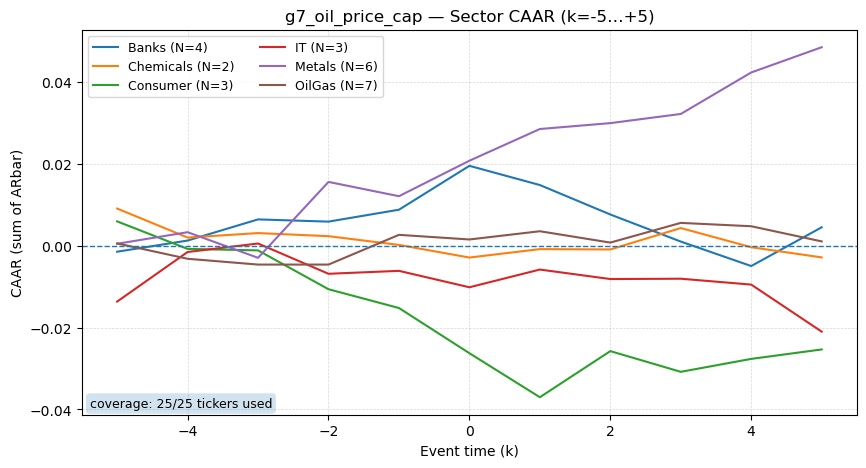

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2022-12-05_g7_oil_price_cap_sector_CAAR_badges.png


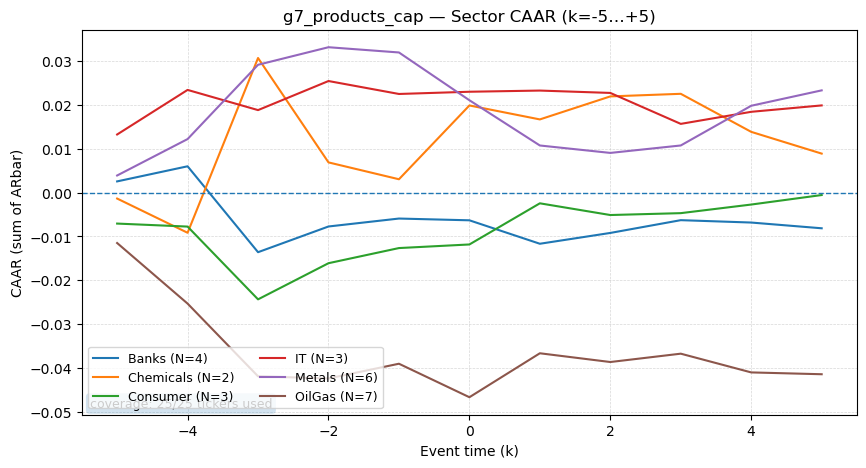

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2023-02-06_g7_products_cap_sector_CAAR_badges.png


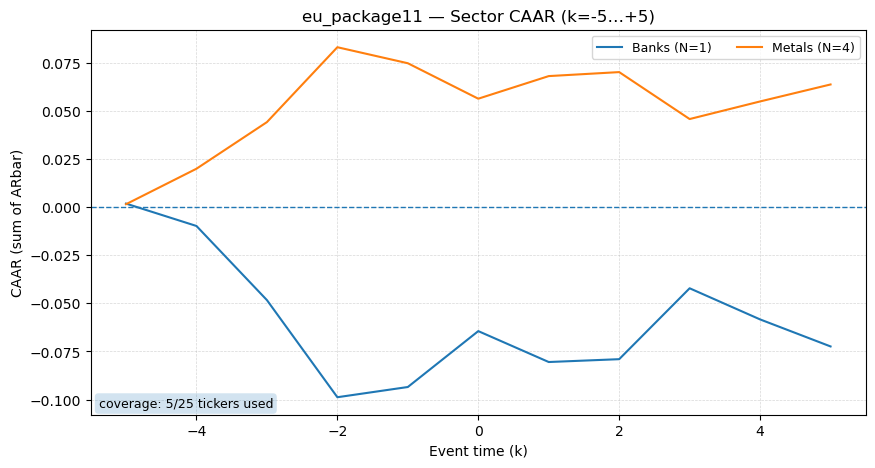

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2023-06-23_eu_package11_sector_CAAR_badges.png


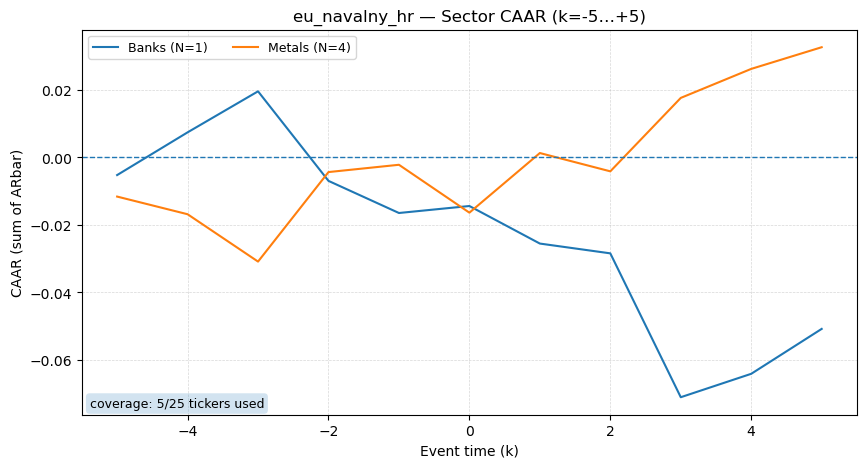

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2024-03-22_eu_navalny_hr_sector_CAAR_badges.png


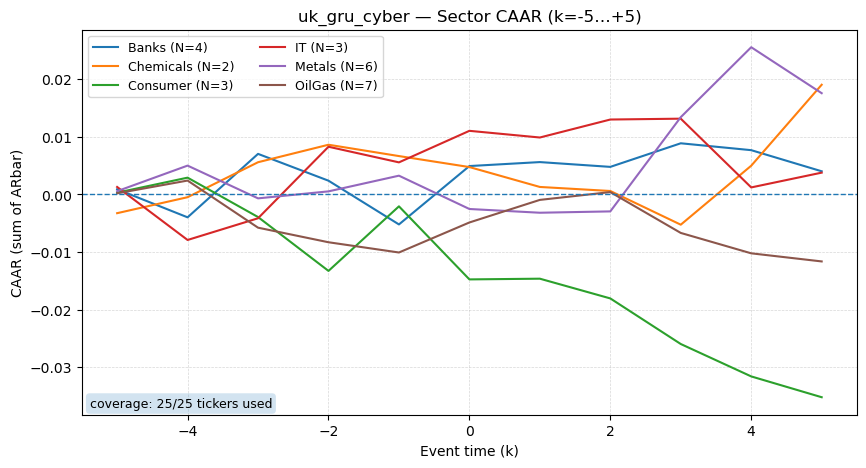

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_CAAR_badges/2025-07-18_uk_gru_cyber_sector_CAAR_badges.png

Done. Files in /Users/lacinustunkal/Downloads/plots_event_CAAR_badges


In [19]:
# P4A′ — Same sector CAAR plots as before, but legend labels include N per sector and subtitle shows overall coverage  (unchanged behavior)

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

DOWNLOADS = "/Users/lacinustunkal/Downloads"
AR_PANEL  = os.path.join(DOWNLOADS, "event_AR_timeseries.parquet")
COV_SUM   = os.path.join(DOWNLOADS, "coverage_summary_by_event.csv")
OUT_DIR   = os.path.join(DOWNLOADS, "plots_event_CAAR_badges")
os.makedirs(OUT_DIR, exist_ok=True)

ar = pd.read_parquet(AR_PANEL)
def to_win_name(x):
    if isinstance(x, (tuple, list)) and len(x)>=2: return str(x[1])
    try:
        import numpy as np
        if isinstance(x, np.ndarray) and x.size>=1: return str(x.tolist()[-1])
    except Exception: pass
    return str(x)
ar["window_name"] = ar["window"].apply(to_win_name)
ar = ar[ar["window_name"]=="ev_-5_+5"].copy()

grp = (ar.groupby(["event_label","t0","sector","k"])["AR"]
         .mean().rename("ARbar").reset_index().sort_values(["event_label","t0","sector","k"]))
grp["CAAR"] = grp.groupby(["event_label","t0","sector"])["ARbar"].cumsum()

sector_counts = (ar.groupby(["event_label","t0","sector"])["ticker"].nunique().rename("N_sector").reset_index())
cov = pd.read_csv(COV_SUM, parse_dates=["effective_date"]).rename(columns={"effective_date":"t0"})
cov = cov[["event_label","t0","n_use","n_total"]].drop_duplicates()

events = grp[["event_label","t0"]].drop_duplicates().sort_values(["t0","event_label"]).to_records(index=False)

print(f"Plotting with coverage badges for {len(events)} events…")
for (lbl, t0) in events:
    sub = grp[(grp["event_label"]==lbl) & (grp["t0"]==t0)]
    counts = sector_counts[(sector_counts["event_label"]==lbl) & (sector_counts["t0"]==t0)]
    covrow = cov[(cov["event_label"]==lbl) & (cov["t0"]==pd.to_datetime(t0))]
    n_use = int(covrow["n_use"].iloc[0]) if not covrow.empty else sub["sector"].nunique()
    n_tot = int(covrow["n_total"].iloc[0]) if not covrow.empty else 25

    fig, ax = plt.subplots(figsize=(10,5))
    for s in sub["sector"].drop_duplicates().tolist():
        ss = sub[sub["sector"]==s].sort_values("k")
        n_s = int(counts.loc[counts["sector"]==s, "N_sector"].iloc[0]) if (counts["sector"]==s).any() else ss["ARbar"].notna().sum()
        ax.plot(ss["k"].values, ss["CAAR"].values, label=f"{s} (N={n_s})")

    ax.axhline(0, linestyle="--", linewidth=1)
    ax.set_title(f"{lbl} — Sector CAAR (k=-5…+5)")
    ax.set_xlabel("Event time (k)"); ax.set_ylabel("CAAR (sum of ARbar)")
    ax.legend(ncol=2, fontsize=9); ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
    ax.text(0.01, 0.02, f"coverage: {n_use}/{n_tot} tickers used", transform=ax.transAxes, fontsize=9,
            bbox=dict(boxstyle="round", alpha=0.2, lw=0.0))

    out = os.path.join(OUT_DIR, f"{pd.to_datetime(t0).date()}_{lbl}_sector_CAAR_badges.png")
    plt.savefig(out, dpi=150, bbox_inches="tight")
    plt.show(); plt.close(fig)
    print(f"[OK] Saved {out}")

print(f"\nDone. Files in {OUT_DIR}")


In [20]:
# CELL 5A — Build volatility features per stock and equal-weight per sector (with VW-proxy & counts)

import os
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEAT_PARQ = os.path.join(DOWNLOADS, "features_basic.parquet")

OUT_FEAT_VOL = os.path.join(DOWNLOADS, "features_vol.parquet")
OUT_SECT_VOL = os.path.join(DOWNLOADS, "sector_vol_eq.parquet")  # multi-index wide: AR_eq, VR_eq, VR_roll21, VR_vw, N_eq

# --- per-stock volatility proxies ------------------------------------------------
df = pd.read_parquet(FEAT_PARQ).sort_values(["ticker","date"])
df["date"] = pd.to_datetime(df["date"])
df = df[df["valid_ret"]].copy()  # only days with valid returns

# basic proxies
df["absret"] = df["ret"].abs()
df["ret2"]   = df["ret"]**2
# optional per-stock rolling variance for context
df["roll_var21"] = (df.groupby("ticker")["ret"]
                      .rolling(window=21, min_periods=10)
                      .var()
                      .reset_index(level=0, drop=True))

# save per-stock vol features
df.to_parquet(OUT_FEAT_VOL, engine="pyarrow", index=False)
print(f"[OK] Saved per-stock vol features → {OUT_FEAT_VOL} (rows: {len(df):,})")

# --- sector aggregates: EW + VW-proxy + counts -----------------------------------
# Equal-weight sector means
sect_EW = (df.groupby(["date","sector"])
             .agg(AR=("absret","mean"),
                  VR=("ret2","mean"),
                  N_eq=("ret2","count"))             # number of tickers contributing that day
             .reset_index()
             .sort_values(["sector","date"]))

# 21d rolling mean of EW VR for readability (within sector)
sect_EW["VR_roll21"] = sect_EW.groupby("sector")["VR"] \
                              .transform(lambda s: s.rolling(21, min_periods=10).mean())

# VW-proxy (dollar-volume weights) sector variance: E_w[r^2]
tmp = df.loc[:, ["date","sector","ret2","dollar_vol"]].dropna()
def wavg(s):
    w = s["dollar_vol"].to_numpy()
    x = s["ret2"].to_numpy()
    wsum = np.nansum(w)
    return np.nan if (wsum is None or wsum <= 0) else float(np.nansum(w * x) / wsum)

sect_VW = (tmp.groupby(["date","sector"]).apply(wavg)
              .rename("VR_vw")
              .reset_index()
              .sort_values(["sector","date"]))

# --- to wide multi-index (for convenient downstream selection) -------------------
wide_AR     = sect_EW.pivot(index="date", columns="sector", values="AR")
wide_VR_eq  = sect_EW.pivot(index="date", columns="sector", values="VR")
wide_VR_roll= sect_EW.pivot(index="date", columns="sector", values="VR_roll21")
wide_Neq    = sect_EW.pivot(index="date", columns="sector", values="N_eq")
wide_VR_vw  = sect_VW.pivot(index="date", columns="sector", values="VR_vw")

# keep original keys so 5D’s helper still finds ('VR_eq', sector)
sect_out = pd.concat(
    {
        "AR_eq":     wide_AR,
        "VR_eq":     wide_VR_eq,
        "VR_roll21": wide_VR_roll,   # EW 21d rolling mean of VR_eq
        "VR_vw":     wide_VR_vw,     # NEW: VW-proxy sector variance
        "N_eq":      wide_Neq        # NEW: #constituents per sector per day (EW basis)
    },
    axis=1
).sort_index()

sect_out.to_parquet(OUT_SECT_VOL, engine="pyarrow")
print(f"[OK] Saved sector volatility panel (EW + VW-proxy + counts) → {OUT_SECT_VOL}")


[OK] Saved per-stock vol features → /Users/lacinustunkal/Downloads/features_vol.parquet (rows: 114,253)
[OK] Saved sector volatility panel (EW + VW-proxy + counts) → /Users/lacinustunkal/Downloads/sector_vol_eq.parquet


/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/2196609302.py:52: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sect_VW = (tmp.groupby(["date","sector"]).apply(wavg)


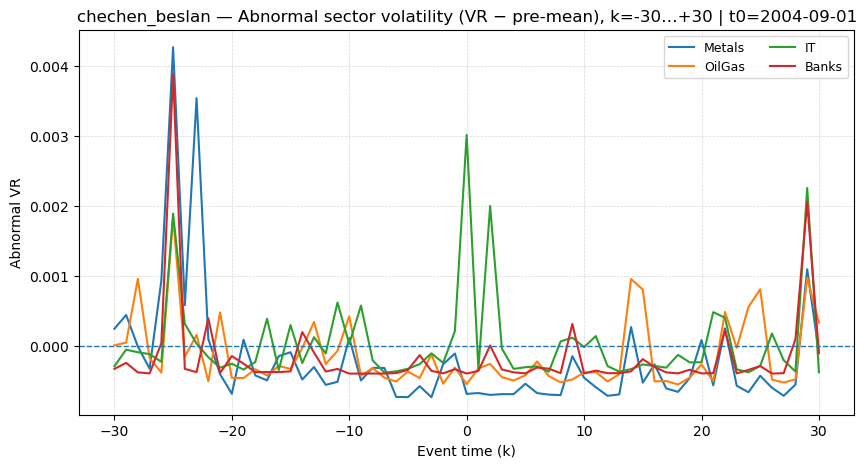

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2004-09-01_chechen_beslan_sector_abnVOL.png


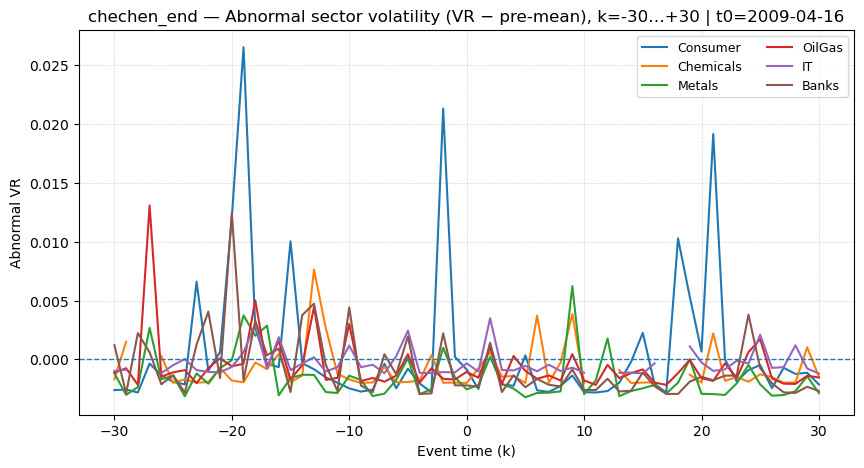

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2009-04-16_chechen_end_sector_abnVOL.png


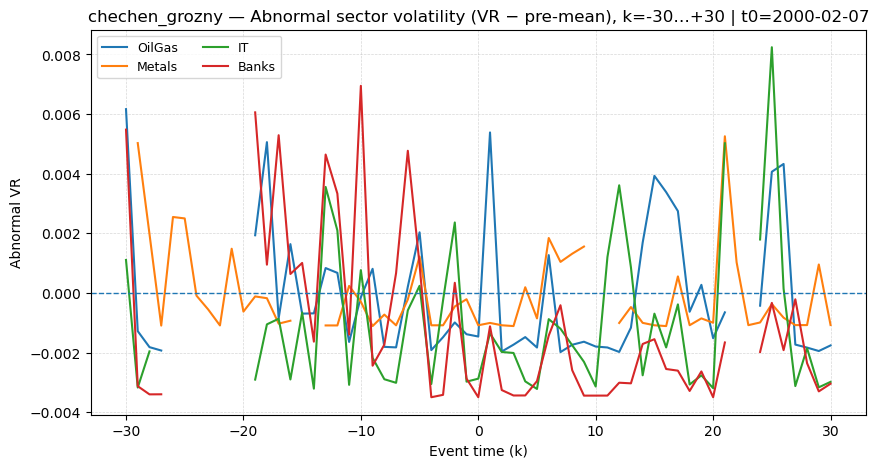

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2000-02-07_chechen_grozny_sector_abnVOL.png


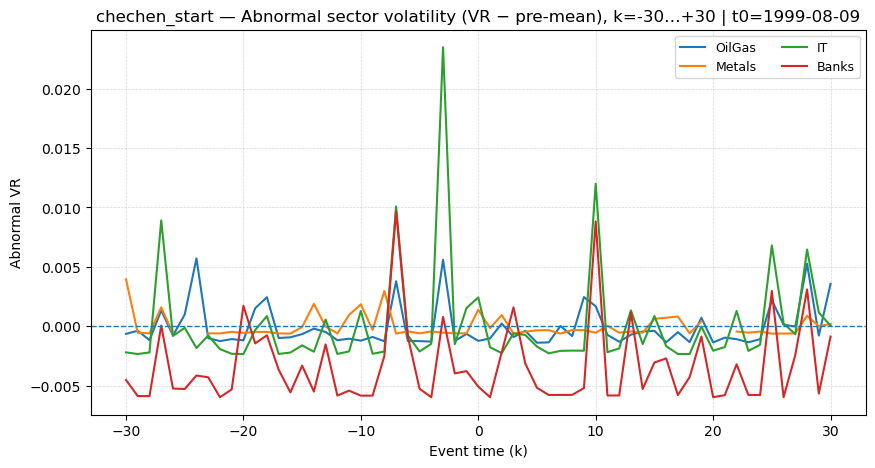

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/1999-08-09_chechen_start_sector_abnVOL.png


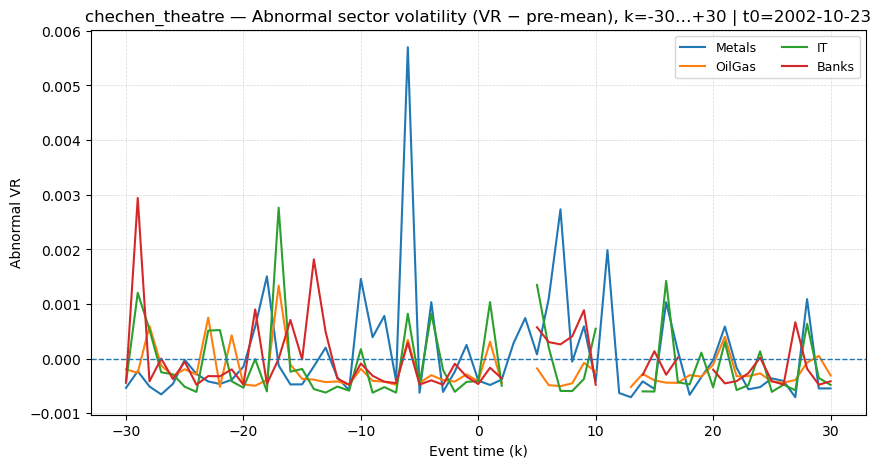

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2002-10-23_chechen_theatre_sector_abnVOL.png


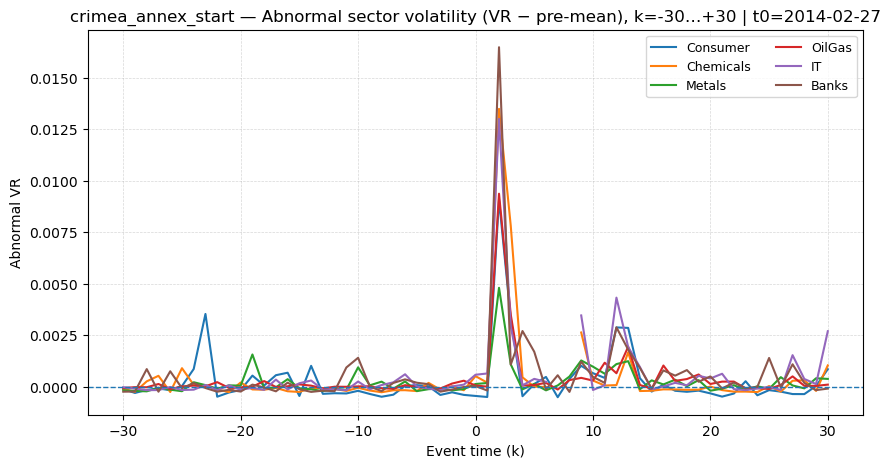

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2014-02-27_crimea_annex_start_sector_abnVOL.png


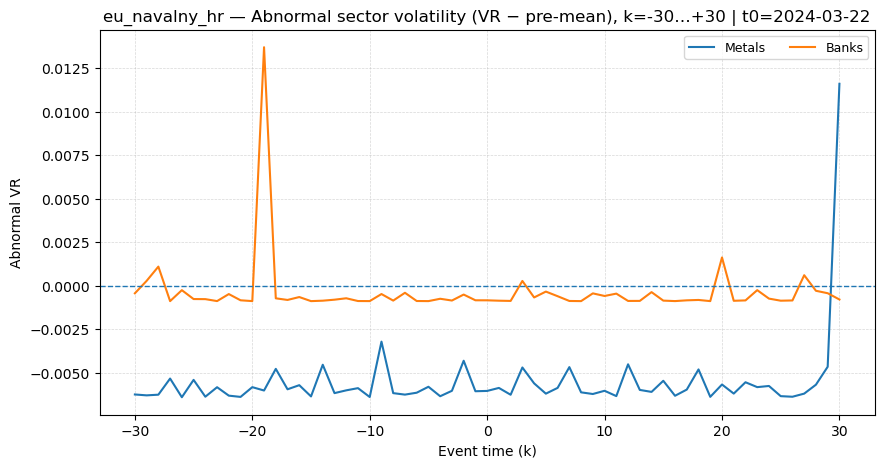

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2024-03-22_eu_navalny_hr_sector_abnVOL.png


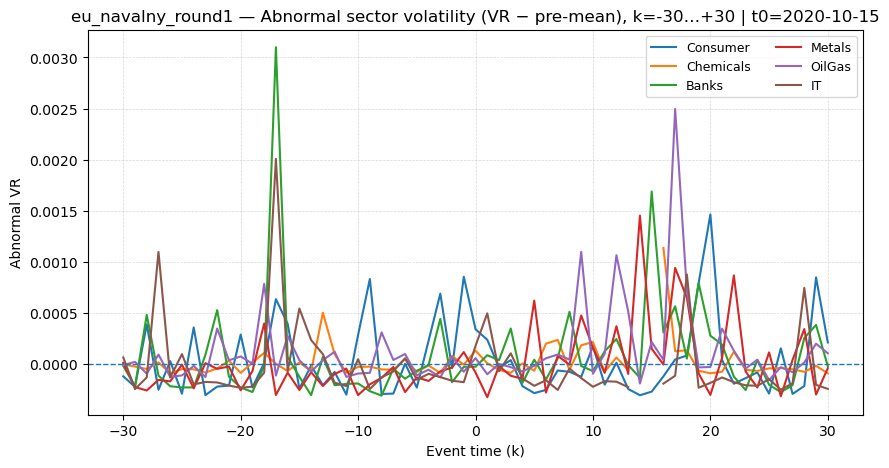

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2020-10-15_eu_navalny_round1_sector_abnVOL.png


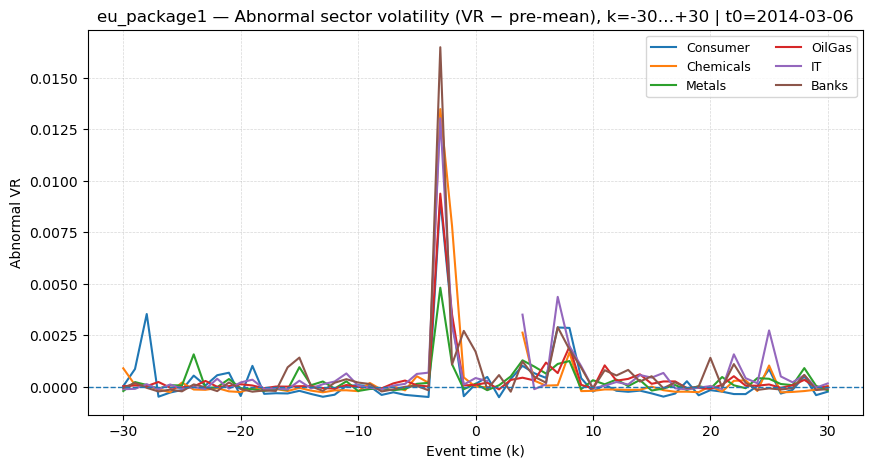

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2014-03-06_eu_package1_sector_abnVOL.png


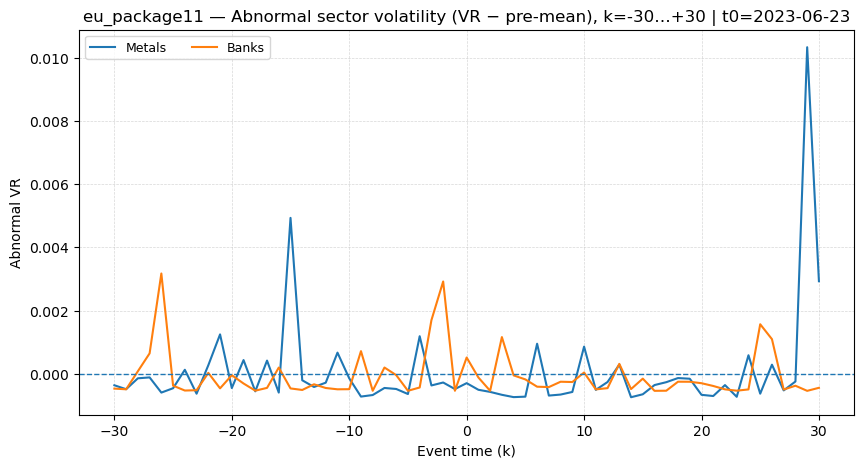

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2023-06-23_eu_package11_sector_abnVOL.png


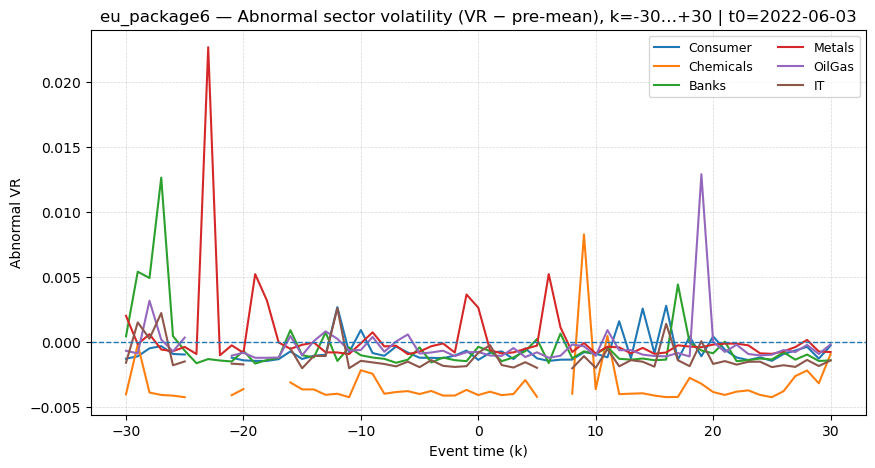

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2022-06-03_eu_package6_sector_abnVOL.png


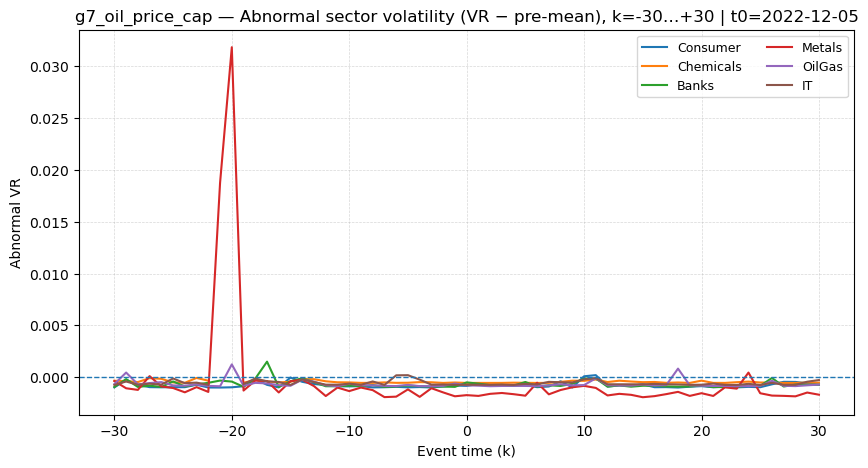

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2022-12-05_g7_oil_price_cap_sector_abnVOL.png


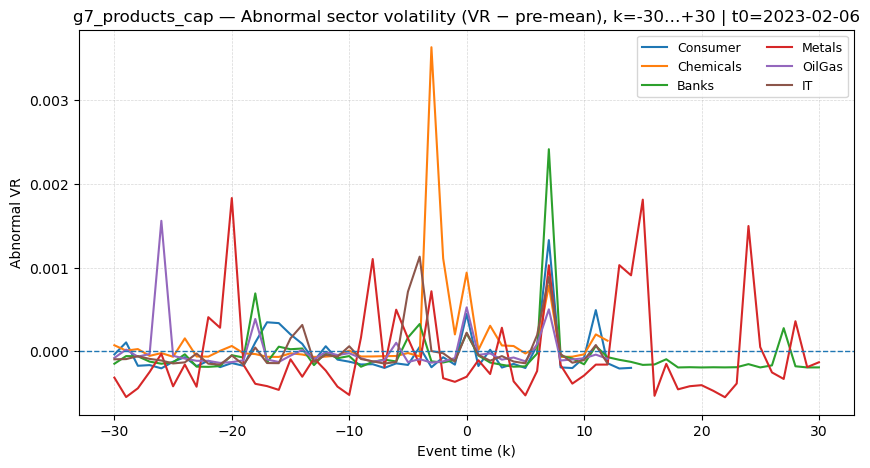

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2023-02-06_g7_products_cap_sector_abnVOL.png


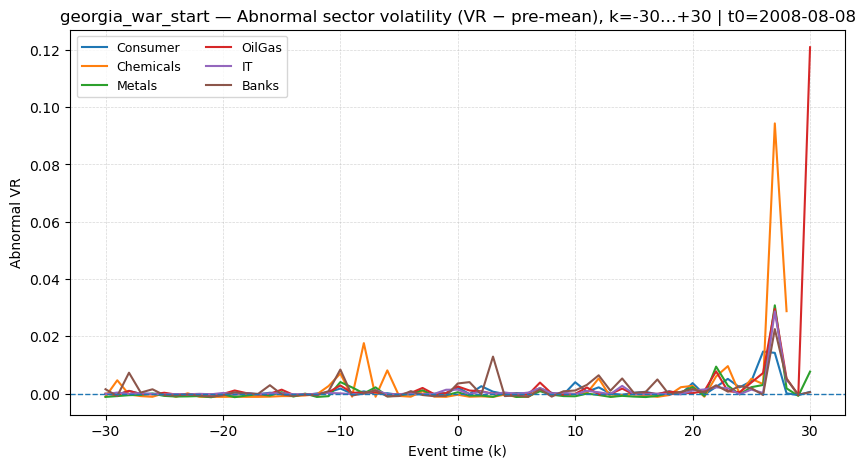

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2008-08-08_georgia_war_start_sector_abnVOL.png


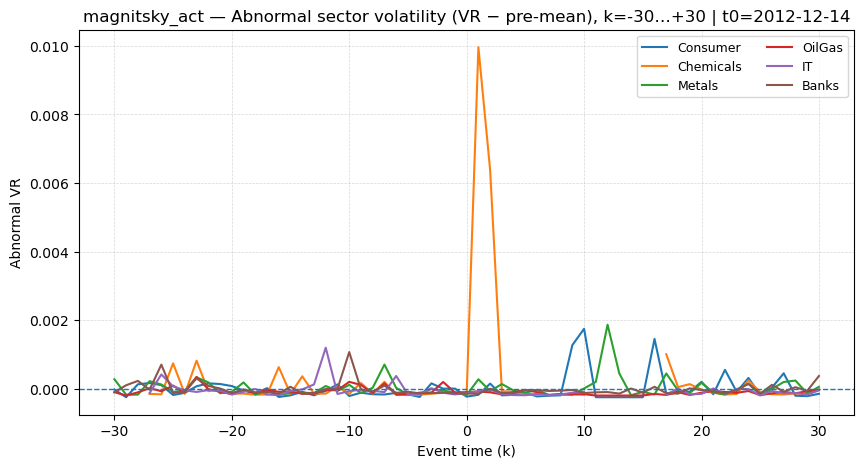

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2012-12-14_magnitsky_act_sector_abnVOL.png


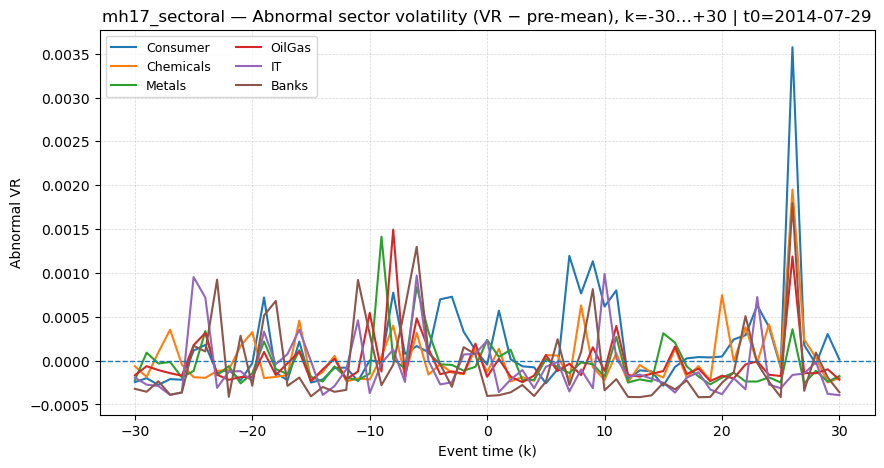

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2014-07-29_mh17_sectoral_sector_abnVOL.png


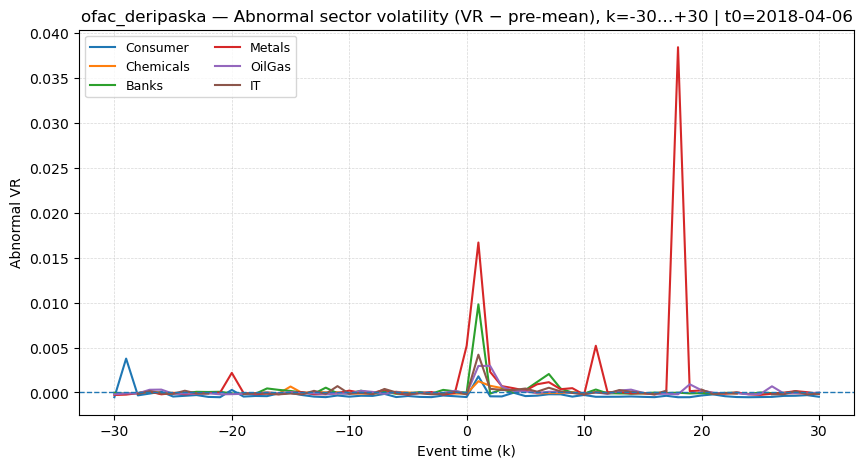

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2018-04-06_ofac_deripaska_sector_abnVOL.png


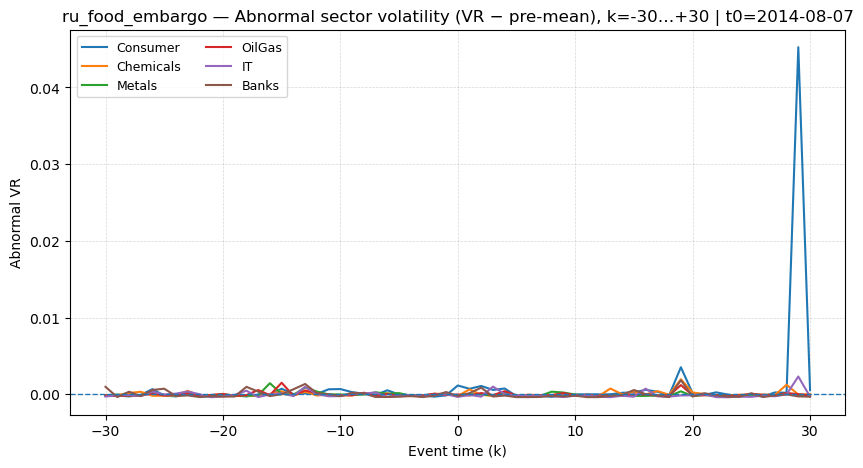

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2014-08-07_ru_food_embargo_sector_abnVOL.png


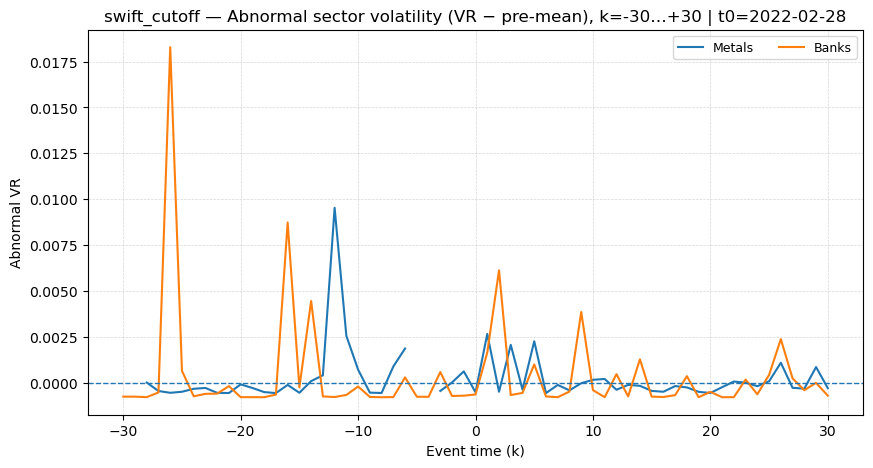

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2022-02-28_swift_cutoff_sector_abnVOL.png


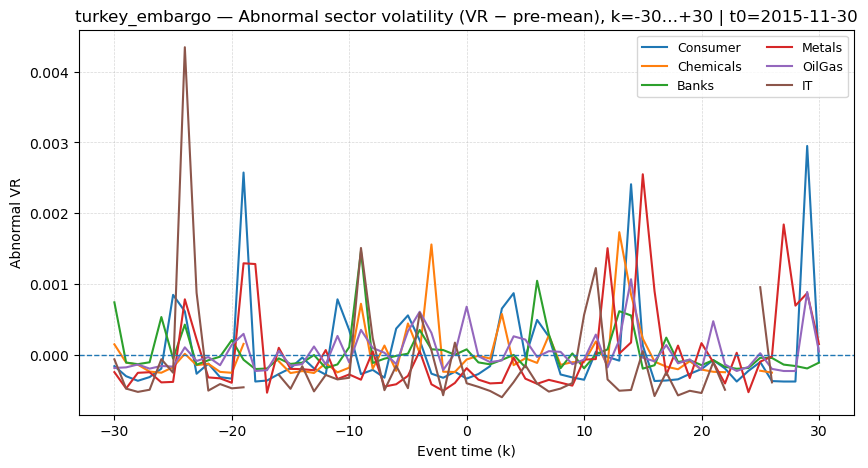

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2015-11-30_turkey_embargo_sector_abnVOL.png


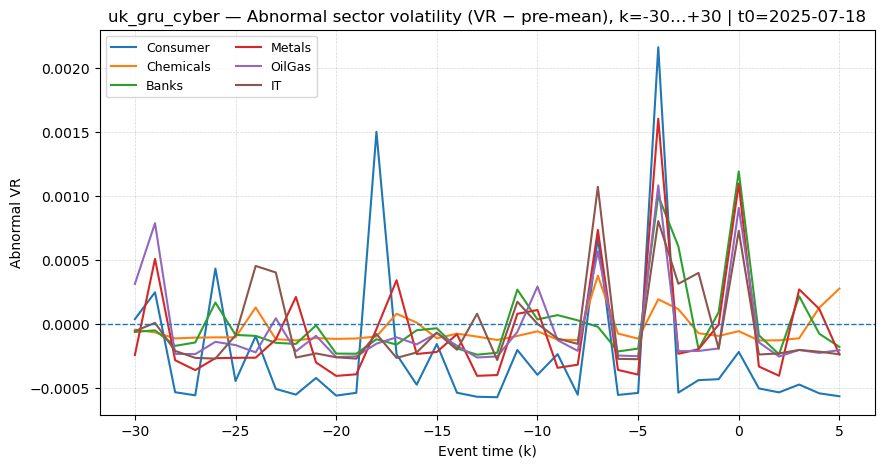

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2025-07-18_uk_gru_cyber_sector_abnVOL.png


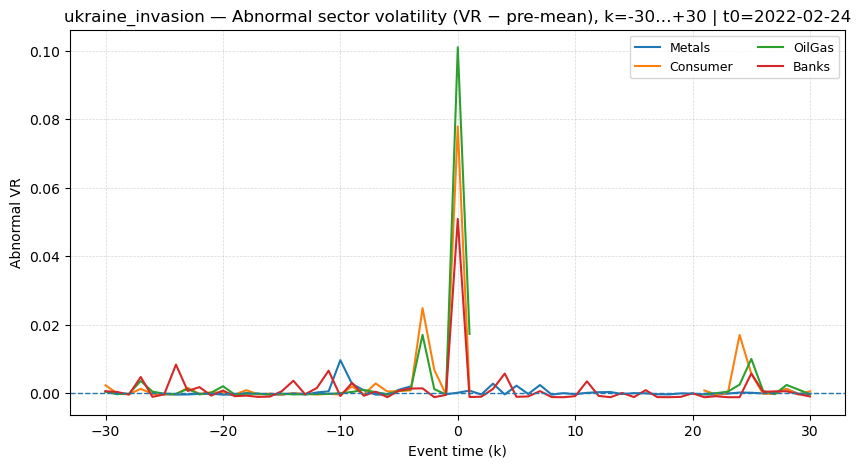

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2022-02-24_ukraine_invasion_sector_abnVOL.png


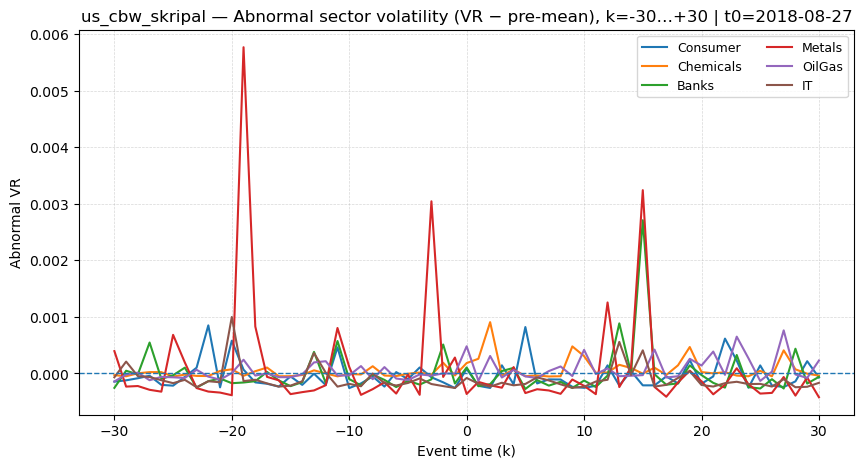

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2018-08-27_us_cbw_skripal_sector_abnVOL.png


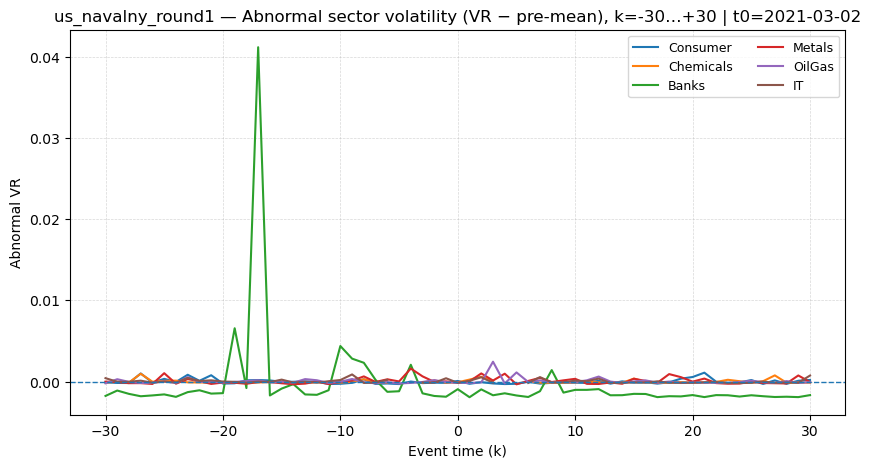

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2021-03-02_us_navalny_round1_sector_abnVOL.png


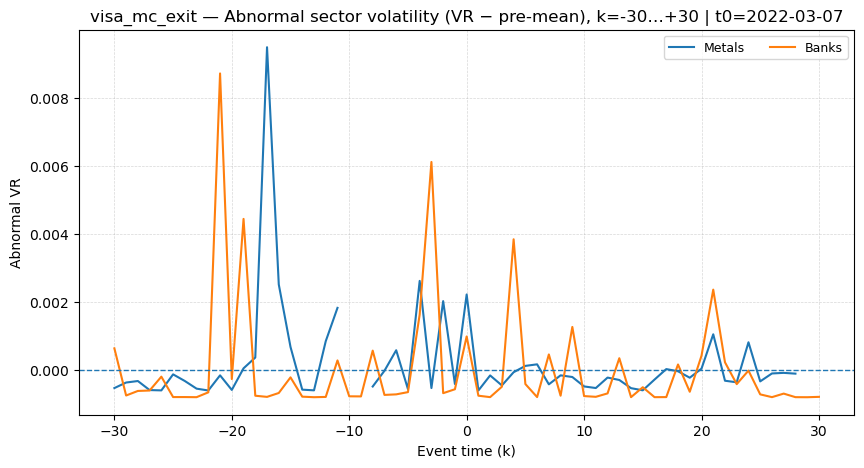

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_volatility/2022-03-07_visa_mc_exit_sector_abnVOL.png
[OK] Volatility endpoints (+FDR) saved → /Users/lacinustunkal/Downloads/event_vol_endpoints_FDR.csv

Step 5B done. Plots in /Users/lacinustunkal/Downloads/plots_event_volatility


In [21]:
# CELL 5B — Announcement-day volatility tests (pre/post) + plots by sector  [fixed BH–FDR + small guards]

import os, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEAT_VOL   = os.path.join(DOWNLOADS, "features_vol.parquet")
EVENTS_CSV = os.path.join(DOWNLOADS, "events_clean_aligned.csv")
COVER_CSV  = os.path.join(DOWNLOADS, "coverage_matrix.csv")
SPEC_CSV   = os.path.join(DOWNLOADS, "event_windows_spec.csv")

OUT_VOL_ENDPT = os.path.join(DOWNLOADS, "event_vol_endpoints_FDR.csv")
OUT_DIR_PLOTS = os.path.join(DOWNLOADS, "plots_event_volatility")
os.makedirs(OUT_DIR_PLOTS, exist_ok=True)

# ---- load ----
df = pd.read_parquet(FEAT_VOL).sort_values(["ticker","date"])
df["date"] = pd.to_datetime(df["date"])
df = df[df["valid_ret"]].copy()  # only days with valid returns

events = pd.read_csv(EVENTS_CSV, parse_dates=["date","effective_date"])
cover  = pd.read_csv(COVER_CSV, parse_dates=["effective_date"])

# calendar for event-time indexing
calendar = sorted(df["date"].drop_duplicates().tolist())

def cal_window(t0, a, b):
    """Return list of calendar dates in [t0+a, t0+b] using trading calendar offsets."""
    pos = np.searchsorted(calendar, t0)
    i0, i1 = max(0, pos + a), min(len(calendar) - 1, pos + b)
    return calendar[i0:i1+1] if i0 <= i1 else []

# keep only stock–event pairs the coverage matrix said were usable
use_pairs = cover[cover["use_for_eventstudy"]].copy()
use_pairs = use_pairs.merge(
    events[["label","effective_date","type","jurisdiction"]],
    left_on=["event_label","effective_date"],
    right_on=["label","effective_date"],
    how="left"
)
use_pairs["effective_date"] = pd.to_datetime(use_pairs["effective_date"])

# endpoints & pre window
POST_SPECS = {"post5": (0,5), "post10": (0,10), "post30": (0,30)}
PRE_OFFS   = (-60, -6)

rows = []
paths_done = 0

# ---- per-ticker log variance ratios and per-event plots ----
for (lbl, t0), gTick in use_pairs.groupby(["event_label","effective_date"]):
    t0 = pd.to_datetime(t0)
    tickers = gTick[["ticker","sector"]].drop_duplicates()

    for _, r in tickers.iterrows():
        tkr, sect = r["ticker"], r["sector"]
        sub = df[df["ticker"] == tkr]
        if sub.empty:
            continue

        # pre variance (guard for enough obs and nonzero)
        pre_dates = cal_window(t0, *PRE_OFFS)
        pre = sub[sub["date"].isin(pre_dates)]
        if pre["ret2"].count() < 20:
            continue
        var_pre = float(pre["ret2"].mean())
        if not np.isfinite(var_pre) or var_pre <= 0:
            continue

        for tag, (a, b) in POST_SPECS.items():
            post_dates = cal_window(t0, a, b)
            post = sub[sub["date"].isin(post_dates)]
            if post["ret2"].count() < 3:
                continue
            var_post = float(post["ret2"].mean())
            lv = np.log(var_post / var_pre) if (np.isfinite(var_post) and var_post > 0) else np.nan
            rows.append({
                "event_label": lbl, "t0": t0.date(), "sector": sect, "ticker": tkr,
                "endpoint": tag, "var_pre": var_pre, "var_post": var_post, "logVR": lv
            })

    # ---- quick plot: abnormal sector volatility paths (VR - pre mean) ----
    try:
        KLO, KHI = -30, 30
        kgrid = list(range(KLO, KHI+1))
        plot_rows = []
        for sect in tickers["sector"].unique():
            sect_tkrs = tickers.loc[tickers["sector"] == sect, "ticker"].tolist()
            subS = df[df["ticker"].isin(sect_tkrs)][["ticker","date","ret2"]].copy()

            base_dates = cal_window(t0, *PRE_OFFS)
            base = subS[subS["date"].isin(base_dates)]["ret2"].mean()
            base = float(base) if np.isfinite(base) else np.nan

            path = []
            for k in kgrid:
                dates_k = cal_window(t0, k, k)
                if not dates_k:
                    path.append(np.nan)
                    continue
                d = dates_k[0]
                m = subS.loc[subS["date"] == d, "ret2"].mean()
                m = float(m) if np.isfinite(m) else np.nan
                path.append(m - base if (np.isfinite(m) and np.isfinite(base)) else np.nan)
            plot_rows.append((sect, np.array(path, dtype=float)))

        fig, ax = plt.subplots(figsize=(10,5))
        for sect, vec in plot_rows:
            ax.plot(kgrid, vec, label=sect)
        ax.axhline(0, linestyle="--", linewidth=1)
        ax.set_title(f"{lbl} — Abnormal sector volatility (VR − pre-mean), k=-30…+30 | t0={t0.date()}")
        ax.set_xlabel("Event time (k)")
        ax.set_ylabel("Abnormal VR")
        ax.legend(ncol=2, fontsize=9)
        ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
        outp = os.path.join(OUT_DIR_PLOTS, f"{t0.date()}_{lbl}_sector_abnVOL.png")
        fig.savefig(outp, dpi=150, bbox_inches="tight")
        plt.show(); plt.close(fig)
        print(f"[OK] Saved {outp}")
        paths_done += 1
    except Exception as e:
        print(f"[WARN] Plot for {lbl} failed: {e}")

res = pd.DataFrame(rows)

# ---- aggregate & BH–FDR ----
if res.empty:
    print("[WARN] No volatility endpoint rows created.")
    pd.DataFrame().to_csv(OUT_VOL_ENDPT, index=False)
else:
    # sector-level stats for each (event, endpoint)
    agg = (res.groupby(["event_label","t0","sector","endpoint"])
             .agg(N=("ticker","nunique"),
                  mean_logVR=("logVR","mean"),
                  sd_logVR=("logVR","std"))
             .reset_index())

    # cross-sectional t (normal approx if N>1)
    def tstat_row(r):
        N = int(r["N"])
        sd = r["sd_logVR"]
        return (r["mean_logVR"] / (sd / math.sqrt(N))) if (N > 1 and pd.notna(sd) and sd > 0) else np.nan
    agg["t"] = agg.apply(tstat_row, axis=1)
    agg["p"] = agg["t"].apply(lambda z: 2*(1 - 0.5*(1 + math.erf(abs(z)/math.sqrt(2)))) if np.isfinite(z) else np.nan)

    # Correct, monotone BH–FDR (finite-p slice, rank by ascending p)
    def bh_fdr(pvals):
        p = np.asarray(pvals, dtype=float)
        finite = np.isfinite(p)
        q = np.full_like(p, np.nan, dtype=float)
        if finite.sum() == 0:
            return q
        p_f = p[finite]
        m = p_f.size
        order = np.argsort(p_f)                 # ascending p
        ranks = np.empty_like(order); ranks[order] = np.arange(1, m+1)
        q_f = p_f * m / ranks                   # raw BH
        # enforce monotonicity from largest p downward
        q_sorted_desc = np.minimum.accumulate(q_f[order[::-1]])[::-1]
        q_f_mapped = np.empty_like(q_f); q_f_mapped[order] = q_sorted_desc
        q[finite] = np.minimum(q_f_mapped, 1.0)
        return q

    out_blocks = []
    # control the FDR within each (event, endpoint) across sectors
    for (e, t0), g in agg.groupby(["event_label","t0"]):
        for ep, gg in g.groupby("endpoint"):
            ggi = gg.copy().sort_values("p")
            ggi["q_BH"] = bh_fdr(ggi["p"].values)
            ggi["sig_10pct"] = (ggi["q_BH"] <= 0.10).astype(int)
            ggi["sig_5pct"]  = (ggi["q_BH"] <= 0.05).astype(int)
            out_blocks.append(ggi)

    out = (pd.concat(out_blocks, ignore_index=True)
             .sort_values(["t0","event_label","endpoint","sector"])
             .reset_index(drop=True))

    out.to_csv(OUT_VOL_ENDPT, index=False)
    print(f"[OK] Volatility endpoints (+FDR) saved → {OUT_VOL_ENDPT}")

print(f"\nStep 5B done. Plots in {OUT_DIR_PLOTS}")


[OK] Reopen volatility (sector×k) saved → /Users/lacinustunkal/Downloads/reopen_volatility_by_sector.csv


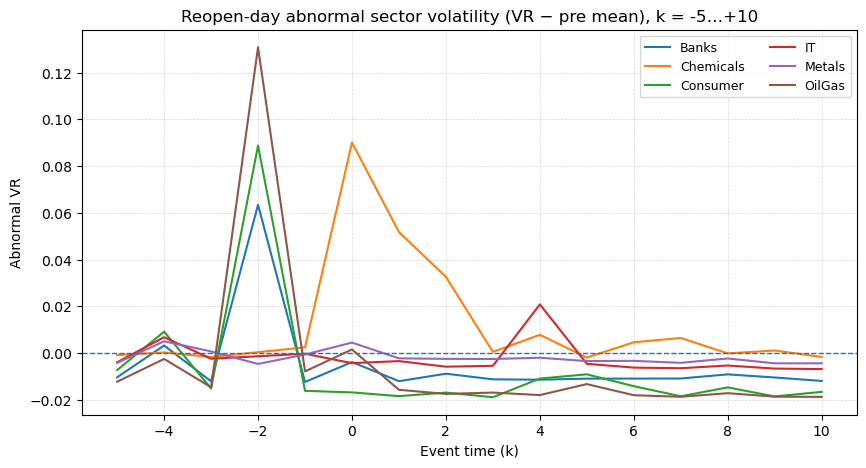

[OK] Saved /Users/lacinustunkal/Downloads/plots_reopen_volatility/reopen_abnVOL_by_sector.png


In [22]:
# CELL 5C — Reopen-day sector volatility around k = -5…+10 (uses reopen_event_panel.parquet)  (unchanged behavior)

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DOWNLOADS = "/Users/lacinustunkal/Downloads"
PANEL_PARQ = os.path.join(DOWNLOADS, "reopen_event_panel.parquet")

OUT_RE_VOL   = os.path.join(DOWNLOADS, "reopen_volatility_by_sector.csv")
OUT_RE_PLOTS = os.path.join(DOWNLOADS, "plots_reopen_volatility")
os.makedirs(OUT_RE_PLOTS, exist_ok=True)

p = pd.read_parquet(PANEL_PARQ)
p = p[p["is_valid"]].copy()
p["k"] = p["k"].astype(int)
p["vr"] = p["logret_event"]**2

pre = (p[p["k"].between(-5,-1)].groupby("sector")["vr"].mean().rename("pre_mean")).reset_index()
vrk = (p.groupby(["sector","k"])["vr"].mean().reset_index())
vrk = vrk.merge(pre, on="sector", how="left")
vrk["abnVR"] = vrk["vr"] - vrk["pre_mean"]

vrk.to_csv(OUT_RE_VOL, index=False)
print(f"[OK] Reopen volatility (sector×k) saved → {OUT_RE_VOL}")

fig, ax = plt.subplots(figsize=(10,5))
for s in vrk["sector"].drop_duplicates():
    ss = vrk[vrk["sector"]==s].sort_values("k")
    ax.plot(ss["k"].values, ss["abnVR"].values, label=s)
ax.axhline(0, linestyle="--", linewidth=1)
ax.set_title("Reopen-day abnormal sector volatility (VR − pre mean), k = -5…+10")
ax.set_xlabel("Event time (k)"); ax.set_ylabel("Abnormal VR")
ax.legend(ncol=2, fontsize=9); ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
outp = os.path.join(OUT_RE_PLOTS, "reopen_abnVOL_by_sector.png")
plt.savefig(outp, dpi=150, bbox_inches="tight")
plt.show(); plt.close(fig)
print(f"[OK] Saved {outp}")


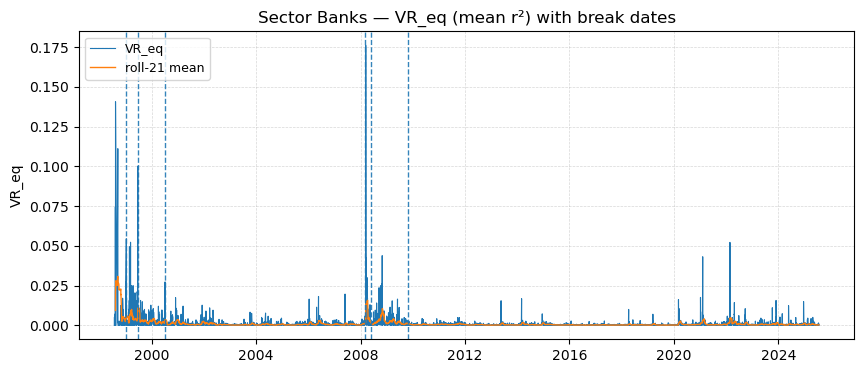

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks/Banks_vol_breaks.png


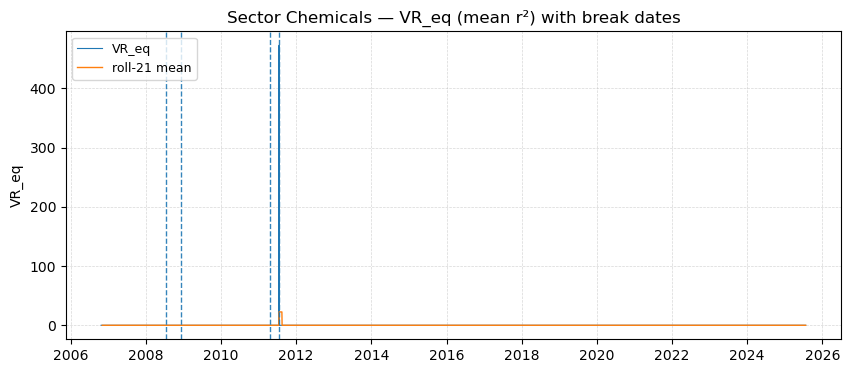

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks/Chemicals_vol_breaks.png


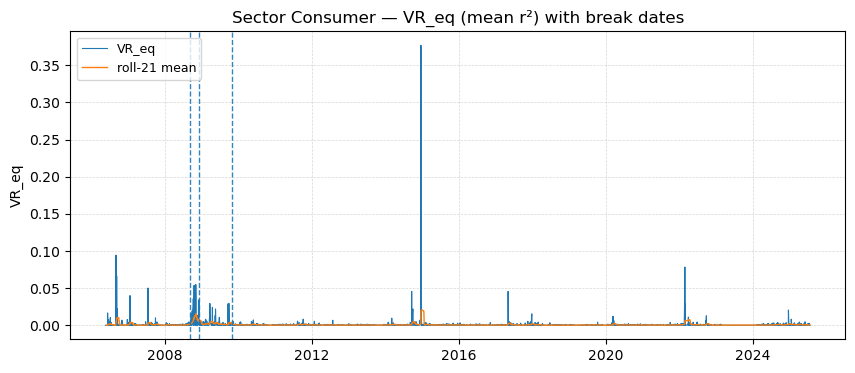

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks/Consumer_vol_breaks.png


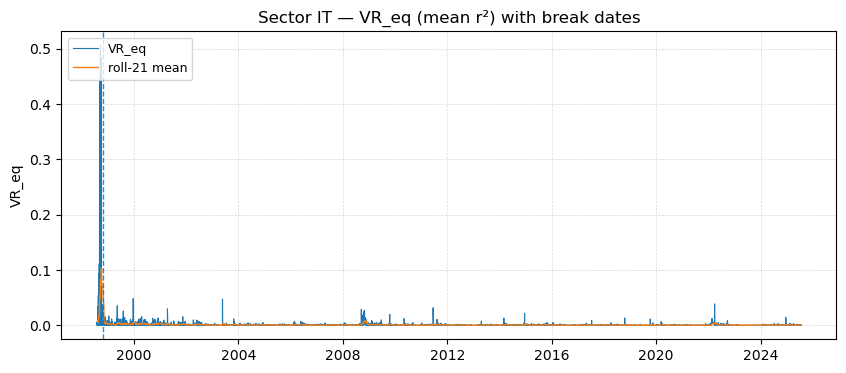

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks/IT_vol_breaks.png


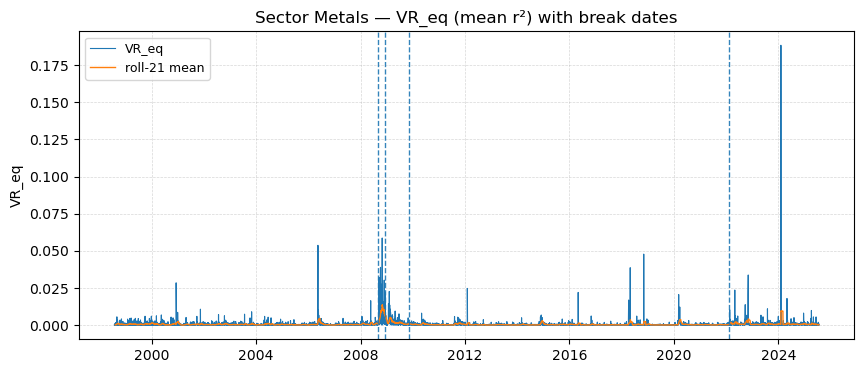

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks/Metals_vol_breaks.png


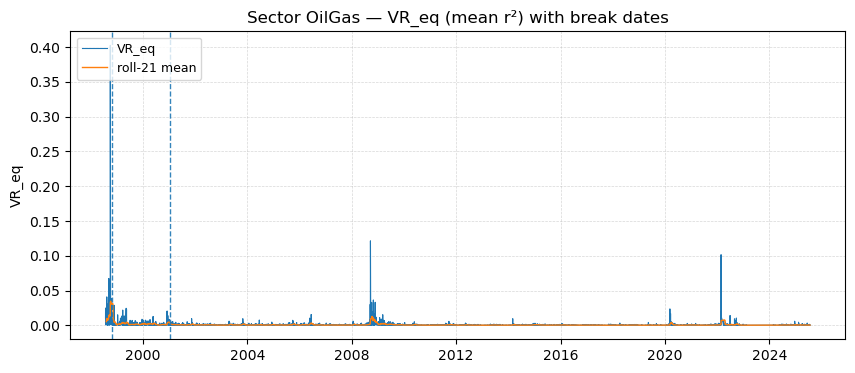

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks/OilGas_vol_breaks.png
[OK] Break dates saved → /Users/lacinustunkal/Downloads/sector_vol_breaks.csv
Step 5D complete.


In [23]:
# CELL 5D — Sector volatility structural breaks using 'ruptures' (with min_size + penalty selection)

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DOWNLOADS = "/Users/lacinustunkal/Downloads"
SECT_VOL  = os.path.join(DOWNLOADS, "sector_vol_eq.parquet")

OUT_BREAKS = os.path.join(DOWNLOADS, "sector_vol_breaks.csv")
OUT_DIR    = os.path.join(DOWNLOADS, "plots_sector_vol_breaks")
os.makedirs(OUT_DIR, exist_ok=True)

sect = pd.read_parquet(SECT_VOL)

def get_block(df, key):
    cols = [c for c in df.columns if isinstance(c, tuple) and c[0]==key]
    out = pd.DataFrame(index=df.index)
    for _, sec in cols:
        out[sec] = df[(key, sec)]
    out.index.name = "date"
    return out.sort_index()

VRw = get_block(sect, "VR_eq")

try:
    import ruptures as rpt
    HAVE_RUPTURES = True
except Exception:
    HAVE_RUPTURES = False
    print("[WARN] Package 'ruptures' not found. Skipping break detection. (pip install ruptures)")

rows = []

if HAVE_RUPTURES:
    MIN_SIZE = 60                # ≥ ~3 months of trading to avoid micro-segments
    MAX_BKPS = 4                 # hard cap as a safety net
    PEN_SCALE = 2.0              # penalty multiplier for BIC-like rule of thumb

    for sec in VRw.columns:
        s = VRw[sec].dropna()
        d = s.index
        y = s.values
        n = len(y)
        if n < max(250, 2*MIN_SIZE):
            continue

        # Binary segmentation on L2 cost with min_size
        algo = rpt.Binseg(model="l2", min_size=MIN_SIZE).fit(y)

        # BIC-like penalty (units ~ SSE). Heuristic but practical:
        pen = PEN_SCALE * np.log(n) * np.nanvar(y)
        try:
            bkps = algo.predict(pen=pen)
            # Fallback if penalty yields no internal break
            if not bkps or (len(bkps) <= 1):
                bkps = algo.predict(n_bkps=min(MAX_BKPS, max(1, n//MIN_SIZE - 1)))
        except Exception:
            bkps = algo.predict(n_bkps=min(MAX_BKPS, max(1, n//MIN_SIZE - 1)))

        # bkps are 1-based segment ends; exclude the final n for break list
        cp_idx = [i-1 for i in bkps[:-1] if 0 < i-1 < n]
        cp_dates = [d[i].date() for i in cp_idx]

        # Pre/post segment means for interpretability
        seg_starts = [0] + bkps[:-1]
        seg_ends   = bkps  # inclusive ends in ruptures' convention
        # Build a map from break index to (pre_mean, post_mean, pre_len, post_len)
        seg_info = {}
        for k in range(len(seg_starts)-1):
            pre_start = seg_starts[k]
            pre_end   = seg_ends[k]               # 1-based end
            post_start= seg_starts[k+1]
            post_end  = seg_ends[k+1]
            pre_slice  = y[pre_start:pre_end]     # np slicing is end-exclusive; pre_end is 1-based
            post_slice = y[post_start:post_end]
            seg_info[seg_ends[k]-1] = {
                "pre_mean":  float(np.nanmean(pre_slice)) if pre_slice.size else np.nan,
                "post_mean": float(np.nanmean(post_slice)) if post_slice.size else np.nan,
                "pre_len":   int(pre_slice.size),
                "post_len":  int(post_slice.size),
            }

        for i, cd in zip(cp_idx, cp_dates):
            info = seg_info.get(i, {})
            rows.append({
                "sector": sec,
                "break_date": cd,
                "idx": int(i),
                "pre_mean": info.get("pre_mean", np.nan),
                "post_mean": info.get("post_mean", np.nan),
                "pre_len": info.get("pre_len", np.nan),
                "post_len": info.get("post_len", np.nan)
            })

        # --- Plot with optional rolling mean overlay ---
        fig, ax = plt.subplots(figsize=(10, 4))
        ax.plot(d, y, linewidth=0.8, label="VR_eq")
        # Rolling mean for readability (21 trading days)
        try:
            y_rm = pd.Series(y, index=d).rolling(21, min_periods=10).mean()
            ax.plot(d, y_rm.values, linewidth=1.0, label="roll-21 mean")
        except Exception:
            pass
        for cd in cp_dates:
            ax.axvline(pd.to_datetime(cd), linestyle="--", linewidth=1, alpha=0.9)
        ax.set_title(f"Sector {sec} — VR_eq (mean r²) with break dates")
        ax.set_ylabel("VR_eq"); ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
        ax.legend(loc="upper left", fontsize=9)
        outp = os.path.join(OUT_DIR, f"{sec}_vol_breaks.png")
        fig.savefig(outp, dpi=150, bbox_inches="tight")
        plt.show(); plt.close(fig)
        print(f"[OK] Saved {outp}")

else:
    rows.append({"sector":"NOTE","break_date":"ruptures_not_installed",
                 "idx":np.nan,"pre_mean":np.nan,"post_mean":np.nan,
                 "pre_len":np.nan,"post_len":np.nan})

pd.DataFrame(rows).to_csv(OUT_BREAKS, index=False)
print(f"[OK] Break dates saved → {OUT_BREAKS}")
print("Step 5D complete.")


[OK] Saved top r^2 outliers by sector → /Users/lacinustunkal/Downloads/outliers_top_r2_by_sector.csv
[OK] Saved per-ticker winsor thresholds → /Users/lacinustunkal/Downloads/winsor_thresholds_by_ticker.csv
[OK] Winsorization impact per ticker → /Users/lacinustunkal/Downloads/winsor_impact_by_ticker.csv
[OK] Saved winsorized sector volatility panel → /Users/lacinustunkal/Downloads/sector_vol_eq_winsor.parquet


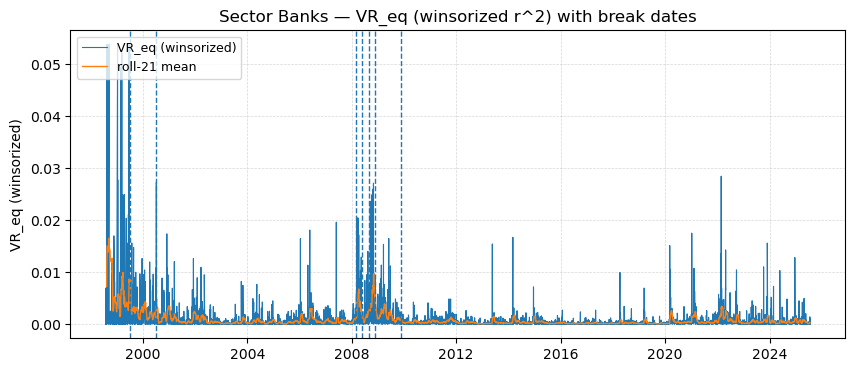

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks_w/Banks_vol_breaks_winsor.png


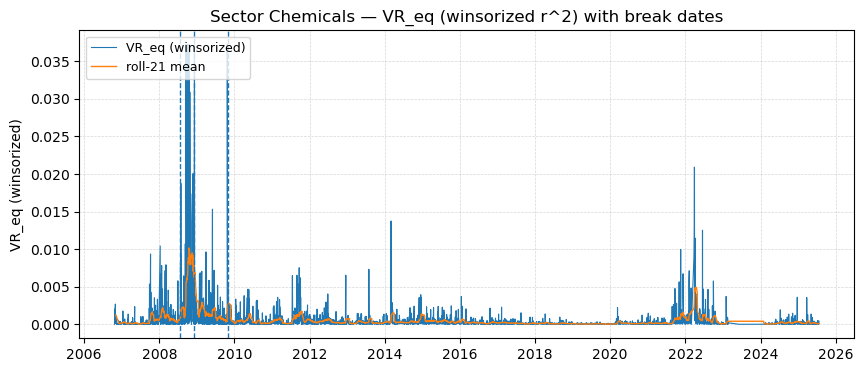

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks_w/Chemicals_vol_breaks_winsor.png


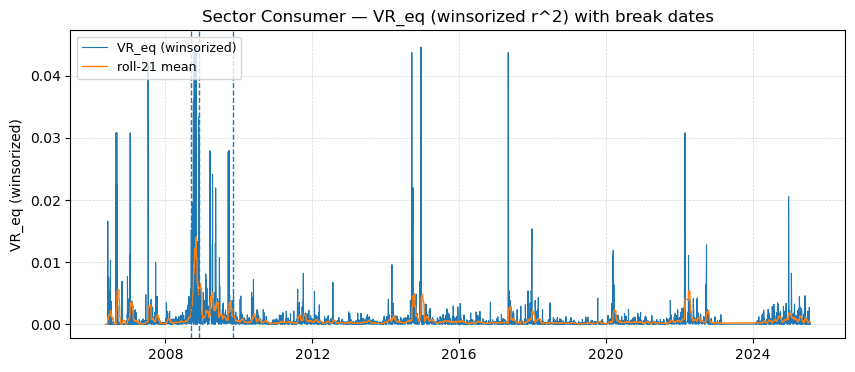

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks_w/Consumer_vol_breaks_winsor.png


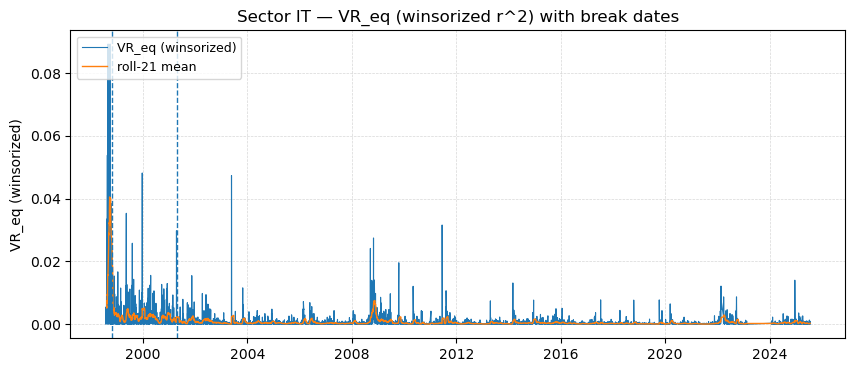

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks_w/IT_vol_breaks_winsor.png


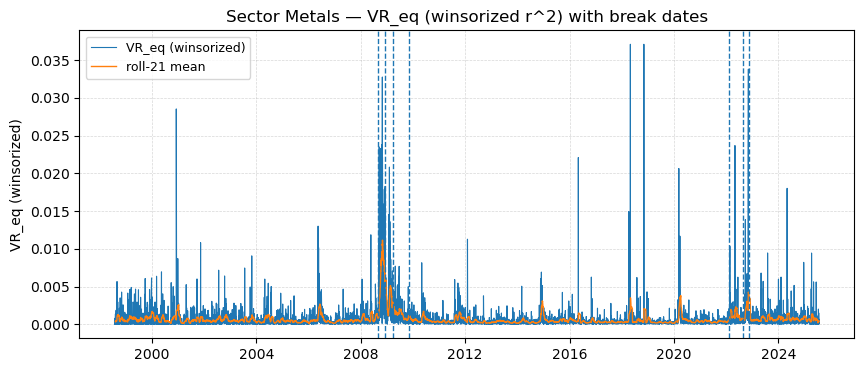

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks_w/Metals_vol_breaks_winsor.png


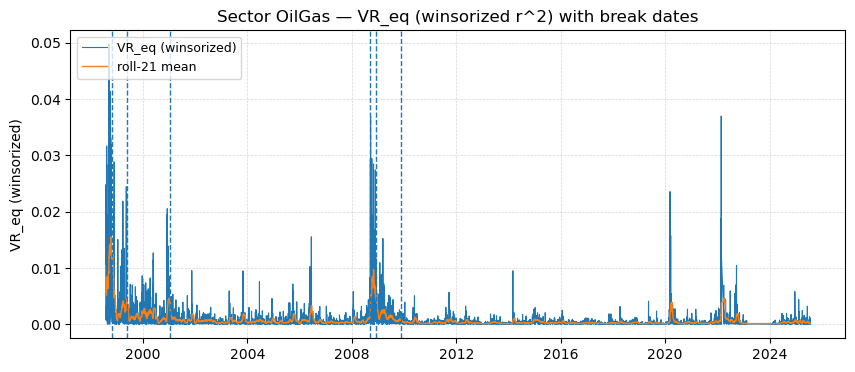

[OK] Saved /Users/lacinustunkal/Downloads/plots_sector_vol_breaks_w/OilGas_vol_breaks_winsor.png
[OK] Winsorized break dates saved → /Users/lacinustunkal/Downloads/sector_vol_breaks_winsor.csv

=== Quick checks ===
Top 5 raw r^2 (any sector):
          sector       date ticker        ret        ret2  rank_in_sector
57473  Chemicals 2011-07-18   PHOR  30.753561  945.781543               1
38271     Metals 2024-02-07   MAGN   1.062500    1.128906               1
1715    Consumer 2014-12-18   AFKS   1.062028    1.127903               1
94045     OilGas 1998-10-02  SNGSP  -0.885028    0.783274               1
74245         IT 1998-09-18   RTKM   0.711712    0.506535               1

Winsorized VR_eq head (wide):
sector         Banks  Chemicals  Consumer        IT    Metals    OilGas
date                                                                   
1998-07-27       NaN        NaN       NaN  0.005397       NaN  0.010703
1998-07-28  0.000000        NaN       NaN  0.001837  0.000403  0.0

In [24]:
# 5D+ — Outlier diagnostics and winsorized sector volatility breaks (enhanced)
import os, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEAT_VOL   = os.path.join(DOWNLOADS, "features_vol.parquet")     # from 5A
SECT_RAW   = os.path.join(DOWNLOADS, "sector_vol_eq.parquet")    # raw sector VR (for reference)

OUT_TOP    = os.path.join(DOWNLOADS, "outliers_top_r2_by_sector.csv")
OUT_THR    = os.path.join(DOWNLOADS, "winsor_thresholds_by_ticker.csv")
SECT_WIN   = os.path.join(DOWNLOADS, "sector_vol_eq_winsor.parquet")
OUT_BRK_W  = os.path.join(DOWNLOADS, "sector_vol_breaks_winsor.csv")
OUT_IMPACT = os.path.join(DOWNLOADS, "winsor_impact_by_ticker.csv")  # NEW: diagnostics

PLOT_DIR_W = os.path.join(DOWNLOADS, "plots_sector_vol_breaks_w")
os.makedirs(PLOT_DIR_W, exist_ok=True)

# -------------------------
# 1) Load per-stock returns
# -------------------------
df = pd.read_parquet(FEAT_VOL).sort_values(["ticker","date"])
df["date"] = pd.to_datetime(df["date"])
df = df[df["valid_ret"]].copy()

# -------------------------
# 2) Outlier diagnostics: top r^2 per sector (raw)
# -------------------------
df["ret2"] = df["ret"]**2
tops = (df.sort_values("ret2", ascending=False)
          .groupby("sector")
          .head(10)[["sector","date","ticker","ret","ret2"]]
          .copy())
tops["rank_in_sector"] = tops.groupby("sector")["ret2"].rank(ascending=False, method="first").astype(int)
tops = tops.sort_values(["sector","rank_in_sector","date"])
tops.to_csv(OUT_TOP, index=False)
print(f"[OK] Saved top r^2 outliers by sector → {OUT_TOP}")

# ------------------------------------------------
# 3) Per-ticker 99.9% winsorization of |ret|
#    + record impact (% of days clipped) per ticker
# ------------------------------------------------
df["absret"] = df["ret"].abs()

# Per-ticker thresholds
thr = (df.groupby("ticker")["absret"]
         .quantile(0.999)
         .rename("thr_absret")
         .reset_index())
thr["thr_absret"] = thr["thr_absret"].replace([np.inf, -np.inf], np.nan)

# Counts for fallback logic
counts = df.groupby("ticker")["ret"].size().rename("n").reset_index()

# Sector-level fallback
sec_thr = (df.groupby("sector")["absret"]
             .quantile(0.999)
             .rename("sec_thr")
             .reset_index())

# Merge
df = df.merge(thr, on="ticker", how="left")
df = df.merge(counts, on="ticker", how="left")
df = df.merge(df[["ticker","sector"]].drop_duplicates().merge(sec_thr, on="sector"),
              on=["ticker","sector"], how="left")

global_thr = float(df["absret"].quantile(0.999))

def pick_thr(row):
    if pd.notna(row["thr_absret"]) and row["n"] >= 100 and row["thr_absret"] > 0:
        return row["thr_absret"]
    if pd.notna(row["sec_thr"]) and row["sec_thr"] > 0:
        return row["sec_thr"]
    return global_thr

df["thr_use"] = df.apply(pick_thr, axis=1)

thr_out = df[["ticker","sector","n","thr_use"]].drop_duplicates().sort_values(["sector","ticker"])
thr_out.to_csv(OUT_THR, index=False)
print(f"[OK] Saved per-ticker winsor thresholds → {OUT_THR}")

# Vectorized winsorization (faster than row-wise apply)
clip_amt = df["thr_use"].astype(float)
absret = df["absret"].astype(float)
clipped_abs = np.minimum(absret.values, clip_amt.values)
df["ret_w"]  = np.sign(df["ret"].values) * clipped_abs
df["ret2_w"] = df["ret_w"]**2

# Winsorization impact (% days clipped) per ticker
df["was_clipped"] = (absret.values > clip_amt.values).astype(int)
impact = (df.groupby(["ticker","sector"])
            .agg(n_days=("ret","size"),
                 n_clipped=("was_clipped","sum"))
            .reset_index())
impact["clip_share_%"] = (impact["n_clipped"] / impact["n_days"] * 100).round(3)
impact = impact.sort_values(["sector","clip_share_%","ticker"], ascending=[True, False, True])
impact.to_csv(OUT_IMPACT, index=False)
print(f"[OK] Winsorization impact per ticker → {OUT_IMPACT}")

# ----------------------------------------------------------------
# 4) Build winsorized equal-weight sector variance (mean of r^2_w)
# ----------------------------------------------------------------
sect_w = (df.groupby(["date","sector"])["ret2_w"]
            .mean()
            .rename("VR_eq")
            .reset_index()
            .sort_values(["sector","date"]))

VR_wide = sect_w.pivot(index="date", columns="sector", values="VR_eq").sort_index()
VR_wide.columns.name = "sector"
VR_wide_multi = pd.concat({"VR_eq": VR_wide}, axis=1)
VR_wide_multi.to_parquet(SECT_WIN, engine="pyarrow")
print(f"[OK] Saved winsorized sector volatility panel → {SECT_WIN}")

# --------------------------------------------------------
# 5) Break detection on winsorized VR_eq (robust settings)
# --------------------------------------------------------
try:
    import ruptures as rpt
    HAVE_RUPTURES = True
except Exception:
    HAVE_RUPTURES = False
    print("[WARN] 'ruptures' not installed. Skipping break detection. (pip install ruptures)")

def get_block(df, key):
    cols = [c for c in df.columns if isinstance(c, tuple) and c[0]==key]
    out = pd.DataFrame(index=df.index)
    for _, sec in cols:
        out[sec] = df[(key, sec)]
    out.index.name = "date"
    return out.sort_index()

break_rows = []
if HAVE_RUPTURES:
    VRw = get_block(VR_wide_multi, "VR_eq")
    MIN_SIZE = 60
    MAX_BKPS = 4
    PEN_SCALE = 2.0

    for sec in VRw.columns:
        s = VRw[sec].dropna()
        d = s.index
        y = s.values
        n = len(y)
        if n < max(250, 2*MIN_SIZE):
            continue

        algo = rpt.Binseg(model="l2", min_size=MIN_SIZE).fit(y)

        pen = PEN_SCALE * np.log(n) * np.nanvar(y)
        try:
            bkps = algo.predict(pen=pen)
            if not bkps or (len(bkps) <= 1):
                bkps = algo.predict(n_bkps=min(MAX_BKPS, max(1, n//MIN_SIZE - 1)))
        except Exception:
            bkps = algo.predict(n_bkps=min(MAX_BKPS, max(1, n//MIN_SIZE - 1)))

        cp_idx = [i-1 for i in bkps[:-1] if 0 < i-1 < n]
        cp_dates = [d[i].date() for i in cp_idx]

        # Pre/post segment means for interpretability
        seg_starts = [0] + bkps[:-1]
        seg_ends   = bkps
        seg_info = {}
        for k in range(len(seg_starts)-1):
            pre_start = seg_starts[k]
            pre_end   = seg_ends[k]
            post_start= seg_starts[k+1]
            post_end  = seg_ends[k+1]
            pre_slice  = y[pre_start:pre_end]
            post_slice = y[post_start:post_end]
            seg_info[seg_ends[k]-1] = {
                "pre_mean":  float(np.nanmean(pre_slice)) if pre_slice.size else np.nan,
                "post_mean": float(np.nanmean(post_slice)) if post_slice.size else np.nan,
                "pre_len":   int(pre_slice.size),
                "post_len":  int(post_slice.size),
            }

        for i, cd in zip(cp_idx, cp_dates):
            info = seg_info.get(i, {})
            break_rows.append({
                "sector": sec,
                "break_date": cd,
                "idx": int(i),
                "pre_mean": info.get("pre_mean", np.nan),
                "post_mean": info.get("post_mean", np.nan),
                "pre_len": info.get("pre_len", np.nan),
                "post_len": info.get("post_len", np.nan),
            })

        # Plot
        fig, ax = plt.subplots(figsize=(10,4))
        ax.plot(d, y, linewidth=0.8, label="VR_eq (winsorized)")
        try:
            ax.plot(d, pd.Series(y, index=d).rolling(21, min_periods=10).mean().values, linewidth=1.0, label="roll-21 mean")
        except Exception:
            pass
        for cd in cp_dates:
            ax.axvline(pd.to_datetime(cd), linestyle="--", linewidth=1)
        ax.set_title(f"Sector {sec} — VR_eq (winsorized r^2) with break dates")
        ax.set_ylabel("VR_eq (winsorized)")
        ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
        ax.legend(loc="upper left", fontsize=9)
        outp = os.path.join(PLOT_DIR_W, f"{sec}_vol_breaks_winsor.png")
        fig.savefig(outp, dpi=150, bbox_inches="tight")
        plt.show(); plt.close(fig)
        print(f"[OK] Saved {outp}")
else:
    break_rows.append({"sector":"NOTE","break_date":"ruptures_not_installed",
                       "idx":np.nan,"pre_mean":np.nan,"post_mean":np.nan,
                       "pre_len":np.nan,"post_len":np.nan})

pd.DataFrame(break_rows).to_csv(OUT_BRK_W, index=False)
print(f"[OK] Winsorized break dates saved → {OUT_BRK_W}")

# -------------------------
# 6) Quick sanity printouts
# -------------------------
print("\n=== Quick checks ===")
print("Top 5 raw r^2 (any sector):")
print(tops.sort_values("ret2", ascending=False).head(5))
print("\nWinsorized VR_eq head (wide):")
print(VR_wide.head())
print("\nMost-clipped tickers (top 10 by %):")
print(impact.sort_values("clip_share_%", ascending=False).head(10))


/var/folders/2l/qgsmp9sn5pl43mfd35pq95b40000gn/T/ipykernel_43411/2363544774.py:32: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df["roll_spread"] = df.groupby("ticker", group_keys=False).apply(roll_spread_series)


[OK] Liquidity endpoints (+FDR) saved → /Users/lacinustunkal/Downloads/event_liquidity_endpoints_FDR.csv


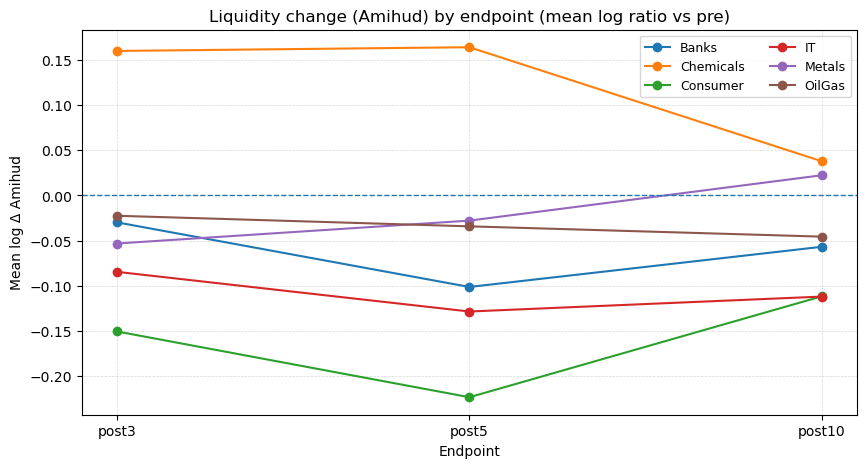

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_liquidity/liquidity_Amihud_endpoints.png


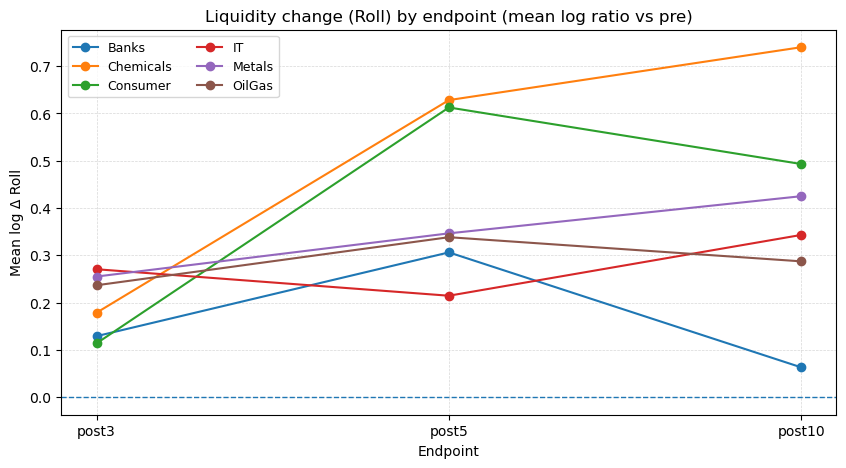

[OK] Saved /Users/lacinustunkal/Downloads/plots_event_liquidity/liquidity_Roll_endpoints.png

Step 5E complete (liquidity Amihud/Roll, endpoints + FDR).


In [25]:
# 5E — Liquidity event tests (Amihud & Roll proxies): endpoints + BH-FDR + plots (fixed)

import os, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DOWNLOADS   = "/Users/lacinustunkal/Downloads"
FEAT_PARQ   = os.path.join(DOWNLOADS, "features_basic.parquet")      # has amihud_w, dollar_vol, ret, close
EVENTS_CSV  = os.path.join(DOWNLOADS, "events_clean_aligned.csv")
COVER_CSV   = os.path.join(DOWNLOADS, "coverage_matrix.csv")

OUT_LIQ_ENDPT = os.path.join(DOWNLOADS, "event_liquidity_endpoints_FDR.csv")
OUT_LIQ_PLOTS = os.path.join(DOWNLOADS, "plots_event_liquidity")
os.makedirs(OUT_LIQ_PLOTS, exist_ok=True)

# ---------------- Load base panel ----------------
df = pd.read_parquet(FEAT_PARQ).sort_values(["ticker","date"])
df["date"] = pd.to_datetime(df["date"])
df = df[df["valid_ret"]].copy()

# ---------------- Roll(1984) spread proxy ----------------
# Effective spread ≈ 2 * sqrt( - Cov(Δp_t, Δp_{t-1}) ) on a rolling window
df["price_change"] = df.groupby("ticker")["close"].diff()

def roll_spread_series(g, win=21, min_frac=0.8):
    x = g["price_change"]
    cov = x.rolling(win, min_periods=max(1, int(win*min_frac))).cov(x.shift(1))
    spr = 2.0 * np.sqrt(np.maximum(-cov, 0.0))
    return spr

df["roll_spread"] = df.groupby("ticker", group_keys=False).apply(roll_spread_series)

# ---------------- Events & coverage ----------------
events = pd.read_csv(EVENTS_CSV, parse_dates=["date","effective_date"])
cover  = pd.read_csv(COVER_CSV,  parse_dates=["effective_date"])

calendar = sorted(df["date"].drop_duplicates().tolist())
def cal_window(t0, a, b):
    pos = np.searchsorted(calendar, t0)
    i0, i1 = max(0, pos+a), min(len(calendar)-1, pos+b)
    return calendar[i0:i1+1] if i0 <= i1 else []

use_pairs = cover[cover["use_for_eventstudy"]].copy()
use_pairs = use_pairs.merge(
    events[["label","effective_date","type","jurisdiction"]],
    left_on=["event_label","effective_date"],
    right_on=["label","effective_date"],
    how="left"
)
use_pairs["effective_date"] = pd.to_datetime(use_pairs["effective_date"])

# ---------------- Endpoint design ----------------
POST_SPECS = {"post1": (0,1), "post3": (0,3), "post5": (0,5), "post10": (0,10)}
PRE_OFFS   = (-60, -6)
EPS        = 1e-12   # tiny floor to avoid log(0) if a median hits 0 exactly

rows = []
for (lbl, t0), gTick in use_pairs.groupby(["event_label","effective_date"]):
    t0 = pd.to_datetime(t0)
    tickers = gTick[["ticker","sector"]].drop_duplicates()

    for _, r in tickers.iterrows():
        tkr, sect = r["ticker"], r["sector"]
        sub = df[df["ticker"]==tkr]
        if sub.empty: 
            continue

        pre_dates = cal_window(t0, *PRE_OFFS)
        pre = sub[sub["date"].isin(pre_dates)]
        if pre.shape[0] < 20:
            continue

        pre_ami  = pre["amihud_w"].median()
        pre_roll = pre["roll_spread"].median()

        # Apply tiny floor for ratios only (keeps signs/levels unchanged)
        pre_ami_f  = pre_ami  if (pd.notna(pre_ami)  and pre_ami  > 0) else np.nan
        pre_roll_f = pre_roll if (pd.notna(pre_roll) and pre_roll > 0) else np.nan

        for tag, (a,b) in POST_SPECS.items():
            post_dates = cal_window(t0, a, b)
            post = sub[sub["date"].isin(post_dates)]
            if post.shape[0] < 3:
                continue

            post_ami  = post["amihud_w"].median()
            post_roll = post["roll_spread"].median()

            post_ami_f  = post_ami  if (pd.notna(post_ami)  and post_ami  > 0) else np.nan
            post_roll_f = post_roll if (pd.notna(post_roll) and post_roll > 0) else np.nan

            dA = np.log((post_ami_f + EPS)/(pre_ami_f + EPS))  if (pd.notna(pre_ami_f)  and pd.notna(post_ami_f))  else np.nan
            dR = np.log((post_roll_f + EPS)/(pre_roll_f + EPS)) if (pd.notna(pre_roll_f) and pd.notna(post_roll_f)) else np.nan

            rows.append({
                "event_label": lbl, "t0": t0.date(), "sector": sect, "ticker": tkr, "endpoint": tag,
                "log_delta_Amihud": dA, "log_delta_Roll": dR
            })

res = pd.DataFrame(rows)

# ---------------- BH–FDR helper (fixed & robust) ----------------
def bh_fdr(pvals):
    p = np.asarray(pvals, float)
    finite = np.isfinite(p)
    q = np.full_like(p, np.nan, dtype=float)
    if finite.sum() == 0:
        return q
    p_f = p[finite]
    m = p_f.size
    order = np.argsort(p_f)                          # ascending p
    ranks = np.empty_like(order); ranks[order] = np.arange(1, m+1)
    q_f = p_f * m / ranks
    # enforce monotonicity from largest p downward
    q_desc = np.minimum.accumulate(q_f[order[::-1]])[::-1]
    q_mapped = np.empty_like(q_f); q_mapped[order] = q_desc
    q[finite] = np.minimum(q_mapped, 1.0)
    return q

def agg_and_fdr(df_in, colname):
    agg = (df_in.groupby(["event_label","t0","sector","endpoint"])
             .agg(N=("ticker","nunique"),
                  mean_change=(colname,"mean"),
                  sd_change=(colname,"std"))
             .reset_index())

    # t test with normal approx if needed
    def tstat_row(r):
        if r["N"] > 1 and pd.notna(r["sd_change"]) and r["sd_change"] > 0:
            return r["mean_change"] / (r["sd_change"] / np.sqrt(r["N"]))
        return np.nan

    agg["t"] = agg.apply(tstat_row, axis=1)
    agg["p"] = agg["t"].apply(lambda z: 2*(1-0.5*(1+math.erf(abs(z)/math.sqrt(2)))) if np.isfinite(z) else np.nan)

    out_rows = []
    for (e, t0), g in agg.groupby(["event_label","t0"]):
        for ep, gg in g.groupby("endpoint"):
            ggi = gg.copy().sort_values("p")
            ggi["q_BH"] = bh_fdr(ggi["p"].values)
            ggi["sig_10pct"] = (ggi["q_BH"] <= 0.10).astype(int)
            ggi["sig_5pct"]  = (ggi["q_BH"] <= 0.05).astype(int)
            out_rows.append(ggi)
    return (pd.concat(out_rows, ignore_index=True)
              .sort_values(["t0","event_label","endpoint","sector"])
              .reset_index(drop=True))

# ---------------- Output tables + plots ----------------
if res.empty:
    print("[WARN] No liquidity endpoint rows created.")
    pd.DataFrame().to_csv(OUT_LIQ_ENDPT, index=False)
else:
    outA = agg_and_fdr(res.dropna(subset=["log_delta_Amihud"]), "log_delta_Amihud")
    outR = agg_and_fdr(res.dropna(subset=["log_delta_Roll"]),   "log_delta_Roll")
    outA["measure"] = "Amihud"
    outR["measure"] = "Roll"
    out = (pd.concat([outA, outR], ignore_index=True)
             .sort_values(["t0","event_label","measure","endpoint","sector"]))
    out.to_csv(OUT_LIQ_ENDPT, index=False)
    print(f"[OK] Liquidity endpoints (+FDR) saved → {OUT_LIQ_ENDPT}")

    # Ordered endpoint summary plots
    ep_order = {"post1":1, "post3":3, "post5":5, "post10":10}

    for measure, col in [("Amihud","log_delta_Amihud"), ("Roll","log_delta_Roll")]:
        fig, ax = plt.subplots(figsize=(10,5))
        tmp = res.groupby(["endpoint","sector"])[col].mean().reset_index()
        tmp["epn"] = tmp["endpoint"].map(ep_order)

        for s in tmp["sector"].unique():
            tps = tmp[tmp["sector"]==s].sort_values("epn")
            ax.plot(tps["endpoint"].values, tps[col].values, marker="o", label=s)

        ax.axhline(0, linestyle="--", linewidth=1)
        ax.set_title(f"Liquidity change ({measure}) by endpoint (mean log ratio vs pre)")
        ax.set_xlabel("Endpoint")
        ax.set_ylabel(f"Mean log Δ {measure}")
        ax.legend(ncol=2, fontsize=9)
        ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
        outp = os.path.join(OUT_LIQ_PLOTS, f"liquidity_{measure}_endpoints.png")
        plt.savefig(outp, dpi=150, bbox_inches="tight")
        plt.show(); plt.close(fig)
        print(f"[OK] Saved {outp}")

print("\nStep 5E complete (liquidity Amihud/Roll, endpoints + FDR).")


In [26]:
# CELL 5F — GARCH(1,1) persistence: pre vs post variance (per event × sector) with HAC t-tests  [NEW]

import os
import numpy as np
import pandas as pd
import warnings

DOWNLOADS   = "/Users/lacinustunkal/Downloads"
SECR_PARQ   = os.path.join(DOWNLOADS, "sector_returns.parquet")   # from Step 2B-2 (EW daily sector returns; wide)
EVENTS_CSV  = os.path.join(DOWNLOADS, "events_clean_aligned.csv")
COVER_CSV   = os.path.join(DOWNLOADS, "coverage_matrix.csv")

OUT_CSV     = os.path.join(DOWNLOADS, "garch_persistence_by_sector.csv")
PLOTS_DIR   = os.path.join(DOWNLOADS, "plots_garch_persistence")
os.makedirs(PLOTS_DIR, exist_ok=True)

# ---- settings ----
EST_WIN   = (-250, +250)  # estimation span around t0 for GARCH fit
PRE_WIN   = (-60,  -6)    # pre window (variance baseline)
POST_WIN  = (0,   +60)    # post window
HAC_LAG   = 10            # daily NW-HAC lag for variance-level regression
MIN_OBS_GARCH = 120       # minimum obs in estimation window to attempt GARCH

# ---- load data ----
secr = pd.read_parquet(SECR_PARQ).reset_index()
if "date" not in secr.columns:
    secr = secr.rename(columns={secr.columns[0]: "date"})
secr["date"] = pd.to_datetime(secr["date"])
secr = secr.sort_values("date")
sector_cols = [c for c in secr.columns if c != "date"]

events = pd.read_csv(EVENTS_CSV, parse_dates=["date","effective_date"])
cover  = pd.read_csv(COVER_CSV,  parse_dates=["effective_date"])

# sectors actually represented per event-date (usable tickers only)
use_pairs = cover[cover["use_for_eventstudy"]].copy()
sec_by_event = (use_pairs.groupby(["event_label","effective_date"])["sector"]
                        .unique().reset_index().rename(columns={"sector":"sectors"}))

calendar = secr["date"].tolist()

def cal_slice(t0, a, b):
    """Return list of trading dates from t0+a … t0+b (inclusive) using the sector calendar."""
    pos = np.searchsorted(calendar, pd.Timestamp(t0))
    i0, i1 = max(0, pos + a), min(len(calendar)-1, pos + b)
    return calendar[i0:i1+1] if i0 <= i1 else []

# ---- GARCH or fallback variance ----
def fit_garch_variance(y: pd.Series):
    """
    Fit GARCH(1,1) to returns y (decimal), using arch if available.
    Returns: variance series (decimal variance), dict of params, flag for fallback.
    """
    try:
        from arch.univariate import ConstantMean, GARCH, Normal
        # scale to percent to help optimizer
        y_pct = 100.0 * y.values
        am = ConstantMean(y_pct)
        am.volatility = GARCH(p=1, o=0, q=1)
        am.distribution = Normal()
        res = am.fit(disp="off", show_warning=False)
        sigma_pct = pd.Series(res.conditional_volatility, index=y.index)  # percent σ_t
        var_dec = (sigma_pct / 100.0) ** 2                                 # back to decimal variance
        params = {k: float(v) for k, v in res.params.items() if isinstance(v, (int, float, np.floating))}
        params.update({"alpha_plus_beta": float(params.get("alpha[1]", np.nan) + params.get("beta[1]", np.nan))})
        converged = bool(getattr(res, "converged", True))
        return var_dec, params | {"converged": converged}, False
    except Exception:
        # Fallback: 21-day rolling variance of returns (decimal)
        var_dec = y.rolling(21, min_periods=10).var()
        params = {"omega": np.nan, "alpha[1]": np.nan, "beta[1]": np.nan, "alpha_plus_beta": np.nan, "converged": False}
        return var_dec, params, True

# ---- HAC regression helper (statsmodels) ----
def nw_dummy_reg(y, D, maxlags=10):
    """
    OLS: log(y) = a + d*D + e, HAC(NW) SE with given maxlags.
    Returns: dict with coef d, t_d, p_d, n_obs.
    """
    import statsmodels.api as sm
    z = pd.DataFrame({"logv": np.log(y.values), "D": D.values}).dropna()
    if len(z) < 20:
        return {"delta": np.nan, "t": np.nan, "p": np.nan, "N": int(len(z))}
    X = sm.add_constant(z["D"].values, has_constant="add")
    mod = sm.OLS(z["logv"].values, X)
    res = mod.fit(cov_type="HAC", cov_kwds={"maxlags": maxlags})
    delta = float(res.params[1]); t = float(res.tvalues[1])
    try:
        p = float(res.pvalues[1])
    except Exception:
        p = np.nan
    return {"delta": delta, "t": t, "p": p, "N": int(res.nobs)}

# ---- main loop ----
rows = []
print("Running GARCH persistence tests per event × sector…")
for _, row in sec_by_event.iterrows():
    lbl = row["event_label"]; t0 = pd.to_datetime(row["effective_date"]); secs = list(row["sectors"])
    if not secs: 
        continue

    # estimation window r_t for all sectors
    est_dates = cal_slice(t0, *EST_WIN)
    if not est_dates:
        continue
    est_df = (secr.set_index("date").loc[est_dates, secs].dropna(how="all"))
    if est_df.shape[0] < MIN_OBS_GARCH:
        continue

    # pre/post masks for testing
    pre_dates  = set(cal_slice(t0, *PRE_WIN))
    post_dates = set(cal_slice(t0, *POST_WIN))

    for sec in secs:
        if sec not in est_df.columns:
            continue
        r = est_df[sec].dropna()
        if r.shape[0] < MIN_OBS_GARCH:
            continue

        var_hat, pars, fallback = fit_garch_variance(r)
        # Build test panel limited to pre+post windows
        dfv = var_hat.to_frame("var").reset_index().rename(columns={"index":"date"})
        dfv["is_pre"]  = dfv["date"].isin(pre_dates)
        dfv["is_post"] = dfv["date"].isin(post_dates)
        test = dfv[(dfv["is_pre"] | dfv["is_post"]) & dfv["var"].notna()].copy()
        if test.empty:
            continue

        # NW-HAC regression on log variance with Post dummy (only keep pre+post)
        test["D_post"] = test["is_post"].astype(int)
        res = nw_dummy_reg(test["var"], test["D_post"], maxlags=HAC_LAG)

        # also simple means (on variance) for reference
        pre_mean  = float(test.loc[test["is_pre"],  "var"].mean()) if (test["is_pre"].any())  else np.nan
        post_mean = float(test.loc[test["is_post"], "var"].mean()) if (test["is_post"].any()) else np.nan
        delta_log = res["delta"]; tstat = res["t"]; pval = res["p"]

        rows.append({
            "event_label": lbl, "t0": t0.date(), "sector": sec,
            "N_est": int(r.shape[0]),
            "pre_mean_var": pre_mean, "post_mean_var": post_mean,
            "delta_log_var_post": delta_log, "t_NW": tstat, "p_NW": pval, "N_prepost": res["N"],
            "omega": pars.get("omega", np.nan), "alpha": pars.get("alpha[1]", np.nan),
            "beta": pars.get("beta[1]", np.nan), "alpha_plus_beta": pars.get("alpha_plus_beta", np.nan),
            "garch_converged": bool(pars.get("converged", False)),
            "fallback_rolled": bool(fallback)
        })

out = pd.DataFrame(rows).sort_values(["t0","event_label","sector"])
out.to_csv(OUT_CSV, index=False)
print(f"[OK] GARCH persistence results → {OUT_CSV}  (rows: {len(out):,})")

# --- optional quick console peek ---
if not out.empty:
    show = out.copy()
    show["flag_high_persist"] = (show["alpha_plus_beta"] >= 0.95).astype(int)
    top = show.reindex(show["t_NW"].abs().sort_values(ascending=False).index).head(10)
    print("\nTop |t_NW| (variance lift post-event):")
    for _, r in top.iterrows():
        ap = f"{r['alpha_plus_beta']:.3f}" if np.isfinite(r['alpha_plus_beta']) else "nan"
        print(f"{r['t0']}  {r['event_label'][:28]:<28}  {r['sector']:<10}  Δlogσ²={r['delta_log_var_post']:+.3f}  t_NW={r['t_NW']:+.2f}  α+β={ap}  {'[fallback]' if r['fallback_rolled'] else ''}")
else:
    print("[WARN] No rows produced (insufficient data per event/sector).")


Running GARCH persistence tests per event × sector…
[OK] GARCH persistence results → /Users/lacinustunkal/Downloads/garch_persistence_by_sector.csv  (rows: 124)

Top |t_NW| (variance lift post-event):
2018-04-06  ofac_deripaska                Consumer    Δlogσ²=-0.739  t_NW=-7.43  α+β=0.974  
2018-08-27  us_cbw_skripal                Chemicals   Δlogσ²=+0.427  t_NW=+6.91  α+β=0.978  
2012-12-14  magnitsky_act                 Consumer    Δlogσ²=-0.101  t_NW=-6.44  α+β=0.994  
2012-12-14  magnitsky_act                 Metals      Δlogσ²=-0.069  t_NW=-6.34  α+β=0.992  
2022-06-03  eu_package6                   IT          Δlogσ²=-1.460  t_NW=-6.09  α+β=0.998  
2022-06-03  eu_package6                   Banks       Δlogσ²=-0.960  t_NW=-5.96  α+β=0.983  
2021-03-02  us_navalny_round1             Metals      Δlogσ²=+0.020  t_NW=+5.90  α+β=0.956  
2009-04-16  chechen_end                   OilGas      Δlogσ²=-0.496  t_NW=-5.87  α+β=0.998  
2022-12-05  g7_oil_price_cap              Metals      Δ

In [28]:
# T6A — Date-clustered pooled tests of sector CARs (cluster = event date)
# Inputs: event_CAR_by_ticker.csv (from 4A)
# Outputs:
#   - clustered_sector_CAR_means.csv   (one row per event_label × t0 × window × sector)
#   - clustered_sector_tests.csv       (per window × sector: mean across dates, t-stat, p, BH-FDR flags)
#   - clustered_overall_tests.csv      (per window, pooling sectors by first averaging within date)

import os, math, ast
import numpy as np
import pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
IN_CAR    = os.path.join(DOWNLOADS, "event_CAR_by_ticker.csv")
OUT_MEAN  = os.path.join(DOWNLOADS, "clustered_sector_CAR_means.csv")
OUT_SEC   = os.path.join(DOWNLOADS, "clustered_sector_tests.csv")
OUT_ALL   = os.path.join(DOWNLOADS, "clustered_overall_tests.csv")

# Try SciPy t-dist (optional)
try:
    from scipy import stats
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False

def p_two_sided_t_or_norm(tval: float, df: int | None):
    if not np.isfinite(tval):
        return np.nan
    if HAVE_SCIPY and (df is not None) and (df >= 1):
        return float(2 * stats.t.sf(abs(tval), df=df))
    # Normal fallback
    return float(2 * (1 - 0.5 * (1 + math.erf(abs(tval) / math.sqrt(2)))))

def bh_fdr(pvals: np.ndarray) -> np.ndarray:
    """Benjamini–Hochberg with proper handling of NaNs and monotonic step-down."""
    p = np.asarray(pvals, float)
    q = np.full_like(p, np.nan, dtype=float)
    finite = np.isfinite(p)
    if finite.sum() == 0:
        return q
    p_f = p[finite]
    m = p_f.size
    order = np.argsort(p_f)                              # ascending p
    ranks = np.empty_like(order); ranks[order] = np.arange(1, m+1)
    q_f = p_f * m / ranks
    # enforce monotonicity from largest p downward
    q_desc = np.minimum.accumulate(q_f[order[::-1]])[::-1]
    q_mapped = np.empty_like(q_f); q_mapped[order] = q_desc
    q[finite] = np.minimum(q_mapped, 1.0)
    return q

# --- load ---
if not os.path.isfile(IN_CAR):
    raise FileNotFoundError(f"{IN_CAR} not found. Run 4A first.")

car = pd.read_csv(IN_CAR, parse_dates=["t0"])
if car.empty:
    raise ValueError("CAR-by-ticker file is empty. Check 4A output.")

# Normalize "window" to plain names like 'ev_-5_+5'
def to_win_name(x):
    if isinstance(x, str):
        try:
            t = ast.literal_eval(x)   # parses "('event','ev_-5_+5')"
            if isinstance(t, (tuple, list)) and len(t) >= 2:
                return str(t[1])
        except Exception:
            pass
        return x.strip()
    if isinstance(x, (tuple, list)) and len(x) >= 2:
        return str(x[1])
    return str(x)

car["window"] = car["window"].apply(to_win_name)

# Keep known SPEC windows
known_windows = {"ev_-5_+5", "ev_0_+3", "ev_0_+10"}
car = car[car["window"].isin(known_windows)].copy()
if car.empty:
    raise ValueError("No rows after filtering to known event windows. Check 'window' values in the CSV.")

# (optional) quick sanity log
w_counts = car["window"].value_counts(dropna=False).to_dict()
print(f"[Info] Rows by window after filter: {w_counts}")

# --- cluster means: one obs per (event_label, t0, window, sector) ---
clus = (car.groupby(["event_label","t0","window","sector"])
          .agg(CAAR_cluster=("CAR","mean"),
               N_tickers=("ticker","nunique"))
          .reset_index()
          .sort_values(["t0","event_label","window","sector"]))
clus.to_csv(OUT_MEAN, index=False)
print(f"[OK] Saved cluster means (date×sector) → {OUT_MEAN}  (rows: {len(clus):,})")

# --- sector-level tests across event dates (date-clustered) ---
rows_sec = []
for (win, sec), g in clus.groupby(["window","sector"]):
    x = g["CAAR_cluster"].dropna().values
    n = len(x)
    mean = float(np.mean(x)) if n > 0 else np.nan
    sd   = float(np.std(x, ddof=1)) if n > 1 else np.nan
    tval = mean / (sd / np.sqrt(n)) if (n > 1 and sd > 0) else np.nan
    pval = p_two_sided_t_or_norm(tval, df=n-1)
    rows_sec.append({"window": win, "sector": sec, "N_dates": n, "mean_CAR": mean, "t": tval, "p": pval})

sec_tests = pd.DataFrame(rows_sec).sort_values(["window","sector"])

# BH–FDR across sectors *within each window*
out_sec_rows = []
for win, g in sec_tests.groupby("window"):
    gi = g.copy().sort_values("p")
    gi["q_BH"] = bh_fdr(gi["p"].values)
    gi["sig_10pct"] = (gi["q_BH"] <= 0.10).astype(int)
    gi["sig_5pct"]  = (gi["q_BH"] <= 0.05).astype(int)
    out_sec_rows.append(gi.sort_values("sector"))
sec_tests = pd.concat(out_sec_rows, ignore_index=True).sort_values(["window","sector"])
sec_tests.to_csv(OUT_SEC, index=False)
print(f"[OK] Saved date-clustered sector tests → {OUT_SEC}")

# --- overall test pooled across sectors, but still clustered by date ---
date_means = (clus.groupby(["event_label","t0","window"])["CAAR_cluster"]
                 .mean().rename("CAAR_date_mean").reset_index())

rows_all = []
for win, g in date_means.groupby("window"):
    x = g["CAAR_date_mean"].dropna().values
    n = len(x)
    mean = float(np.mean(x)) if n > 0 else np.nan
    sd   = float(np.std(x, ddof=1)) if n > 1 else np.nan
    tval = mean / (sd / np.sqrt(n)) if (n > 1 and sd > 0) else np.nan
    pval = p_two_sided_t_or_norm(tval, df=n-1)
    rows_all.append({"window": win, "N_dates": n, "mean_CAR": mean, "t": tval, "p": pval})

all_tests = pd.DataFrame(rows_all).sort_values("window")
all_tests.to_csv(OUT_ALL, index=False)
print(f"[OK] Saved overall date-clustered tests → {OUT_ALL}")

# --- console summary (quick view) ---
print("\n=== Date-clustered sector tests (top |t| by window) ===")
for win in sorted(known_windows):
    sub = sec_tests[sec_tests["window"]==win].copy()
    if sub.empty:
        continue
    top = sub.reindex(sub["t"].abs().sort_values(ascending=False).index).head(6)
    print(f"\n[{win}]")
    for _, r in top.iterrows():
        star = " **" if r["sig_10pct"]==1 else ""
        print(f"  {r['sector']:<10s}  N={int(r['N_dates']):2d}  mean={r['mean_CAR']:+.4f}  "
              f"t={r['t']:+.2f}  p≈{r['p']:.3f}  q_BH={r['q_BH']:.3f}{star}")

print("\nNote: Implements date clustering by collapsing each event date × sector to one mean CAR, "
      "then testing across dates. Added BH–FDR across sectors within each window. "
      "Calendar-time (monthly, HAC) follows in Step 7.")


[Info] Rows by window after filter: {'ev_-5_+5': 412, 'ev_0_+3': 412, 'ev_0_+10': 412}
[OK] Saved cluster means (date×sector) → /Users/lacinustunkal/Downloads/clustered_sector_CAR_means.csv  (rows: 372)
[OK] Saved date-clustered sector tests → /Users/lacinustunkal/Downloads/clustered_sector_tests.csv
[OK] Saved overall date-clustered tests → /Users/lacinustunkal/Downloads/clustered_overall_tests.csv

=== Date-clustered sector tests (top |t| by window) ===

[ev_-5_+5]
  Banks       N=25  mean=+0.0154  t=+1.19  p≈0.245  q_BH=0.836
  OilGas      N=21  mean=-0.0084  t=-1.10  p≈0.286  q_BH=0.836
  IT          N=20  mean=-0.0074  t=-0.83  p≈0.418  q_BH=0.836
  Chemicals   N=16  mean=-0.0064  t=-0.46  p≈0.649  q_BH=0.883
  Consumer    N=17  mean=+0.0056  t=+0.34  p≈0.736  q_BH=0.883
  Metals      N=25  mean=+0.0009  t=+0.10  p≈0.921  q_BH=0.921

[ev_0_+10]
  IT          N=20  mean=-0.0070  t=-0.88  p≈0.392  q_BH=0.808
  Banks       N=25  mean=+0.0091  t=+0.73  p≈0.470  q_BH=0.808
  Consumer  

[OK] Saved weekday-shift results → /Users/lacinustunkal/Downloads/calendar_anomalies_weekday_shift.csv  (rows: 24)


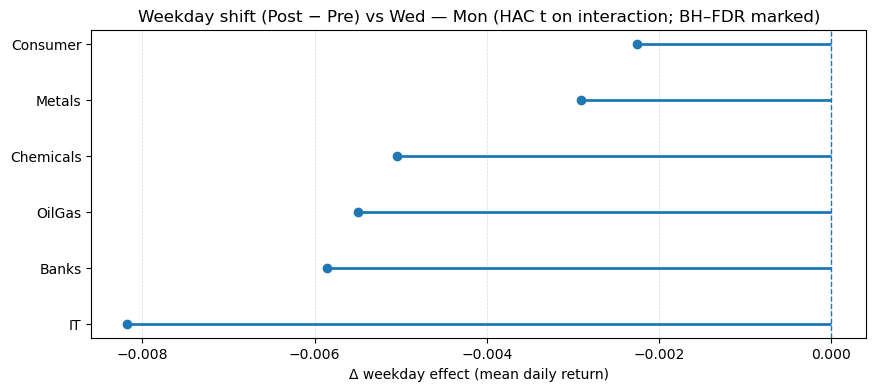

[OK] Saved /Users/lacinustunkal/Downloads/plots_calendar_anomalies/weekday_shift_Mon.png


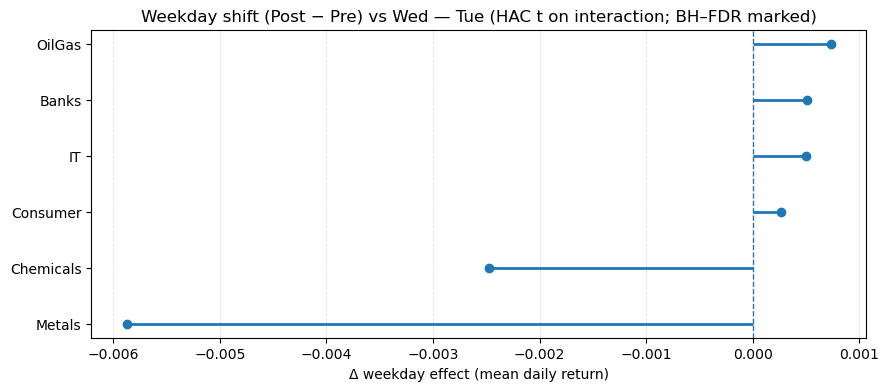

[OK] Saved /Users/lacinustunkal/Downloads/plots_calendar_anomalies/weekday_shift_Tue.png


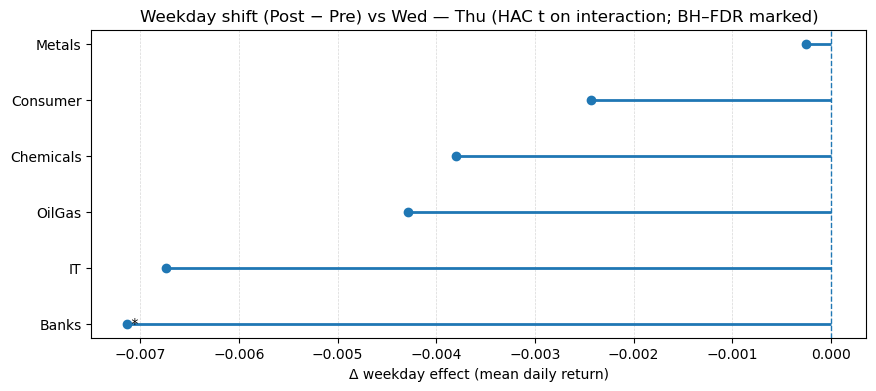

[OK] Saved /Users/lacinustunkal/Downloads/plots_calendar_anomalies/weekday_shift_Thu.png


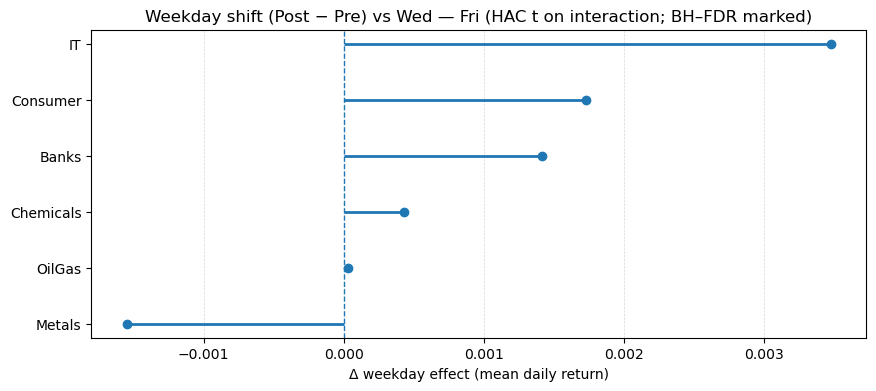

[OK] Saved /Users/lacinustunkal/Downloads/plots_calendar_anomalies/weekday_shift_Fri.png

6B complete (calendar anomalies during conflict):
 - Robust to missing weekdays, coerces all regressors to float, and drops zero-variance columns.
 - HAC (Newey–West) for daily autocorrelation; BH–FDR per weekday across sectors.


In [69]:
# 6B — Calendar anomalies during conflict (H3) — FIXED & CLEAN
# Tests whether weekday effects (Mon/Tue/Thu/Fri vs Wed) shift from pre [-60,-6]
# to post [0,+60] days around events (all events pooled), using HAC SEs + BH–FDR.

import os
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# ---------------- Paths & settings ----------------
DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEAT_PARQ = os.path.join(DOWNLOADS, "features_basic.parquet")
EVT_CSV   = os.path.join(DOWNLOADS, "events_clean_aligned.csv")

OUT_CSV   = os.path.join(DOWNLOADS, "calendar_anomalies_weekday_shift.csv")
PLOT_DIR  = os.path.join(DOWNLOADS, "plots_calendar_anomalies")
os.makedirs(PLOT_DIR, exist_ok=True)

# Windows relative to each event effective date
PRE_OFFS   = (-60, -6)   # pre window
POST_OFFS  = (0, 60)     # post window

# Inference settings
HAC_LAG       = 5        # Newey–West lag (daily)
MIN_DAYS_PRE  = 40
MIN_DAYS_POST = 40

# ---------------- Helpers ----------------
WD_MAP = {0: "Mon", 1: "Tue", 2: "Wed", 3: "Thu", 4: "Fri"}
WD_KEEP = [0, 1, 3, 4]  # Mon,Tue,Thu,Fri (Wed baseline)

def bh_fdr(pvals):
    """
    Benjamini–Hochberg FDR with proper handling of NaNs.
    Returns q-values aligned to pvals; q is monotone with p within finite set.
    """
    p = np.asarray(pvals, dtype=float)
    finite = np.isfinite(p)
    q = np.full_like(p, np.nan, dtype=float)
    if finite.sum() == 0:
        return q
    p_f = p[finite]
    m = p_f.size
    order = np.argsort(p_f)
    ranks = np.empty_like(order)
    ranks[order] = np.arange(1, m + 1)
    q_f = p_f * m / ranks
    # enforce monotonicity from largest p downward
    q_sorted_desc = np.minimum.accumulate(q_f[order[::-1]])[::-1]
    # map back to original finite positions
    q_f_mapped = np.empty_like(q_f)
    q_f_mapped[order] = q_sorted_desc
    q[finite] = np.minimum(q_f_mapped, 1.0)
    return q

def hac_weekday_shift(df_in, hac_lag=5):
    """
    df_in: DataFrame with columns ['ret','is_post'] and DatetimeIndex.
    Baseline weekday is Wednesday. Regress ret_t on:
      const + Post + WD_{Mon,Tue,Thu,Fri} + (WD_j × Post), with HAC SEs.
    Returns: (list_of_dicts_per_weekday, N_pre, N_post) or None if not estimable.
    """
    d = df_in.copy()
    d = d.dropna(subset=["ret"])
    if d.empty:
        return None

    d.index = pd.to_datetime(d.index)
    d["weekday"] = d.index.weekday
    d = d[d["weekday"].isin([0, 1, 2, 3, 4])]  # Mon..Fri only
    if d.empty:
        return None

    d["Post"] = d["is_post"].astype(int)

    if d["Post"].nunique() < 2:
        # no variation in post vs pre
        return None

    # Dummies for Mon..Fri, reindex to ensure all weekday columns exist
    wd_dum = pd.get_dummies(d["weekday"])
    wd_dum = wd_dum.reindex(columns=[0, 1, 2, 3, 4], fill_value=0).astype(float)

    # Build X with float dtype
    X = pd.DataFrame(
        {
            "const": np.ones(len(d), dtype=float),
            "Post": d["Post"].astype(float).values,
        },
        index=d.index,
    )

    for j in WD_KEEP:
        X[f"WD_{WD_MAP[j]}"] = wd_dum[j].values.astype(float)
        X[f"WD_{WD_MAP[j]}_x_Post"] = wd_dum[j].values.astype(float) * X["Post"].values

    # Drop zero-variance columns to avoid singularities
    keep_cols = [c for c in X.columns if np.nanstd(X[c].astype(float).values, ddof=0) > 0.0]
    X = X[keep_cols].astype(float)
    y = d["ret"].astype(float).values

    # Need at least 2 columns (const + something) and >10 obs
    if X.shape[1] < 2 or len(y) < 10:
        return None

    model = sm.OLS(y, X.values)
    res = model.fit(cov_type="HAC", cov_kwds={"maxlags": hac_lag})

    # Extract by name, aligned to X's column order
    params = pd.Series(res.params, index=X.columns, dtype=float)
    tvals  = pd.Series(res.tvalues, index=X.columns, dtype=float)

    alpha = float(params.get("const", np.nan))
    delta = float(params.get("Post", np.nan))

    out = []
    for j in WD_KEEP:
        b_name  = f"WD_{WD_MAP[j]}"
        bx_name = f"{b_name}_x_Post"
        gamma = float(params.get(b_name, np.nan))
        theta = float(params.get(bx_name, np.nan))
        t_th  = float(tvals.get(bx_name, np.nan))
        # p-value by position (res.pvalues follows X column ordering)
        try:
            p_th = float(res.pvalues[X.columns.get_loc(bx_name)]) if bx_name in X.columns else np.nan
        except Exception:
            p_th = np.nan

        beta_pre  = (alpha + gamma) if np.isfinite(alpha) and np.isfinite(gamma) else np.nan
        beta_post = (alpha + delta + gamma + theta) if all(np.isfinite(v) for v in [alpha, delta, gamma, theta]) else np.nan

        out.append(
            {
                "weekday": WD_MAP[j],
                "beta_pre": beta_pre,
                "beta_post": beta_post,
                "delta_beta": theta,   # shift of weekday effect vs Wed (Post − Pre)
                "t_NW": t_th,
                "p_NW": p_th,
            }
        )

    N_pre  = int((d["Post"] == 0).sum())
    N_post = int((d["Post"] == 1).sum())
    return out, N_pre, N_post

def build_mask_from_events(calendar, t0_dates, offs):
    """Return boolean Series (index=calendar) True if date in any [t0+a, t0+b] window (trading-day offsets)."""
    cal = pd.DatetimeIndex(calendar)
    mask = pd.Series(False, index=cal)
    a, b = offs
    for t0 in pd.to_datetime(t0_dates):
        pos = np.searchsorted(cal.values, np.datetime64(t0), side="left")
        i0 = max(0, pos + a)
        i1 = min(len(cal) - 1, pos + b)
        if i0 <= i1:
            mask.iloc[i0 : i1 + 1] = True
    return mask

# ---------------- Load & prepare data ----------------
df = pd.read_parquet(FEAT_PARQ).sort_values(["date", "ticker"])
df["date"] = pd.to_datetime(df["date"])
df = df[df["valid_ret"]].copy()

# Sector equal-weight daily returns
sec_daily = (
    df.groupby(["date", "sector"])["ret"]
      .mean()
      .rename("ret")
      .reset_index()
      .sort_values(["sector", "date"])
)

calendar = pd.DatetimeIndex(sorted(sec_daily["date"].unique()))

events = pd.read_csv(EVT_CSV, parse_dates=["date", "effective_date"])
t0s = events["effective_date"].dropna().unique()
if len(t0s) == 0:
    raise ValueError("No effective_date values in events file.")

pre_mask  = build_mask_from_events(calendar, t0s, PRE_OFFS)
post_mask = build_mask_from_events(calendar, t0s, POST_OFFS)
use_mask  = pre_mask | post_mask

# ---------------- Run sector-by-sector HAC regressions ----------------
rows = []
for sec, g in sec_daily.groupby("sector"):
    # Align to full trading calendar
    s = g.set_index("date").reindex(calendar)[["ret"]]
    s["is_post"] = post_mask.astype(int).values
    # Only pre/post pooled windows
    s = s[use_mask.values].dropna(subset=["ret"])

    n_pre  = int((s["is_post"] == 0).sum())
    n_post = int((s["is_post"] == 1).sum())
    if n_pre < MIN_DAYS_PRE or n_post < MIN_DAYS_POST:
        continue

    res = hac_weekday_shift(s[["ret", "is_post"]], hac_lag=HAC_LAG)
    if res is None:
        continue

    stats, Npre, Npost = res
    for dct in stats:
        rows.append(
            {
                "sector": sec,
                "weekday": dct["weekday"],
                "beta_pre": dct["beta_pre"],
                "beta_post": dct["beta_post"],
                "delta_beta": dct["delta_beta"],
                "t_NW": dct["t_NW"],
                "p_NW": dct["p_NW"],
                "N_pre": Npre,
                "N_post": Npost,
            }
        )

out = pd.DataFrame(rows).sort_values(["weekday", "sector"]).reset_index(drop=True)

# ---------------- BH–FDR by weekday across sectors (on delta_beta p-values) ----------------
out["q_BH"] = np.nan
out["sig_10pct"] = 0
out["sig_5pct"]  = 0
for wd in out["weekday"].unique():
    gi = out[out["weekday"] == wd].copy()
    q = bh_fdr(gi["p_NW"].values)
    out.loc[gi.index, "q_BH"] = q
    out.loc[gi.index, "sig_10pct"] = (q <= 0.10).astype(int)
    out.loc[gi.index, "sig_5pct"]  = (q <= 0.05).astype(int)

out.to_csv(OUT_CSV, index=False)
print(f"[OK] Saved weekday-shift results → {OUT_CSV}  (rows: {len(out):,})")

# ---------------- Optional plots ----------------
for wd in ["Mon", "Tue", "Thu", "Fri"]:
    sub = out[out["weekday"] == wd].copy().sort_values("delta_beta")
    if sub.empty:
        continue
    fig, ax = plt.subplots(figsize=(10, max(4, 0.35 * len(sub))))
    y = np.arange(len(sub))
    ax.hlines(y=y, xmin=0, xmax=sub["delta_beta"].values, linewidth=2)
    ax.plot(sub["delta_beta"].values, y, "o")
    ax.set_yticks(y)
    ax.set_yticklabels(sub["sector"].tolist())
    ax.axvline(0, linestyle="--", linewidth=1)
    ax.set_title(f"Weekday shift (Post − Pre) vs Wed — {wd} (HAC t on interaction; BH–FDR marked)")
    ax.set_xlabel("Δ weekday effect (mean daily return)")
    for i, r in sub.reset_index(drop=True).iterrows():
        star = "**" if r["sig_5pct"] == 1 else ("*" if r["sig_10pct"] == 1 else "")
        x_ = r["delta_beta"] if np.isfinite(r["delta_beta"]) else 0.0
        ax.text(x_, i, f" {star}", va="center")
    ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.5)
    outf = os.path.join(PLOT_DIR, f"weekday_shift_{wd}.png")
    fig.savefig(outf, dpi=150, bbox_inches="tight")
    plt.show(); plt.close(fig)
    print(f"[OK] Saved {outf}")

print("\n6B complete (calendar anomalies during conflict):")
print(" - Robust to missing weekdays, coerces all regressors to float, and drops zero-variance columns.")
print(" - HAC (Newey–West) for daily autocorrelation; BH–FDR per weekday across sectors.")


In [30]:
# T7A — Calendar-time (monthly) cohort portfolios and Newey–West alpha tests
# Goal: test post-event persistence without cross-sectional overstatement.
# Cohorts: all (ticker, t0) pairs that passed coverage in Step 3B.
# Holding window: months +1 … +6 after each t0 (equal-weight).
# Model: R_p,m = α + β_m * R_mkt,m  (HAC / Newey–West with maxlags=5 due to 6-month overlap)
#
# Inputs:
#   - features_basic.parquet         (daily returns, valid_ret, sector, ticker, date)
#   - market_proxy.parquet           (daily equal-weight market return "mkt_eq")
#   - events_clean_aligned.csv       (labels/types/jurisdictions/effective_date)
#   - coverage_matrix.csv            (use_for_eventstudy indicator)
# Outputs:
#   - calendar_time_portfolios.parquet   (monthly portfolio returns per event_label and ALL)
#   - calendar_time_alphas.csv           (α, t_NW, β_mkt, R2 per portfolio)
#   - calendar_time_alphas_bytype.csv    (optional: portfolios aggregated by event_type, if present)

import os, math, numpy as np, pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEAT_PARQ = os.path.join(DOWNLOADS, "features_basic.parquet")
MKT_PARQ  = os.path.join(DOWNLOADS, "market_proxy.parquet")
EV_CSV    = os.path.join(DOWNLOADS, "events_clean_aligned.csv")
COV_CSV   = os.path.join(DOWNLOADS, "coverage_matrix.csv")

OUT_PF    = os.path.join(DOWNLOADS, "calendar_time_portfolios.parquet")
OUT_ALPHA = os.path.join(DOWNLOADS, "calendar_time_alphas.csv")
OUT_ALPHA_T= os.path.join(DOWNLOADS, "calendar_time_alphas_bytype.csv")

# --------------------------
# 1) Load & prep daily data
# --------------------------
df = pd.read_parquet(FEAT_PARQ).sort_values(["ticker","date"])
df["date"] = pd.to_datetime(df["date"])
df = df[df["valid_ret"]].copy()               # only valid daily returns

mkt = pd.read_parquet(MKT_PARQ).reset_index()
mkt.columns = ["date","mkt_eq"]
mkt["date"] = pd.to_datetime(mkt["date"])

ev  = pd.read_csv(EV_CSV, parse_dates=["date","effective_date"])
cov = pd.read_csv(COV_CSV, parse_dates=["effective_date"])

# keep usable (event × ticker) pairs
use_pairs = (cov[cov["use_for_eventstudy"]]
               .merge(ev[["label","effective_date","type","jurisdiction"]],
                      left_on=["event_label","effective_date"],
                      right_on=["label","effective_date"],
                      how="left"))

# -------------------------------------
# 2) Convert to monthly ticker returns
# -------------------------------------
# Month label = month-end timestamp to align with factors
df["month"] = df["date"].dt.to_period("M").dt.to_timestamp("M")
mkt["month"] = mkt["date"].dt.to_period("M").dt.to_timestamp("M")

# compound daily → monthly per ticker: Π(1+r)−1 (ignore missing days)
mon_ret = (df.groupby(["ticker","month"])["ret"]
             .apply(lambda s: float(np.prod(1.0 + s.dropna().values) - 1.0))
             .rename("ret_m"))
# optional: quality filter: at least 10 valid daily obs in the month
mon_n   = df.groupby(["ticker","month"])["ret"].count().rename("n_days")
monthly = pd.concat([mon_ret, mon_n], axis=1).reset_index()
monthly = monthly[monthly["n_days"] >= 10].copy()

# Monthly market return (compound of daily mkt_eq)
mkt_m = (mkt.groupby("month")["mkt_eq"]
           .apply(lambda s: float(np.prod(1.0 + s.dropna().values) - 1.0))
           .rename("mkt_m")).reset_index()

# ---------------------------------------------------
# 3) Build calendar-time holdings for +1…+6 months
# ---------------------------------------------------
def month_range(start_month_end, k1=1, k2=6):
    p0 = pd.Period(start_month_end, "M")
    months = [ (p0 + k).to_timestamp("M") for k in range(k1, k2+1) ]
    return months

pairs = use_pairs[["event_label","effective_date","ticker","type"]].copy()
pairs["t0_month"] = pairs["effective_date"].dt.to_period("M").dt.to_timestamp("M")

hold_rows = []
for _, r in pairs.iterrows():
    for mm in month_range(r["t0_month"], 1, 6):
        hold_rows.append({
            "event_label": r["event_label"],
            "event_type":  r.get("type", None),
            "ticker":      r["ticker"],
            "hold_month":  mm
        })
holds = pd.DataFrame(hold_rows)
if holds.empty:
    raise ValueError("No calendar-time holdings created—check coverage_matrix.csv content.")

# ---------------------------------------------------
# 4) Merge holdings with monthly returns & form PFs
# ---------------------------------------------------
hold_ret = (holds.merge(monthly, left_on=["ticker","hold_month"],
                        right_on=["ticker","month"], how="left")
                 .drop(columns=["month"]))
hold_ret = hold_ret.dropna(subset=["ret_m"])   # require a monthly return available

# Per (event_label, month): equal-weight PF return
pf_lbl = (hold_ret.groupby(["event_label","hold_month"])
                    .agg(ret_pf=("ret_m","mean"),
                         N=("ticker","nunique"))
                    .reset_index()
                    .rename(columns={"hold_month":"month"}))

# Also ALL-events pooled portfolio
pf_all = (hold_ret.groupby(["hold_month"])
                   .agg(ret_pf=("ret_m","mean"),
                        N=("ticker","nunique"))
                   .reset_index()
                   .rename(columns={"hold_month":"month"}))
pf_all["event_label"] = "ALL"

# Optional: portfolios by event_type if available
have_types = hold_ret["event_type"].notna().any()
if have_types:
    pf_type = (hold_ret.groupby(["event_type","hold_month"])
                       .agg(ret_pf=("ret_m","mean"),
                            N=("ticker","nunique"))
                       .reset_index()
                       .rename(columns={"hold_month":"month","event_type":"portfolio"}))
    pf_type["kind"] = "by_type"

# Stack and save
pf_lbl["kind"] = "by_label"
pf_all["kind"] = "ALL"
pf_all = pf_all.rename(columns={"event_label":"portfolio"})
pf_lbl = pf_lbl.rename(columns={"event_label":"portfolio"})

portfolios = pd.concat([pf_all, pf_lbl], ignore_index=True)
if have_types:
    portfolios = pd.concat([portfolios, pf_type], ignore_index=True)

# Merge market factor
portfolios = portfolios.merge(mkt_m, on="month", how="left")
portfolios = portfolios.sort_values(["portfolio","month"]).reset_index(drop=True)

# Minimum constituent filter per month (e.g., ≥3 names)
portfolios = portfolios[portfolios["N"] >= 3].copy()

# Save monthly portfolio panel
portfolios.to_parquet(OUT_PF, engine="pyarrow", index=False)
print(f"[OK] Saved calendar-time portfolios → {OUT_PF} (rows: {len(portfolios):,})")

# ---------------------------------------------------
# 5) Newey–West alpha tests (maxlags = 5)
# ---------------------------------------------------
def nw_ols_alpha(y, x, maxlags=5):
    """
    y: Tx1 vector (portfolio returns)
    x: Tx1 vector (market returns)
    Returns: alpha, t_NW, beta, r2, T
    """
    y = np.asarray(y, float).reshape(-1,1)
    x = np.asarray(x, float).reshape(-1,1)
    T = y.shape[0]
    # X = [1, x]
    X = np.concatenate([np.ones((T,1)), x], axis=1)
    XtX = X.T @ X
    XtX_inv = np.linalg.pinv(XtX)
    beta_hat = XtX_inv @ (X.T @ y)      # (2x1)
    e = y - X @ beta_hat                # residuals Tx1

    # Newey–West HAC covariance for coefficients
    # S = Γ0 + sum_{k=1..q} w_k (Γk + Γk')
    q = min(maxlags, T-1)
    # Γ0
    S = (X * e).T @ (X * e)
    for k in range(1, q+1):
        w = 1.0 - k/(q+1.0)
        Zk = (X[k:,:] * e[k:])            # (T-k) x 2
        Z0 = (X[:-k,:] * e[:-k])          # (T-k) x 2
        Gk = Z0.T @ Zk
        S += w * (Gk + Gk.T)
    cov = XtX_inv @ S @ XtX_inv

    alpha = float(beta_hat[0,0])
    beta  = float(beta_hat[1,0])
    se_a  = float(np.sqrt(cov[0,0])) if cov[0,0]>0 else np.nan
    t_a   = alpha / se_a if (se_a is not None and se_a>0) else np.nan

    # R^2
    yhat = X @ beta_hat
    ssr = float(((yhat - y.mean())**2).sum())
    sst = float(((y - y.mean())**2).sum())
    r2  = ssr/sst if sst>0 else np.nan
    return alpha, t_a, beta, r2, T

rows = []
for key, g in portfolios.groupby("portfolio"):
    g = g.dropna(subset=["ret_pf","mkt_m"]).copy()
    if len(g) < 12:     # need at least 1 year of months
        continue
    a, t, b, r2, T = nw_ols_alpha(g["ret_pf"].values, g["mkt_m"].values, maxlags=5)
    rows.append({"portfolio": key, "T_months": int(T),
                 "alpha": a, "t_NW": t, "beta_mkt": b, "R2": r2})

alpha_tbl = pd.DataFrame(rows).sort_values("portfolio")
alpha_tbl.to_csv(OUT_ALPHA, index=False)
print(f"[OK] Saved calendar-time alphas (NW) → {OUT_ALPHA}")

# Optional: split out by event_type only (if present and saved with 'portfolio' name)
if have_types:
    rows_t = []
    for key, g in portfolios[portfolios["kind"]=="by_type"].groupby("portfolio"):
        g = g.dropna(subset=["ret_pf","mkt_m"]).copy()
        if len(g) < 12:
            continue
        a, t, b, r2, T = nw_ols_alpha(g["ret_pf"].values, g["mkt_m"].values, maxlags=5)
        rows_t.append({"event_type": key, "T_months": int(T),
                       "alpha": a, "t_NW": t, "beta_mkt": b, "R2": r2})
    if rows_t:
        pd.DataFrame(rows_t).to_csv(OUT_ALPHA_T, index=False)
        print(f"[OK] Saved alphas by event type (NW) → {OUT_ALPHA_T}")

# ------------------------
# 6) Console quick view
# ------------------------
print("\n=== Calendar-time NW alphas (top |t|) ===")
if not alpha_tbl.empty:
    for _, r in alpha_tbl.reindex(alpha_tbl["t_NW"].abs().sort_values(ascending=False).index).head(8).iterrows():
        print(f"{r['portfolio']:<20s}  T={int(r['T_months']):3d}  alpha={r['alpha']:+.004f}  t_NW={r['t_NW']:+.2f}  beta={r['beta_mkt']:+.2f}  R2={r['R2']:.2f}")
else:
    print("No portfolios with ≥12 months of data—check holdings or sample period.")

print("\nStep 7 complete (calendar-time portfolios + HAC alphas).")


[OK] Saved calendar-time portfolios → /Users/lacinustunkal/Downloads/calendar_time_portfolios.parquet (rows: 359)
[OK] Saved calendar-time alphas (NW) → /Users/lacinustunkal/Downloads/calendar_time_alphas.csv
[OK] Saved alphas by event type (NW) → /Users/lacinustunkal/Downloads/calendar_time_alphas_bytype.csv

=== Calendar-time NW alphas (top |t|) ===
Counter               T= 12  alpha=+0.0142  t_NW=+2.17  beta=+0.88  R2=0.85
War                   T= 47  alpha=+0.0055  t_NW=+1.49  beta=+0.94  R2=0.92
ALL                   T=108  alpha=+0.0036  t_NW=+1.30  beta=+0.91  R2=0.88
Sanction              T= 61  alpha=+0.0012  t_NW=+0.36  beta=+0.84  R2=0.78

Step 7 complete (calendar-time portfolios + HAC alphas).


[OK] Monthly sector returns saved → /Users/lacinustunkal/Downloads/ct_monthly_sector_returns.parquet  (rows: 325)
[OK] Monthly factor(s) saved → /Users/lacinustunkal/Downloads/ct_monthly_factors.parquet
[OK] Monthly event dummies saved → /Users/lacinustunkal/Downloads/ct_event_dummies.parquet  (shape: (325, 10))
[OK] Calendar-time regressions saved → /Users/lacinustunkal/Downloads/ct_regressions_summary.csv  (rows: 60)


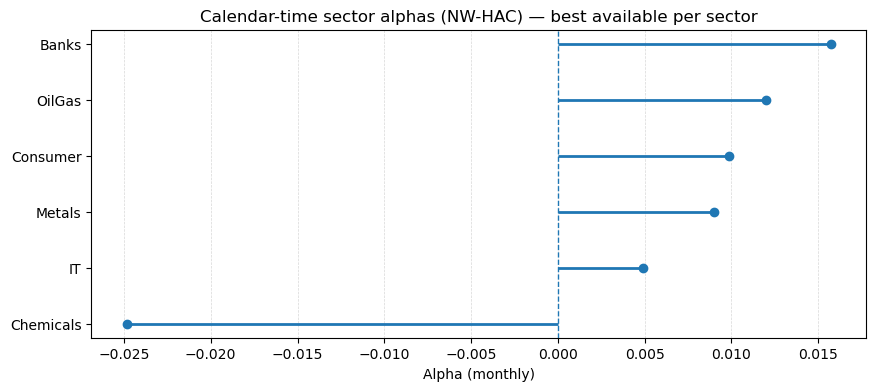

[OK] Saved /Users/lacinustunkal/Downloads/plots_ct/alpha_bars.png


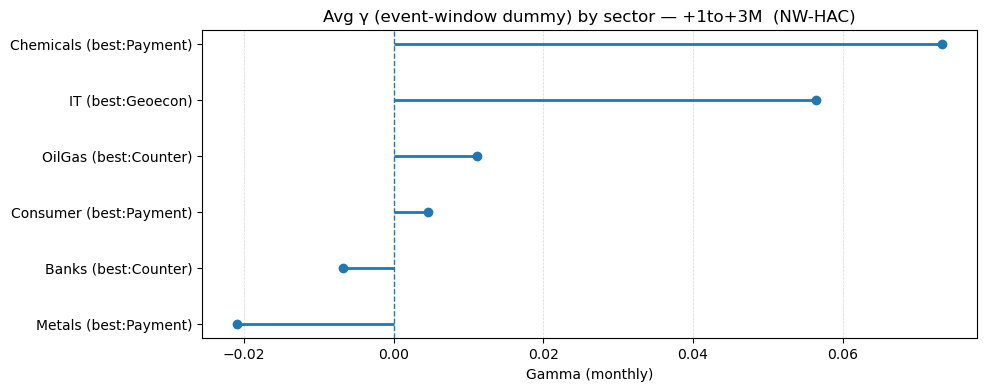

[OK] Saved /Users/lacinustunkal/Downloads/plots_ct/gamma_bars_p1top3M.png


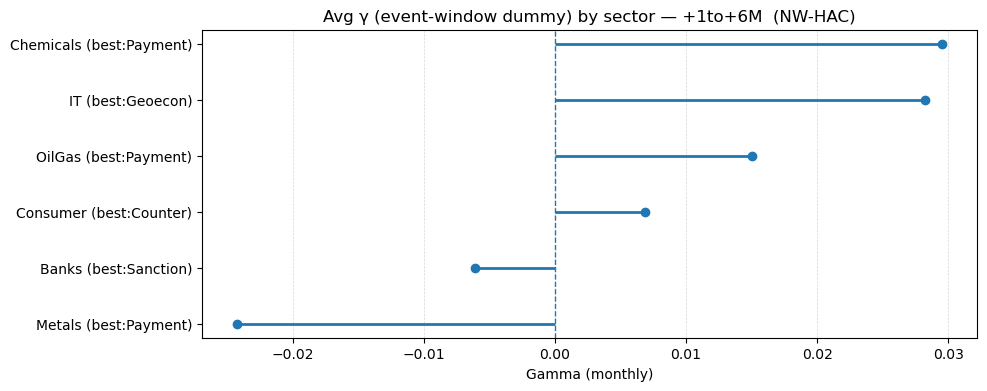

[OK] Saved /Users/lacinustunkal/Downloads/plots_ct/gamma_bars_p1top6M.png

Step 7 complete (calendar-time regressions).
Notes:
 - Applied ticker-month quality filter: ≥0 valid daily obs.
 - Returns are raw monthly (risk-free not provided). Add RF to use excess returns if you have it.
 - Dummies mark months +1..K after ANY event of a given 'type'. Refine event typing in your CSV as needed.
 - HAC lag = 6 months; tweak for sensitivity.


In [31]:
# T7B — Calendar-time portfolio regressions (monthly) with Newey–West HAC

import os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

DOWNLOADS = "/Users/lacinustunkal/Downloads"
FEAT_PARQ = os.path.join(DOWNLOADS, "features_basic.parquet")
MKT_PARQ  = os.path.join(DOWNLOADS, "market_proxy.parquet")
EVT_CSV   = os.path.join(DOWNLOADS, "events_clean_aligned.csv")

OUT_SEC_M   = os.path.join(DOWNLOADS, "ct_monthly_sector_returns.parquet")
OUT_FAC_M   = os.path.join(DOWNLOADS, "ct_monthly_factors.parquet")
OUT_DUM_M   = os.path.join(DOWNLOADS, "ct_event_dummies.parquet")
OUT_SUMMARY = os.path.join(DOWNLOADS, "ct_regressions_summary.csv")

PLOT_DIR = os.path.join(DOWNLOADS, "plots_ct")
os.makedirs(PLOT_DIR, exist_ok=True)

# -------- settings you can tweak --------
HAC_LAG = 6                    # months
WINDOWS = {"+1to+3M": (1,3), "+1to+6M": (1,6)}
MIN_OBS = 36                   # minimum months to run a regression
MIN_DAYS_PER_MONTH = 0        # NEW: quality filter for ticker-month
# ---------------------------------------

def to_month_end(dt_series):
    dt = pd.to_datetime(dt_series)
    return dt.dt.to_period("M").dt.to_timestamp("M")

def agg_daily_to_monthly_from_logret(df, date_col, group_cols, logret_col="logret"):
    """
    Aggregate daily log returns to monthly arithmetic returns:
        R_month = exp(sum(logret_day)) - 1
    Returns wide monthly DataFrame with groups as columns.
    """
    df = df.copy()
    df["month"] = to_month_end(df[date_col])
    df = df.dropna(subset=[logret_col])
    gsum = (df.groupby(group_cols + ["month"])[logret_col]
              .sum()
              .rename("logret_m")
              .reset_index())
    gsum["ret_m"] = np.expm1(gsum["logret_m"])
    if len(group_cols) == 1:
        colname = group_cols[0]
        wide = gsum.pivot(index="month", columns=colname, values="ret_m").sort_index()
    else:
        wide = gsum.pivot_table(index="month", columns=group_cols, values="ret_m").sort_index()
    return wide

def newey_west_ols(y, X, hac_lag=6):
    Xc = sm.add_constant(X, has_constant="add")
    model = sm.OLS(y, Xc)
    res = model.fit(cov_type="HAC", cov_kwds={"maxlags": hac_lag})
    return res

# --- load daily features (per stock) ---
df = pd.read_parquet(FEAT_PARQ)
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker","date"])
df = df[df["valid_ret"]].copy()  # only valid daily returns
df["month"] = to_month_end(df["date"])

# --- ticker-month returns from logret (with quality filter) ---
tkr_m = agg_daily_to_monthly_from_logret(df, "date", ["ticker"], "logret")
# per ticker-month # of valid daily obs to mask low-quality months
n_days = (df.dropna(subset=["logret"])
            .groupby(["ticker","month"])["logret"]
            .count()
            .rename("n_days")
            .reset_index()
            .pivot(index="month", columns="ticker", values="n_days")
            .reindex(tkr_m.index))
tkr_m = tkr_m.where(n_days >= MIN_DAYS_PER_MONTH)

# map ticker → sector (from features) and form sector equal-weight means
tkr_to_sector = df[["ticker","sector"]].drop_duplicates().set_index("ticker")["sector"].to_dict()
tkr_m.columns.name = "ticker"
tkr_m = tkr_m.rename(columns=tkr_to_sector)            # duplicate labels = sector names
sec_m = tkr_m.T.groupby(level=0).mean().T               # elegant EW across duplicated names
sec_m = sec_m.dropna(how="all").sort_index()
sec_m.index.name = "month"
sec_m.to_parquet(OUT_SEC_M, engine="pyarrow")
print(f"[OK] Monthly sector returns saved → {OUT_SEC_M}  (rows: {len(sec_m):,})")

# --- monthly market factor from daily mkt_eq ---
mkt = pd.read_parquet(MKT_PARQ).reset_index()
mkt.columns = ["date","mkt_eq"]
mkt["date"] = pd.to_datetime(mkt["date"])
mkt = mkt.sort_values("date").dropna(subset=["mkt_eq"])
mkt["logm"] = np.log1p(mkt["mkt_eq"])
mkt["month"] = to_month_end(mkt["date"])
mkt_m = (mkt.groupby("month")["logm"].sum().pipe(np.expm1).rename("mkt_m")).to_frame()
mkt_m.to_parquet(OUT_FAC_M, engine="pyarrow")
print(f"[OK] Monthly factor(s) saved → {OUT_FAC_M}")

# --- monthly event-type dummies ---
ev = pd.read_csv(EVT_CSV, parse_dates=["date","effective_date"]).sort_values("effective_date")
if "type" not in ev.columns:
    ev["type"] = "ALL"
months = pd.Index(sorted(sec_m.index.union(mkt_m.index))).rename("month")

dum_frames = []
etype_values = sorted(ev["type"].fillna("UNKNOWN").unique()) if not ev.empty else ["ALL"]
for etype in etype_values:
    ev_t = ev[ev["type"].fillna("UNKNOWN")==etype] if not ev.empty else pd.DataFrame(columns=ev.columns)
    ev_months = (ev_t["effective_date"].dt.to_period("M").dt.to_timestamp("M")).unique() if not ev_t.empty else []
    for tag, (a,b) in WINDOWS.items():
        d = pd.DataFrame(index=months)
        d["dummy"] = 0
        for em in ev_months:
            start = (pd.Period(em, "M") + a).to_timestamp("M")
            end   = (pd.Period(em, "M") + b).to_timestamp("M")
            d.loc[(d.index>=start) & (d.index<=end), "dummy"] = 1
        d = d.reset_index()
        d["event_type"] = etype
        d["window_tag"] = tag
        dum_frames.append(d[["month","event_type","window_tag","dummy"]])

dum_m = pd.concat(dum_frames, ignore_index=True) if dum_frames else pd.DataFrame(columns=["month","event_type","window_tag","dummy"])
dum_wide = (dum_m
            .pivot_table(index="month",
                         columns=["event_type","window_tag"],
                         values="dummy",
                         aggfunc="max",
                         fill_value=0)
            .sort_index())
dum_wide = dum_wide.astype(int) if not dum_wide.empty else pd.DataFrame(index=months)
dum_wide.to_parquet(OUT_DUM_M, engine="pyarrow")
print(f"[OK] Monthly event dummies saved → {OUT_DUM_M}  (shape: {dum_wide.shape})")

# --- panel and regressions ---
panel = sec_m.join(mkt_m, how="inner").sort_index()

rows = []
sectors = list(sec_m.columns)
multi_cols = dum_wide.columns if isinstance(dum_wide.columns, pd.MultiIndex) else pd.MultiIndex.from_tuples([])

for sec in sectors:
    y = panel[sec].rename("ret")
    if len(multi_cols) == 0:
        X = panel[["mkt_m"]].dropna()
        Y = y.reindex(X.index).dropna()
        X = X.loc[Y.index]
        if len(Y) >= MIN_OBS:
            res = newey_west_ols(Y, X, hac_lag=HAC_LAG)
            params = res.params.reindex(["const","mkt_m"])
            bse    = res.bse.reindex(["const","mkt_m"])
            tvals  = params / bse
            rows.append({
                "sector": sec, "event_type": "NONE", "window_tag": "NONE",
                "T": int(res.nobs),
                "alpha": float(params["const"]), "t_alpha": float(tvals["const"]),
                "beta_mkt": float(params["mkt_m"]), "t_beta_mkt": float(tvals["mkt_m"]),
                "gamma_D": np.nan, "t_gamma_D": np.nan,
                "R2_adj": float(res.rsquared_adj)
            })
        continue

    for (etype, tag) in multi_cols:
        D = dum_wide[(etype, tag)].reindex(panel.index).fillna(0).astype(float).rename("D")
        X = pd.concat([panel["mkt_m"], D], axis=1).dropna()
        Y = y.reindex(X.index).dropna()
        X = X.loc[Y.index]
        if len(Y) < MIN_OBS:
            continue
        try:
            res = newey_west_ols(Y, X, hac_lag=HAC_LAG)
            params = res.params.reindex(["const","mkt_m","D"])
            bse    = res.bse.reindex(["const","mkt_m","D"])
            tvals  = params / bse
            rows.append({
                "sector": sec,
                "event_type": etype,
                "window_tag": tag,
                "T": int(res.nobs),
                "alpha": float(params["const"]),
                "t_alpha": float(tvals["const"]),
                "beta_mkt": float(params["mkt_m"]),
                "t_beta_mkt": float(tvals["mkt_m"]),
                "gamma_D": float(params["D"]),
                "t_gamma_D": float(tvals["D"]),
                "R2_adj": float(res.rsquared_adj)
            })
        except Exception:
            continue

summ = pd.DataFrame(rows).sort_values(["window_tag","event_type","sector"]) if rows else pd.DataFrame(columns=[
    "sector","event_type","window_tag","T","alpha","t_alpha","beta_mkt","t_beta_mkt","gamma_D","t_gamma_D","R2_adj"
])
summ.to_csv(OUT_SUMMARY, index=False)
print(f"[OK] Calendar-time regressions saved → {OUT_SUMMARY}  (rows: {len(summ):,})")

# --- quick plots ---
if not summ.empty:
    # 1) Alpha bars (pick run with largest T per sector)
    pick_alpha = (summ.sort_values(["sector","T"], ascending=[True, False])
                       .groupby("sector").head(1)
                       .sort_values("alpha"))
    if not pick_alpha.empty:
        fig, ax = plt.subplots(figsize=(10, max(4, 0.35*len(pick_alpha))))
        ax.hlines(y=range(len(pick_alpha)), xmin=0, xmax=pick_alpha["alpha"].values, linewidth=2)
        ax.plot(pick_alpha["alpha"].values, range(len(pick_alpha)), "o")
        ax.set_yticks(range(len(pick_alpha)))
        ax.set_yticklabels(pick_alpha["sector"].tolist())
        ax.axvline(0, linestyle="--", linewidth=1)
        ax.set_title("Calendar-time sector alphas (NW-HAC) — best available per sector")
        ax.set_xlabel("Alpha (monthly)")
        ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.5)
        out1 = os.path.join(PLOT_DIR, "alpha_bars.png")
        fig.savefig(out1, dpi=150, bbox_inches="tight")
        plt.show(); plt.close(fig)
        print(f"[OK] Saved {out1}")

    # 2) Gamma bars per window_tag (avg across types; annotate type with largest |t_gamma|)
    for tag in sorted(summ["window_tag"].dropna().unique()):
        ss = summ[summ["window_tag"]==tag].copy()
        if ss.empty:
            continue
        best_type_by_sector = (ss.loc[ss.groupby("sector")["t_gamma_D"].apply(lambda s: s.abs().idxmax())]
                                 .set_index("sector")["event_type"])
        g_agg = (ss.groupby("sector")["gamma_D"].mean().rename("gamma_mean").reset_index())
        g_agg["best_type"] = g_agg["sector"].map(best_type_by_sector).fillna("NA")
        g_agg = g_agg.sort_values("gamma_mean")

        fig, ax = plt.subplots(figsize=(10, max(4, 0.35*len(g_agg))))
        ax.hlines(y=range(len(g_agg)), xmin=0, xmax=g_agg["gamma_mean"].values, linewidth=2)
        ax.plot(g_agg["gamma_mean"].values, range(len(g_agg)), "o")
        ax.set_yticks(range(len(g_agg)))
        ax.set_yticklabels([f"{s} (best:{t})" for s,t in zip(g_agg["sector"], g_agg["best_type"])])
        ax.axvline(0, linestyle="--", linewidth=1)
        ax.set_title(f"Avg γ (event-window dummy) by sector — {tag}  (NW-HAC)")
        ax.set_xlabel("Gamma (monthly)")
        ax.grid(True, axis="x", linestyle="--", linewidth=0.5, alpha=0.5)
        out2 = os.path.join(PLOT_DIR, f"gamma_bars_{tag.replace('+','p')}.png")
        fig.savefig(out2, dpi=150, bbox_inches="tight")
        plt.show(); plt.close(fig)
        print(f"[OK] Saved {out2}")

print("\nStep 7 complete (calendar-time regressions).")
print("Notes:")
print(f" - Applied ticker-month quality filter: ≥{MIN_DAYS_PER_MONTH} valid daily obs.")
print(" - Returns are raw monthly (risk-free not provided). Add RF to use excess returns if you have it.")
print(" - Dummies mark months +1..K after ANY event of a given 'type'. Refine event typing in your CSV as needed.")
print(f" - HAC lag = {HAC_LAG} months; tweak for sensitivity.")


[Info] Sector series: ['Banks', 'Chemicals', 'Consumer', 'IT', 'Metals', 'OilGas'] | rows available: 4,328
[OK] Saved TCI → /Users/lacinustunkal/Downloads/connectedness_total.csv  (rows: 4,079)
[OK] Saved directional connectedness → /Users/lacinustunkal/Downloads/connectedness_directional.csv  (rows: 24,474)
[OK] Saved last-window FEVD matrix (2025-07-23) → /Users/lacinustunkal/Downloads/connectedness_matrix_last.csv


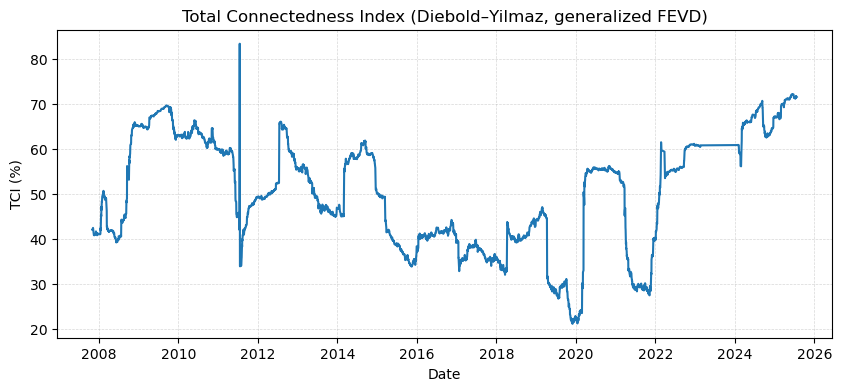

[OK] Saved /Users/lacinustunkal/Downloads/plots_connectedness/tci.png


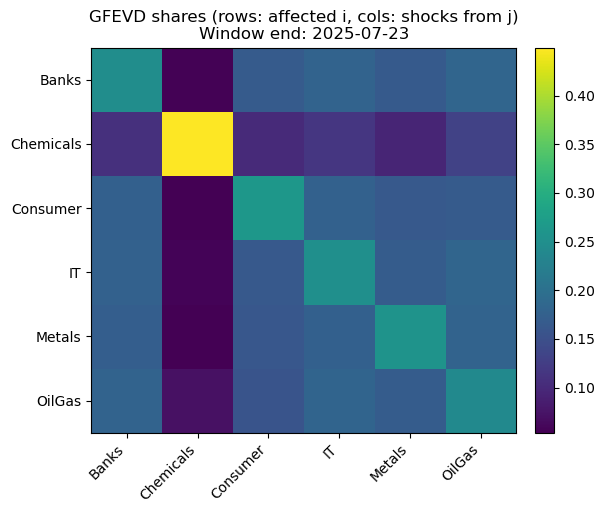

[OK] Saved /Users/lacinustunkal/Downloads/plots_connectedness/heatmap_last.png

Step 10A complete (rolling connectedness). Notes:
 - Uses generalized FEVD (order-invariant).
 - Window length = 250, horizon H = 10, VAR lag selected up to 5 by AIC.
 - Outputs TCI over time and directional To/From/Net per sector.


In [32]:
# T10A — Rolling Diebold–Yilmaz connectedness (generalized FEVD) using sector equal-weight returns
# Inputs:
#   - sector_returns.parquet  (from Step 2B-2; wide: date × sector columns, values = daily equal-weight returns)
# Outputs:
#   - connectedness_total.csv        (date, TCI)
#   - connectedness_directional.csv  (date, sector, to, from, net)
#   - connectedness_matrix_last.csv  (N×N GFEVD shares for the last window end date)
#   - plots_connectedness/tci.png, heatmap_last.png

import os, math, numpy as np, pandas as pd
import matplotlib.pyplot as plt

from statsmodels.tsa.api import VAR

DOWNLOADS   = "/Users/lacinustunkal/Downloads"
SECR_PARQ   = os.path.join(DOWNLOADS, "sector_returns.parquet")

OUT_TCI     = os.path.join(DOWNLOADS, "connectedness_total.csv")
OUT_DIR     = os.path.join(DOWNLOADS, "connectedness_directional.csv")
OUT_MTX     = os.path.join(DOWNLOADS, "connectedness_matrix_last.csv")
PLOT_DIR    = os.path.join(DOWNLOADS, "plots_connectedness")
os.makedirs(PLOT_DIR, exist_ok=True)

# --- settings (tweakable) ---
ROLL_WINDOW = 250        # trading days in each VAR estimation window
HORIZON     = 10         # GFEVD forecast horizon H
MAX_LAG     = 5          # VAR lag order search upper bound
MIN_OBS     = 220        # minimum obs to attempt a window (defensive)

# --- load sector equal-weight returns ---
secr = pd.read_parquet(SECR_PARQ).reset_index()
# Expect columns: date + sector names
if "date" not in secr.columns:
    # sometimes parquet index comes back unnamed: fix
    secr = secr.rename(columns={secr.columns[0]: "date"})
secr["date"] = pd.to_datetime(secr["date"])
secr = secr.sort_values("date")

# keep only numeric sector columns
sector_cols = [c for c in secr.columns if c != "date"]
if not sector_cols:
    raise ValueError("No sector columns found in sector_returns.parquet.")
Y = secr.dropna(subset=sector_cols).copy()      # drop rows with any sector NaN for stability
Y = Y.set_index("date")
Y = Y.astype(float)

print(f"[Info] Sector series: {sector_cols} | rows available: {len(Y):,}")

# --- helpers: MA(∞) up to H and generalized FEVD per Diebold–Yilmaz (2012) ---
def ma_coeffs_from_var(A_list, H, k):
    """
    Build MA coefficient matrices Psi_h for h=0..H-1 from VAR(p) coefficient list [A1..Ap], Ai shape (k,k).
    """
    Psi = [np.eye(k)]
    p = len(A_list)
    for h in range(1, H):
        acc = np.zeros((k, k))
        for i in range(1, min(p, h) + 1):
            acc += Psi[h - i] @ A_list[i - 1]
        Psi.append(acc)
    return Psi  # list length H

def gfevd_from_var(A_list, Sigma_u, H):
    """
    Generalized (Pesaran–Shin) FEVD shares matrix (k×k), rows normalized to sum to 1.
    A_list: [A1..Ap] VAR coefficient matrices (k×k)
    Sigma_u: VAR residual covariance (k×k)
    H: horizon
    """
    k = Sigma_u.shape[0]
    Psi = ma_coeffs_from_var(A_list, H, k)  # Psi[0..H-1]
    # denominator for each i: sum_{h=0}^{H-1} e_i' Psi_h Σ Psi_h' e_i
    den = np.zeros(k)
    for h in range(H):
        M = Psi[h] @ Sigma_u @ Psi[h].T
        den += np.diag(M)
    # numerator for (i,j): sum_{h=0}^{H-1} (e_i' Psi_h Σ e_j)^2 / σ_jj
    sigma_diag = np.diag(Sigma_u)
    out = np.zeros((k, k))
    for i in range(k):
        for j in range(k):
            num = 0.0
            for h in range(H):
                v = (Psi[h] @ Sigma_u)[:, j]   # column j of Psi_h Σ
                num += (v[i] ** 2)
            out[i, j] = num / (sigma_diag[j] if sigma_diag[j] > 0 else np.nan)
    # row normalize to sum to 1 (guard NaNs)
    row_sums = out.sum(axis=1, keepdims=True)
    with np.errstate(invalid="ignore", divide="ignore"):
        shares = np.divide(out, row_sums, where=np.isfinite(row_sums))
    # If any row all-nan or zero, fall back to identity contribution
    for i in range(k):
        if not np.isfinite(shares[i]).any() or np.nansum(shares[i]) <= 0:
            shares[i, :] = 0.0
            shares[i, i] = 1.0
    return shares

# --- rolling VAR → GFEVD → connectedness ---
dates = Y.index.to_list()
k = len(sector_cols)

tci_rows, dir_rows = [], []
last_matrix = None
last_date   = None

for end in range(ROLL_WINDOW, len(Y) + 1):
    window = Y.iloc[end - ROLL_WINDOW:end, :]
    if window.shape[0] < MIN_OBS:
        continue
    # choose VAR lag by AIC within [1..MAX_LAG]
    best_p = 1
    try:
        sel = VAR(window.values).select_order(MAX_LAG)
        if getattr(sel, "aic", None) is not None:
            # statsmodels returns dict-like with criteria; find min over available lags
            best_p = int(np.nanargmin([np.inf] + sel.aic[1:MAX_LAG+1]))
            if best_p < 1: best_p = 1
    except Exception:
        best_p = 1

    try:
        model = VAR(window.values)
        res = model.fit(best_p)
        # collect Ai (shape k×k) with sign convention: statsmodels returns with .coefs (p×k×k)
        A_list = [res.coefs[i, :, :] for i in range(res.k_ar)]   # A1..Ap
        Sigma_u = res.sigma_u                                     # k×k
        shares = gfevd_from_var(A_list, Sigma_u, HORIZON)         # k×k

        # Total Connectedness Index (TCI): off-diagonal share sum / k
        off = shares.copy()
        np.fill_diagonal(off, 0.0)
        tci = 100.0 * off.sum() / k

        # Directional To/From/Net
        to_i   = 100.0 * off.sum(axis=1)         # row sums excluding own
        from_i = 100.0 * off.sum(axis=0)         # col sums excluding own
        net_i  = to_i - from_i

        t_end = window.index[-1]
        tci_rows.append({"date": t_end, "TCI": tci})

        for idx, sec in enumerate(sector_cols):
            dir_rows.append({
                "date": t_end, "sector": sec,
                "to": float(to_i[idx]), "from": float(from_i[idx]), "net": float(net_i[idx])
            })

        # remember last matrix for a heatmap
        last_matrix = shares
        last_date   = t_end

    except Exception as e:
        # skip unstable windows (near singularities)
        # print(f"[WARN] Window ending {window.index[-1].date()}: {e}")
        continue

# --- save outputs ---
tci_df = pd.DataFrame(tci_rows).sort_values("date")
dir_df = pd.DataFrame(dir_rows).sort_values(["date","sector"])

tci_df.to_csv(OUT_TCI, index=False)
dir_df.to_csv(OUT_DIR, index=False)
print(f"[OK] Saved TCI → {OUT_TCI}  (rows: {len(tci_df):,})")
print(f"[OK] Saved directional connectedness → {OUT_DIR}  (rows: {len(dir_df):,})")

if last_matrix is not None:
    mdf = pd.DataFrame(last_matrix, index=sector_cols, columns=sector_cols)
    mdf.to_csv(OUT_MTX, float_format="%.6f")
    print(f"[OK] Saved last-window FEVD matrix ({last_date.date()}) → {OUT_MTX}")

# --- quick plots ---
# 1) TCI time series
if not tci_df.empty:
    fig, ax = plt.subplots(figsize=(10,4))
    ax.plot(tci_df["date"], tci_df["TCI"])
    ax.set_title("Total Connectedness Index (Diebold–Yilmaz, generalized FEVD)")
    ax.set_ylabel("TCI (%)"); ax.set_xlabel("Date")
    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
    out1 = os.path.join(PLOT_DIR, "tci.png")
    fig.savefig(out1, dpi=150, bbox_inches="tight")
    plt.show(); plt.close(fig)
    print(f"[OK] Saved {out1}")

# 2) Heatmap for last window
if last_matrix is not None:
    fig, ax = plt.subplots(figsize=(6,5))
    im = ax.imshow(last_matrix, aspect="auto", origin="upper")
    ax.set_xticks(range(k)); ax.set_xticklabels(sector_cols, rotation=45, ha="right")
    ax.set_yticks(range(k)); ax.set_yticklabels(sector_cols)
    ax.set_title(f"GFEVD shares (rows: affected i, cols: shocks from j)\nWindow end: {last_date.date()}")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    out2 = os.path.join(PLOT_DIR, "heatmap_last.png")
    fig.savefig(out2, dpi=150, bbox_inches="tight")
    plt.show(); plt.close(fig)
    print(f"[OK] Saved {out2}")

print("\nStep 10A complete (rolling connectedness). Notes:")
print(" - Uses generalized FEVD (order-invariant).")
print(" - Window length = %d, horizon H = %d, VAR lag selected up to %d by AIC." % (ROLL_WINDOW, HORIZON, MAX_LAG))
print(" - Outputs TCI over time and directional To/From/Net per sector.")

[OK] Saved monthly context panel → /Users/lacinustunkal/Downloads/context_monthly_panel.csv (rows: 203)
[OK] Saved correlations → /Users/lacinustunkal/Downloads/context_correlations.csv

Correlations (overlap, Pearson):
  TCI_m vs GPR              N=203  r=+0.122
  TCI_m vs EPU              N=203  r=+0.032
  events_per_month vs GPR   N=203  r=+0.417
  events_per_month vs EPU   N=203  r=+0.137


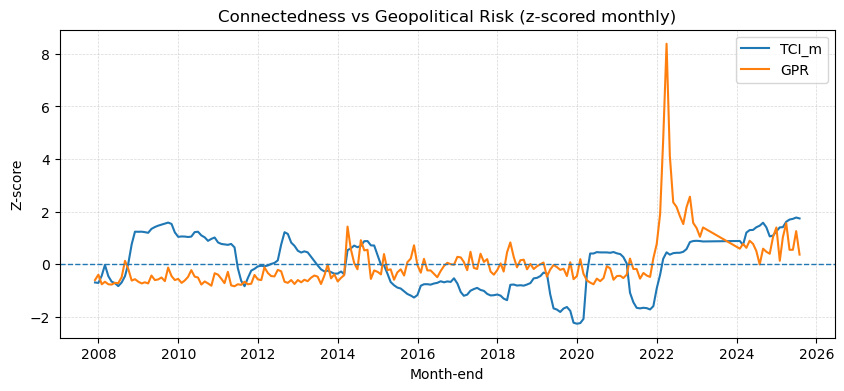

[OK] Saved /Users/lacinustunkal/Downloads/plots_context/gpr_tci.png


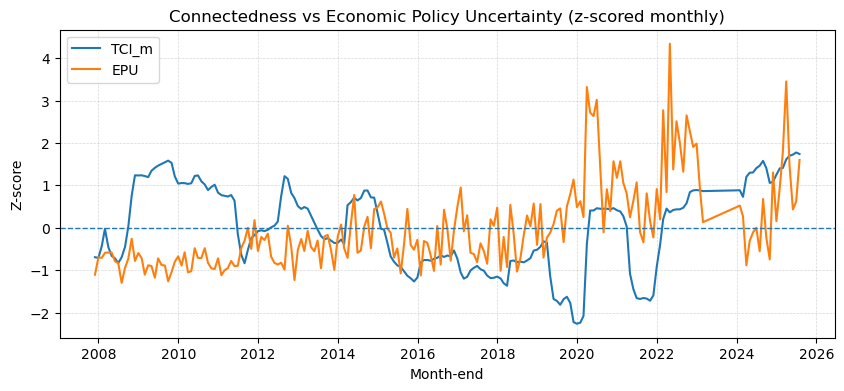

[OK] Saved /Users/lacinustunkal/Downloads/plots_context/epu_tci.png


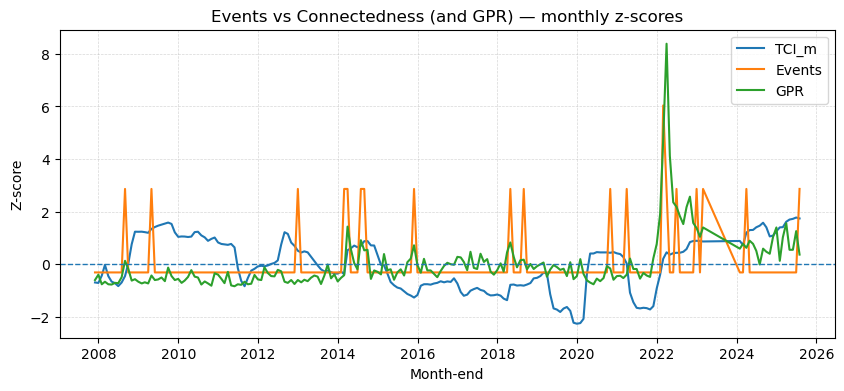

[OK] Saved /Users/lacinustunkal/Downloads/plots_context/events_gpr_tci.png

Step 11 complete (context indices).
If you need help fetching/formatting GPR/EPU CSVs, drop the files into Downloads and re-run.


In [33]:
# T11A — Context indices (GPR/EPU) vs MOEX connectedness & event activity
# What it does:
#   • Loads monthly GPR and EPU CSVs (if available)
#   • Aggregates your daily TCI (from Step 10) to monthly means
#   • Counts events per month from events_clean_aligned.csv (fills missing with 0)
#   • Standardizes series (z-scores), computes correlations, and plots overlays

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DOWNLOADS   = "/Users/lacinustunkal/Downloads"
# --- edit these two lines to your actual files if needed ---
GPR_CSV     = os.path.join(DOWNLOADS, "GPR.csv")     # e.g., from matteoiacoviello.com
EPU_CSV     = os.path.join(DOWNLOADS, "EPU.csv")     # e.g., from policyuncertainty.com

TCI_CSV     = os.path.join(DOWNLOADS, "connectedness_total.csv")
EVENTS_CSV  = os.path.join(DOWNLOADS, "events_clean_aligned.csv")

OUT_PANEL   = os.path.join(DOWNLOADS, "context_monthly_panel.csv")
OUT_CORR    = os.path.join(DOWNLOADS, "context_correlations.csv")
PLOT_DIR    = os.path.join(DOWNLOADS, "plots_context")
os.makedirs(PLOT_DIR, exist_ok=True)

# ---------- helpers ----------
def _to_month_end(s):
    s = pd.to_datetime(s)
    return s.dt.to_period("M").dt.to_timestamp("M")

def _parse_month_column(raw):
    """
    Robust parser for monthly columns that may be:
    - datetime-like
    - strings like 'YYYY-MM' or 'YYYY/MM'
    - integers YYYYMM (e.g., 201402)
    Returns pandas Series of month-end timestamps.
    """
    s = raw.copy()
    # if numeric-looking, try YYYYMM
    if pd.api.types.is_numeric_dtype(s):
        s = s.astype("Int64").astype(str)
        # pad possible shorter forms (e.g., 20141 -> 201401)
        s = s.str.zfill(6)
        dt = pd.to_datetime(s, format="%Y%m", errors="coerce")
        if dt.notna().any():
            return _to_month_end(dt)
    # generic parse as fallback
    dt = pd.to_datetime(s, errors="coerce")
    return _to_month_end(dt)

def load_monthly_series(path, value_names):
    """
    Try to read a monthly index (GPR/EPU).
    Accepts wide or narrow; tries common column names.
    Returns DataFrame with ['month', 'value'].
    """
    df = pd.read_csv(path)

    # find date-like column
    cand_date = [c for c in df.columns if c.lower() in ("date", "month", "time", "period")]
    if not cand_date:
        cand_date = [df.columns[0]]
    dcol = cand_date[0]
    df["month"] = _parse_month_column(df[dcol])

    # find value column
    cand_val = [c for c in df.columns if c.lower() in value_names]
    if not cand_val:
        # fallback: last numeric column
        num = [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c])]
        if not num:
            raise ValueError(f"Could not find numeric value column in {os.path.basename(path)}.")
        vcol = num[-1]
    else:
        vcol = cand_val[0]

    out = df[["month", vcol]].rename(columns={vcol: "value"}).dropna(subset=["month"])
    # if higher freq slipped in, aggregate to monthly mean
    out = out.groupby("month", as_index=False)["value"].mean().sort_values("month")
    return out

def zscore(x):
    x = x.astype(float)
    mu, sd = x.mean(), x.std(ddof=1)
    return (x - mu) / sd if (sd is not None and np.isfinite(sd) and sd > 0) else pd.Series(np.nan, index=x.index)

# ---------- load TCI and make monthly ----------
if not os.path.isfile(TCI_CSV):
    raise FileNotFoundError(f"{TCI_CSV} not found. Run Step 10A first.")

tci = pd.read_csv(TCI_CSV, parse_dates=["date"])
tci["month"] = _to_month_end(tci["date"])
tci_m = (tci.groupby("month")["TCI"].mean().rename("TCI_m").reset_index())

# ---------- monthly event counts ----------
if not os.path.isfile(EVENTS_CSV):
    raise FileNotFoundError(f"{EVENTS_CSV} not found. Run Step 3A first.")

ev = pd.read_csv(EVENTS_CSV, parse_dates=["date","effective_date"])
ev["month"] = _to_month_end(ev["effective_date"])
ev_m = (ev.groupby("month")["label"].count().rename("events_per_month").reset_index())

# ---------- load GPR / EPU if present ----------
has_gpr = os.path.isfile(GPR_CSV)
has_epu = os.path.isfile(EPU_CSV)

gpr = None; epu = None
if has_gpr:
    try:
        gpr = load_monthly_series(GPR_CSV, value_names=("gpr","gpr_index","value"))
    except Exception as e:
        print(f"[WARN] Could not parse GPR file: {e}")
        has_gpr = False
if has_epu:
    try:
        epu = load_monthly_series(EPU_CSV, value_names=("epu","epu_index","value"))
    except Exception as e:
        print(f"[WARN] Could not parse EPU file: {e}")
        has_epu = False

# ---------- merge panel (anchor on TCI months) ----------
panel = tci_m.merge(ev_m, on="month", how="left")
# fill months with zero events rather than NaN
panel["events_per_month"] = panel["events_per_month"].fillna(0).astype(int)

if has_gpr:
    panel = panel.merge(gpr.rename(columns={"value":"GPR"}), on="month", how="left")
if has_epu:
    panel = panel.merge(epu.rename(columns={"value":"EPU"}), on="month", how="left")

panel = panel.sort_values("month").reset_index(drop=True)
panel.to_csv(OUT_PANEL, index=False)
print(f"[OK] Saved monthly context panel → {OUT_PANEL} (rows: {len(panel):,})")

# ---------- correlations over overlapping sample ----------
corr_rows = []
def add_corr(a_name, b_name):
    if a_name in panel.columns and b_name in panel.columns:
        sub = panel[[a_name, b_name]].dropna()
        if len(sub) >= 12:
            r = float(np.corrcoef(sub[a_name], sub[b_name])[0,1])
            corr_rows.append({"pair": f"{a_name} vs {b_name}", "N": len(sub), "corr": r})

add_corr("TCI_m", "GPR")
add_corr("TCI_m", "EPU")
add_corr("events_per_month", "GPR")
add_corr("events_per_month", "EPU")
corr_df = pd.DataFrame(corr_rows)
corr_df.to_csv(OUT_CORR, index=False)
print(f"[OK] Saved correlations → {OUT_CORR}")
if not corr_df.empty:
    print("\nCorrelations (overlap, Pearson):")
    for _, r in corr_df.iterrows():
        print(f"  {r['pair']:<24s}  N={int(r['N']):3d}  r={r['corr']:+.3f}")

# ---------- plots (z-scored overlays) ----------
def overlay_plot(series_dict, title, outfile):
    df = pd.DataFrame(series_dict).dropna()
    if df.empty:
        print(f"[WARN] Not enough overlap to plot {outfile}.")
        return
    zdf = df.apply(zscore)
    fig, ax = plt.subplots(figsize=(10,4))
    for col in zdf.columns:
        ax.plot(zdf.index, zdf[col], label=col)
    ax.axhline(0, linestyle="--", linewidth=1)
    ax.set_title(title)
    ax.set_xlabel("Month-end")
    ax.set_ylabel("Z-score")
    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
    ax.legend()
    fig.savefig(outfile, dpi=150, bbox_inches="tight")
    plt.show(); plt.close(fig)
    print(f"[OK] Saved {outfile}")

s = panel.set_index("month")

# 1) TCI vs GPR
if has_gpr and "GPR" in s.columns:
    overlay_plot({"TCI_m": s["TCI_m"], "GPR": s["GPR"]},
                 "Connectedness vs Geopolitical Risk (z-scored monthly)",
                 os.path.join(PLOT_DIR, "gpr_tci.png"))

# 2) TCI vs EPU
if has_epu and "EPU" in s.columns:
    overlay_plot({"TCI_m": s["TCI_m"], "EPU": s["EPU"]},
                 "Connectedness vs Economic Policy Uncertainty (z-scored monthly)",
                 os.path.join(PLOT_DIR, "epu_tci.png"))

# 3) Events per month + TCI (+ GPR if available), normalized
series = {"TCI_m": s["TCI_m"], "Events": s["events_per_month"]}
if has_gpr and "GPR" in s.columns and s["GPR"].notna().any():
    series["GPR"] = s["GPR"]
overlay_plot(series, "Events vs Connectedness (and GPR) — monthly z-scores",
             os.path.join(PLOT_DIR, "events_gpr_tci.png"))

print("\nStep 11 complete (context indices).")
print("If you need help fetching/formatting GPR/EPU CSVs, drop the files into Downloads and re-run.")


In [34]:
# T12A — Romano–Wolf step-down (FWER-robust) on date-clustered sector CARs
# Uses the date-clustered means from Step 6 (T6A) and adjusts
# sector-level tests per window ∈ {ev_-5_+5, ev_0_+3, ev_0_+10}.
#
# Inputs:
#   - clustered_sector_CAR_means.csv  (from Step 6)
# Outputs:
#   - rw_stepdown_results_ev_-5_+5.csv
#   - rw_stepdown_results_ev_0_+3.csv
#   - rw_stepdown_results_ev_0_+10.csv
#   - rw_stepdown_overview.csv        (all windows stacked)

import os, math, numpy as np, pandas as pd

DOWNLOADS = "/Users/lacinustunkal/Downloads"
IN_MEANS  = os.path.join(DOWNLOADS, "clustered_sector_CAR_means.csv")

OUT_ALL   = os.path.join(DOWNLOADS, "rw_stepdown_overview.csv")
OUT_PER   = {
    "ev_-5_+5":  os.path.join(DOWNLOADS, "rw_stepdown_results_ev_-5_+5.csv"),
    "ev_0_+3":   os.path.join(DOWNLOADS, "rw_stepdown_results_ev_0_+3.csv"),
    "ev_0_+10":  os.path.join(DOWNLOADS, "rw_stepdown_results_ev_0_+10.csv"),
}

# RW settings
B = 2000               # bootstrap reps (increase if you want tighter precision)
RANDOM_SEED = 12345
np.random.seed(RANDOM_SEED)

if not os.path.isfile(IN_MEANS):
    raise FileNotFoundError(f"{IN_MEANS} not found. Run Step 6 (T6A) first.")

clus = pd.read_csv(IN_MEANS, parse_dates=["t0"])
# Expect columns: event_label, t0, window, sector, CAAR_cluster, N_tickers
req_cols = {"event_label","t0","window","sector","CAAR_cluster"}
missing = req_cols - set(clus.columns)
if missing:
    raise ValueError(f"Missing columns in clustered means: {missing}")

# Helper: compute observed t per sector (date-clustered)
def observed_t(df):
    # df: rows = date×sector observations for one window & sector (one per (event_label, t0))
    x = df["CAAR_cluster"].dropna().values
    n = len(x)
    mean = float(np.mean(x)) if n>0 else np.nan
    sd   = float(np.std(x, ddof=1)) if n>1 else np.nan
    tval = mean / (sd/np.sqrt(n)) if (n>1 and sd>0) else np.nan
    return n, mean, sd, tval

def romano_wolf_stepdown(matrix, dates, sectors, B=1000, seed=12345):
    """
    matrix: DataFrame indexed by date (cluster), columns = sectors, values = CAAR_cluster
    Returns DataFrame with observed t, RW p_adj (step-down), monotone p's, and flags.
    """
    # drop sectors with all-NaN a bit earlier if you want
    mat = matrix.loc[:, matrix.notna().any(axis=0)].copy()
    sectors = list(mat.columns)

    # observed t per sector (date-clustered)
    obs = {}
    for sec in sectors:
        col = mat[sec].dropna()
        n = len(col)
        if n <= 1 or float(col.std(ddof=1)) == 0.0:
            obs[sec] = {"t": np.nan, "n": n}
        else:
            obs[sec] = {"t": float(col.mean() / (col.std(ddof=1) / np.sqrt(n))), "n": n}

    # keep only finite-t sectors in the step-down
    finite_secs = [s for s in sectors if np.isfinite(obs[s]["t"])]
    if not finite_secs:
        return pd.DataFrame(columns=["sector","rank_by_abs_t","t_obs","n_dates","p_RW","p_RW_monotone","sig_10pct","sig_5pct"])

    # order by |t| desc
    order = sorted(finite_secs, key=lambda s: abs(obs[s]["t"]), reverse=True)

    # center each sector to impose H0, but keep masks to respect missingness
    mu = mat.mean(axis=0, skipna=True)                     # per-column mean on available dates
    X_center = mat.subtract(mu, axis=1)                    # keep NaNs
    masks = {s: X_center[s].notna().values for s in order} # bool masks per sector
    X_center = X_center.fillna(0.0).values                 # (D x m) with zeros where missing
    D = X_center.shape[0]

    rng = np.random.default_rng(seed)
    p_adj = {sec: np.nan for sec in order}
    remaining = order.copy()

    for _step in range(len(order)):
        cols_idx = [list(mat.columns).index(sec) for sec in remaining]
        # bootstrap max |t*| over remaining sectors
        max_stats = np.empty(B, dtype=float)
        for b in range(B):
            signs = rng.choice([-1.0, 1.0], size=D)                    # flip by date (cluster)
            Xb = (X_center * signs[:, None])[:, cols_idx]              # (D x r)
            tb = []
            for j, sec in enumerate(remaining):
                m = masks[sec]
                v = Xb[m, j]                                           # use only observed dates
                nb = v.size
                sd = float(v.std(ddof=1)) if nb > 1 else np.nan
                t_b = float(v.mean() / (sd / np.sqrt(nb))) if (nb > 1 and sd > 0) else 0.0
                tb.append(abs(t_b))
            max_stats[b] = max(tb) if tb else 0.0

        sec_star = remaining[0]
        t_obs = abs(obs[sec_star]["t"])
        pval = (1.0 + np.sum(max_stats >= t_obs)) / (B + 1.0)
        p_adj[sec_star] = pval
        remaining.pop(0)

    # build output (include non-finite t’s at the bottom for completeness)
    rows = []
    rank = 1
    for sec in order:
        rows.append({"sector": sec, "rank_by_abs_t": rank, "t_obs": obs[sec]["t"], "n_dates": obs[sec]["n"], "p_RW": p_adj[sec]})
        rank += 1
    for sec in (set(sectors) - set(order)):
        rows.append({"sector": sec, "rank_by_abs_t": np.nan, "t_obs": obs[sec]["t"], "n_dates": obs[sec]["n"], "p_RW": np.nan})

    out = pd.DataFrame(rows).sort_values(["rank_by_abs_t", "sector"], na_position="last")
    out["p_RW_monotone"] = out["p_RW"].cummax()
    out["sig_10pct"] = (out["p_RW_monotone"] <= 0.10).astype(int)
    out["sig_5pct"]  = (out["p_RW_monotone"] <= 0.05).astype(int)
    return out


windows = ["ev_-5_+5","ev_0_+3","ev_0_+10"]
all_rows = []

for win in windows:
    sub = clus[clus["window"]==win].copy()
    if sub.empty:
        print(f"[WARN] No rows for window {win}.")
        continue
    # Build date×sector matrix of CAAR_cluster (averaging across event_label if ever duplicated)
    sub["date_id"] = sub["t0"].dt.strftime("%Y-%m-%d")  # cluster by event date
    mat = (sub.groupby(["date_id","sector"])["CAAR_cluster"]
              .mean().unstack("sector"))
    mat = mat.sort_index()
    dates = mat.index.tolist()
    sectors = mat.columns.tolist()

    # Drop sectors with all NaN
    mat = mat.loc[:, mat.notna().any(axis=0)]
    sectors = mat.columns.tolist()
    if len(sectors) < 2:
        print(f"[WARN] Too few sectors with data for {win}.")
        continue

    res = romano_wolf_stepdown(mat, dates, sectors, B=B)
    res.insert(0, "window", win)
    res.to_csv(OUT_PER[win], index=False)
    print(f"[OK] Saved RW step-down results → {OUT_PER[win]}")

    all_rows.append(res)

if all_rows:
    out_all = pd.concat(all_rows, ignore_index=True)
    out_all.to_csv(OUT_ALL, index=False)
    print(f"[OK] Saved RW overview → {OUT_ALL}")

# Console preview
if all_rows:
    print("\n=== Romano–Wolf step-down (preview, top by |t| within each window) ===")
    for win in windows:
        path = OUT_PER[win]
        if not os.path.isfile(path): 
            continue
        df = pd.read_csv(path)
        top = df.reindex(df["t_obs"].abs().sort_values(ascending=False).index).head(6)
        print(f"\n[{win}]")
        for _, r in top.iterrows():
            print(f"  {r['sector']:<10s}  n={int(r['n_dates']):2d}  t={r['t_obs']:+.2f}  p_RW={r['p_RW_monotone']:.3f}  "
                  f"{'**' if r['sig_5pct'] else ('*' if r['sig_10pct'] else '')}")

print("\nStep 12 complete (Romano–Wolf step-down on date-clustered sector CARs). "
      "This complements your BH-FDR by providing strong FWER control across sectors per window.")

[OK] Saved RW step-down results → /Users/lacinustunkal/Downloads/rw_stepdown_results_ev_-5_+5.csv
[OK] Saved RW step-down results → /Users/lacinustunkal/Downloads/rw_stepdown_results_ev_0_+3.csv
[OK] Saved RW step-down results → /Users/lacinustunkal/Downloads/rw_stepdown_results_ev_0_+10.csv
[OK] Saved RW overview → /Users/lacinustunkal/Downloads/rw_stepdown_overview.csv

=== Romano–Wolf step-down (preview, top by |t| within each window) ===

[ev_-5_+5]
  Banks       n=25  t=+1.19  p_RW=0.784  
  OilGas      n=21  t=-1.10  p_RW=0.800  
  IT          n=20  t=-0.83  p_RW=0.882  
  Chemicals   n=16  t=-0.46  p_RW=0.957  
  Consumer    n=17  t=+0.34  p_RW=0.957  
  Metals      n=25  t=+0.10  p_RW=0.957  

[ev_0_+3]
  IT          n=20  t=-0.99  p_RW=0.901  
  OilGas      n=21  t=+0.46  p_RW=0.995  
  Consumer    n=17  t=-0.45  p_RW=0.995  
  Metals      n=25  t=-0.40  p_RW=0.995  
  Banks       n=25  t=+0.28  p_RW=0.995  
  Chemicals   n=16  t=+0.25  p_RW=0.995  

[ev_0_+10]
  IT          n